# ECE-6524 / CS-6524 Deep Learning
### Project Assignment 2 

In this assignment, **you will implement the following:**
1. GAN / LSGAN loss functions and training code for MNIST dataset.
2. Train GAN / LSGAN with DCGAN architectures for MNIST dataset.

This assignment is inspired and adapted from UIUC CS498 and Stanford CS231n.
## Submission guideline
1. Click the Save button at the top of the Jupyter Notebook.
2. Please make sure to have entered your Virginia Tech PID below.
3. Select Cell -> All Output -> Clear. This will clear all the outputs from all cells (but will keep the content of cells).
4. Select Cell -> Run All. This will run all the cells in order.
5. Once you've rerun everything, select File -> Download as -> PDF via LaTeX
6. Look at the PDF file and make sure all your solutions are displayed correctly there. 
7. Zip all the files along with this notebook (Please don't include the data).
8. Name your PDF file as Assignment2_[YOUR ID NUMBER].
9. Submit your zipped file and the PDF **INDEPENDENTLY**.
10. **PLEASE DO NOT ZIP YOUR DATASET. NOTEBOOK/CODE/PDF ONLY.**

**While you are encouraged to discuss with your peers, <span style="color:blue">all work submitted is expected to be your own.</span> <span style="color:red">If you use any information from other resources (e.g. online materials), you are required to cite it below you VT PID. Any violation will result in a 0 mark for the assignment.</span>**

### Please Write Your VT PID Here: pdeepthi
### Reference (if any): https://www.tensorflow.org/tutorials/generative/dcgan 
https://towardsdatascience.com/gan-introduction-and-implementation-part1-implement-a-simple-gan-in-tf-for-mnist-handwritten-de00a759ae5c


# Generative Adversarial Networks (GANs)

In 2014, [Goodfellow et al.](https://arxiv.org/abs/1406.2661) presented a method for training generative models called Generative Adversarial Networks (GANs for short). In a GAN, we build two different neural networks. Our first network is a traditional classification network, called the **discriminator**. We will train the discriminator to take images, and classify them as being real (belonging to the training set) or fake (not present in the training set). Our other network, called the **generator**, will take random noise as input and transform it using a neural network to produce images. The goal of the generator is to fool the discriminator into thinking the images it produced are real.

We can think of this back and forth process of the generator ($G$) trying to fool the discriminator ($D$), and the discriminator trying to correctly classify real vs. fake as a minimax game:
$$\underset{G}{\text{minimize}}\; \underset{D}{\text{maximize}}\; \mathbb{E}_{x \sim p_\text{data}}\left[\log D(x)\right] + \mathbb{E}_{z \sim p(z)}\left[\log \left(1-D(G(z))\right)\right]$$
where $z \sim p(z)$ are the random noise samples, $G(z)$ are the generated images using the neural network generator $G$, and $D$ is the output of the discriminator, specifying the probability of an input being real. In [Goodfellow et al.](https://arxiv.org/abs/1406.2661), they analyze this minimax game and show how it relates to minimizing the Jensen-Shannon divergence between the training data distribution and the generated samples from $G$.

To optimize this minimax game, we will aternate between taking gradient *descent* steps on the objective for $G$, and gradient *ascent* steps on the objective for $D$:
1. update the **generator** ($G$) to minimize the probability of the __discriminator making the correct choice__. 
2. update the **discriminator** ($D$) to maximize the probability of the __discriminator making the correct choice__.

While these updates are useful for analysis, they do not perform well in practice. Instead, we will use a different objective when we update the generator: maximize the probability of the **discriminator making the incorrect choice**. This small change helps to allevaiate problems with the generator gradient vanishing when the discriminator is confident. This is the standard update used in most GAN papers, and was used in the original paper from [Goodfellow et al.](https://arxiv.org/abs/1406.2661). 

In this assignment, we will alternate the following updates:
1. Update the generator ($G$) to maximize the probability of the discriminator making the incorrect choice on generated data:
$$\underset{G}{\text{maximize}}\;  \mathbb{E}_{z \sim p(z)}\left[\log D(G(z))\right]$$
2. Update the discriminator ($D$), to maximize the probability of the discriminator making the correct choice on real and generated data:
$$\underset{D}{\text{maximize}}\; \mathbb{E}_{x \sim p_\text{data}}\left[\log D(x)\right] + \mathbb{E}_{z \sim p(z)}\left[\log \left(1-D(G(z))\right)\right]$$


# Section 1. Generative Adversarial Networks on MNIST Dataset [55 pts]

In this section, you will need to:
1. Implement two different types of loss functions (GAN / LSGAN) for generative adversarial networks. 
2. Implement Generator and Discriminator for your GAN model.
3. Training codes for your GAN models.
3. Train and verify your model on MNIST dataset.

Now, let's get started!

In [0]:
import tensorflow as tf
import numpy as np
import os
from tensorflow.keras import layers
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec

%matplotlib inline
plt.rcParams['figure.figsize'] = (10.0, 8.0) # set default size of plots
plt.rcParams['image.interpolation'] = 'nearest'
plt.rcParams['image.cmap'] = 'gray'

# A bunch of utility functions

def show_images(images):
    images = np.reshape(images, [images.shape[0], -1])  # images reshape to (batch_size, D)
    sqrtn = int(np.ceil(np.sqrt(images.shape[0])))
    sqrtimg = int(np.ceil(np.sqrt(images.shape[1])))

    fig = plt.figure(figsize=(sqrtn, sqrtn))
    gs = gridspec.GridSpec(sqrtn, sqrtn)
    gs.update(wspace=0.05, hspace=0.05)

    for i, img in enumerate(images):
        ax = plt.subplot(gs[i])
        plt.axis('off')
        ax.set_xticklabels([])
        ax.set_yticklabels([])
        ax.set_aspect('equal')
        plt.imshow(img.reshape([sqrtimg,sqrtimg]))
    return

def preprocess_img(x):
    return 2 * x - 1.0

def deprocess_img(x):
    return (x + 1.0) / 2.0

def rel_error(x,y):
    return np.max(np.abs(x - y) / (np.maximum(1e-8, np.abs(x) + np.abs(y))))

def sample_noise(batch_size, dim):
    """Generate random uniform noise from -1 to 1.
    
    Inputs:
    - batch_size: integer giving the batch size of noise to generate
    - dim: integer giving the dimension of the the noise to generate
    
    Returns:
    TensorFlow Tensor containing uniform noise in [-1, 1] with shape [batch_size, dim]
    """
    return tf.random.uniform([batch_size, dim], minval=-1, maxval=1)

NOISE_DIM = 100
batch_size = 128

## Section 1.1. Vanilla GAN loss functions

### Section 1.1.1 GAN Loss [10 pts]

Compute the generator and discriminator loss. The generator loss is:
$$\ell_G  =  -\mathbb{E}_{z \sim p(z)}\left[\log D(G(z))\right]$$
and the discriminator loss is:
$$ \ell_D = -\mathbb{E}_{x \sim p_\text{data}}\left[\log D(x)\right] - \mathbb{E}_{z \sim p(z)}\left[\log \left(1-D(G(z))\right)\right]$$
Note that these are negated from the equations presented earlier as we will be *minimizing* these losses.

**HINTS**: Use [tf.ones](https://www.tensorflow.org/versions/r2.0/api_docs/python/tf/ones) and [tf.zeros](https://www.tensorflow.org/versions/r2.0/api_docs/python/tf/zeros) to generate labels for your discriminator. Use [tf.keras.losses.BinaryCrossentropy](https://www.tensorflow.org/versions/r2.0/api_docs/python/tf/losses/BinaryCrossentropy) to help compute your loss function.

In [0]:
def discriminator_loss(logits_real, logits_fake):
    """
    Computes the discriminator loss.
 
    Inputs:
    - logits_real: Tensor of shape (N,) giving scores for the real data.
    - logits_fake: Tensor of shape (N,) giving scores for the fake data.
    - N is the Batch size
 
    Returns:
    - loss: Tensor containing (scalar) the loss for the discriminator.
    
    """
 
    loss = None
    
    ####################################
    #          YOUR CODE HERE          #
    disl = tf.keras.losses.BinaryCrossentropy(from_logits=True) 
    loss =  disl(tf.ones_like(logits_real), logits_real) + disl(
        tf.zeros_like(logits_fake), logits_fake)
    
    ##########       END      ##########
    return loss

def generator_loss(logits_fake):
    """
    Computes the generator loss.

    Inputs:
    - logits_fake: Tensor of shape (N,) giving scores for the fake data.
    
    Returns:
    - loss: Tensor containing the (scalar) loss for the generator.
    """

    loss = None
 
    ####################################
    #          YOUR CODE HERE          #
    disl = tf.keras.losses.BinaryCrossentropy(from_logits=True) 
    loss = disl(tf.ones_like(logits_fake), logits_fake)
    
    ##########       END      ##########
    return loss

### Section 1.1.2 Implement Discriminator and Generator models for GAN [10 pts]

#### Discriminator
Our first step is to build a discriminator. **Hint:** You should use the layers in `tf.keras.layers` to build the model.
All fully connected layers should include bias terms. For initialization, just use the default initializer used by the `tf.keras.layers` functions.

Architecture:
 * Fully connected layer with input size 784 and output size 256
 * LeakyReLU with alpha 0.01
 * Fully connected layer with output size 256
 * LeakyReLU with alpha 0.01
 * Fully connected layer with output size 1 
 
The output of the discriminator should thus have shape `[batch_size, 1]`, and contain real numbers corresponding to the scores that each of the `batch_size` inputs is a real image.

In [3]:
import numpy as np
import keras.models
from keras.models import Sequential 
from tensorflow.keras.layers import Dense, LeakyReLU, Activation
def discriminator():
    """Compute discriminator score for a batch of input images.
    
    Inputs:
    - x: TensorFlow Tensor of flattened input images, shape [batch_size, 784]
    
    Returns:
    TensorFlow Tensor with shape [batch_size, 1], containing the score 
    for an image being real for each input image.
    """
    model = tf.keras.models.Sequential([
        # TODO: implement architecture
        # *****START OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
        Dense(256,input_shape=(784,)),
        LeakyReLU(alpha=0.01),
        Dense(256),
        LeakyReLU(alpha=0.01),
        Dense(1), 
        # *****END OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
    ])
    return model
    
        

Using TensorFlow backend.


## Generator
Now to build a generator. You should use the layers in `tf.keras.layers` to construct the model. All fully connected layers should include bias terms. Note that you can use the tf.nn module to access activation functions. Once again, use the default initializers for parameters.

Architecture:
 * Fully connected layer with inupt size tf.shape(z)[1] (the number of noise dimensions) and output size 1024
 * `ReLU`
 * Fully connected layer with output size 1024 
 * `ReLU`
 * Fully connected layer with output size 784
 * `TanH` (To restrict every element of the output to be in the range [-1,1])

In [0]:
def generator(noise_dim=NOISE_DIM):
    """Generate images from a random noise vector.
    
    Inputs:
    - z: TensorFlow Tensor of random noise with shape [batch_size, noise_dim]
    
    Returns:
    TensorFlow Tensor of generated images, with shape [batch_size, 784].
    """
   
        # TODO: implement architecture
        # *****START OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
    model = tf.keras.models.Sequential([ 
        Dense(1024,input_shape=(noise_dim,)), 
        Activation('relu'),
        Dense(1024),
        Activation('relu'),
        Dense(784),
        Activation('tanh'),
        # *****END OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
    ])
    return model 
    
  

## Dataset
 GANs are notoriously finicky with hyperparameters, and also require many training epochs. In order to make this assignment approachable without a GPU, we will be working on the MNIST dataset, which is 60,000 training and 10,000 test images. Each picture contains a centered image of white digit on black background (0 through 9). This was one of the first datasets used to train convolutional neural networks and it is fairly easy -- a standard CNN model can easily exceed 99% accuracy. 
 

**Heads-up**: Our MNIST wrapper returns images as vectors. That is, they're size (batch, 784). If you want to treat them as images, we have to resize them to (batch,28,28) or (batch,28,28,1). They are also type np.float32 and bounded [0,1]. 

In [0]:
class MNIST(object):
    def __init__(self, batch_size, shuffle=False):
        """
        Construct an iterator object over the MNIST data
        
        Inputs:
        - batch_size: Integer giving number of elements per minibatch
        - shuffle: (optional) Boolean, whether to shuffle the data on each epoch
        """
        train, _ = tf.keras.datasets.mnist.load_data()
        X, y = train
        X = X.astype(np.float32)/255
        X = X.reshape((X.shape[0], -1))
        self.X, self.y = X, y
        self.batch_size, self.shuffle = batch_size, shuffle

    def __iter__(self):
        N, B = self.X.shape[0], self.batch_size
        idxs = np.arange(N)
        if self.shuffle:
            np.random.shuffle(idxs)
        return iter((self.X[i:i+B], self.y[i:i+B]) for i in range(0, N, B)) 

11493376/11490434 [==============================] - 0s 0us/step


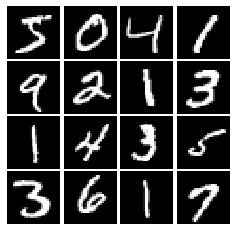

In [6]:
# show a batch
mnist = MNIST(batch_size=16) 
show_images(mnist.X[:16])

## Section 1.1.3 Training code [15 pts]
### Training a GAN!

You can't train a model without a proper training code. Implement the GAN training procedure here following the [original GAN paper](https://arxiv.org/pdf/1406.2661.pdf) and the course slides in the cell below. Note that this code would be reused in the subsequent section, so make sure that it is correctly implemented.

In [0]:
# a giant helper function
def train(D, G, D_solver, G_solver, discriminator_loss, generator_loss,\
              show_every=20, print_every=20, batch_size=128, num_epochs=10, noise_size=100):
    """
    Train loop for GAN.

    The loop will consist of two steps: a discriminator step and a generator step.

    (1) In the discriminator step, first step is to sample noise to generate a fake data batch using the generator. 
    Calculate the discriminator output for real and fake data, and use the output to compute discriminator loss. 
    In code 'd_total_error' is the total discriminator loss.
    
    (2) For the generator step, first step is to sample noise to generate a fake data batch. 
    Get the discriminator output for the fake data batch and use this to compute the generator loss. 
    In code 'g_error' is the generator loss. 
    
    Use the sample_noise function to sample random noise, and the discriminator_loss
    and generator_loss functions for their respective loss computations

    Inputs:
    - D: Discriminator model
    - G: Generator model
    - D_solver: an Optimizer for Discriminator
    - G_solver: an Optimizer for Generator
    - generator_loss: Generator loss
    - discriminator_loss: Discriminator loss
    Returns:
        Nothing
    """
    mnist = MNIST(batch_size=batch_size, shuffle=True)
    
    iter_count = 0
    for epoch in range(num_epochs):
        for (x, _) in mnist:
            with tf.GradientTape() as tape:
                real_data = x
                ##########################################
                # your code   # Discriminator step       # 
                logits_real = D(preprocess_img(real_data))
                noise = sample_noise(batch_size,noise_size)
                fake_images = G(noise) 
                logits_fake = D(tf.reshape(fake_images, [batch_size, 784]))
                d_total_error = discriminator_loss(logits_real,logits_fake)
                ##########################################
                d_gradients = tape.gradient(d_total_error, D.trainable_variables)      
                D_solver.apply_gradients(zip(d_gradients, D.trainable_variables))
            
            with tf.GradientTape() as tape:
                ##########################################
                # your code # Generator step             # 
                noise = sample_noise(batch_size,noise_size)
                fake_images = G(noise)
                gen_logits_fake = D(tf.reshape(fake_images, [batch_size, 784]))
                g_error = generator_loss(gen_logits_fake)
                ##########################################
                g_gradients = tape.gradient(g_error, G.trainable_variables)      
                G_solver.apply_gradients(zip(g_gradients, G.trainable_variables))

            if (iter_count % show_every == 0):
                print('Epoch: {}, Iter: {}, D: {:.4}, G:{:.4}'.format(epoch, iter_count,d_total_error,g_error))
                imgs_numpy = fake_images.cpu().numpy()
                show_images(imgs_numpy[0:16])
                plt.show()
            iter_count += 1
    
    # random noise fed into our generator
    z = sample_noise(batch_size, noise_size)
    # generated images
    G_sample = G(z)
    print('Final images')
    show_images(G_sample[:16])
    plt.show()

### Section 1.1.4 Training on MNIST [5 pts]
#### Train your GAN!
Run the cell belowe to train your GAN model. You should expect results that resemble the following if your loss function and training loop implementations are correct:

Epoch: 0, Iter: 0, D: 1.027, G:0.76
Instructions for updating:
Use tf.identity instead.


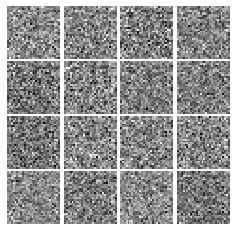

Epoch: 0, Iter: 20, D: 0.6186, G:0.8653


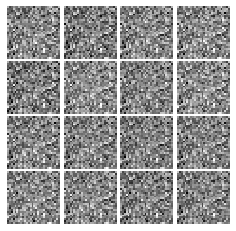

Epoch: 0, Iter: 40, D: 0.4971, G:1.559


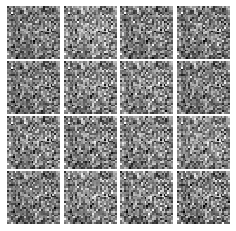

Epoch: 0, Iter: 60, D: 0.7861, G:1.483


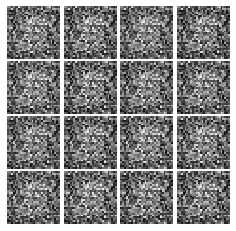

Epoch: 0, Iter: 80, D: 1.071, G:1.261


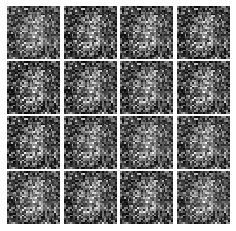

Epoch: 0, Iter: 100, D: 1.552, G:1.499


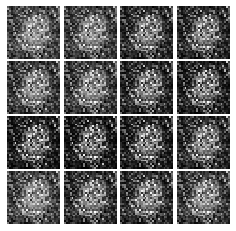

Epoch: 0, Iter: 120, D: 1.95, G:1.353


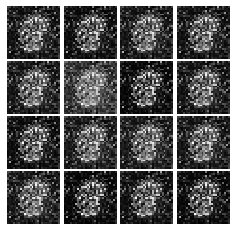

Epoch: 0, Iter: 140, D: 1.231, G:1.368


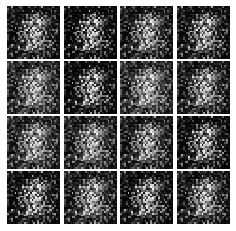

Epoch: 0, Iter: 160, D: 1.988, G:1.063


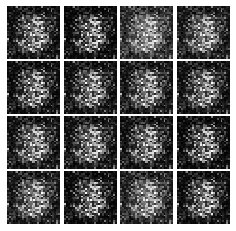

Epoch: 0, Iter: 180, D: 0.8466, G:2.074


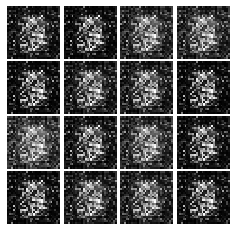

Epoch: 0, Iter: 200, D: 1.441, G:0.9385


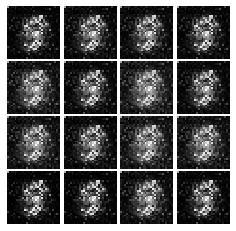

Epoch: 0, Iter: 220, D: 1.621, G:0.8822


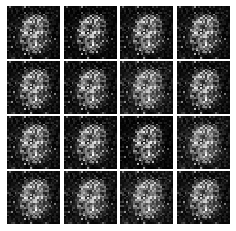

Epoch: 0, Iter: 240, D: 1.079, G:1.741


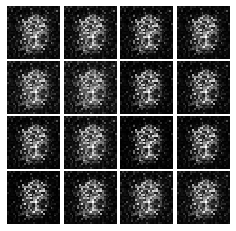

Epoch: 0, Iter: 260, D: 1.094, G:1.172


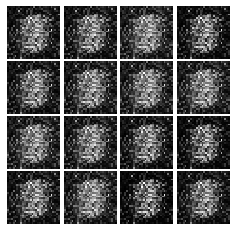

Epoch: 0, Iter: 280, D: 1.226, G:1.48


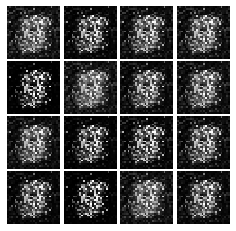

Epoch: 0, Iter: 300, D: 1.026, G:1.906


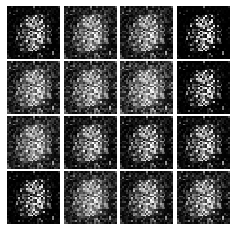

Epoch: 0, Iter: 320, D: 1.083, G:1.504


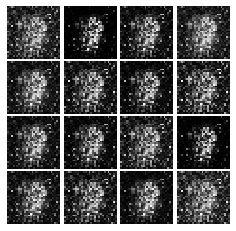

Epoch: 0, Iter: 340, D: 1.212, G:1.261


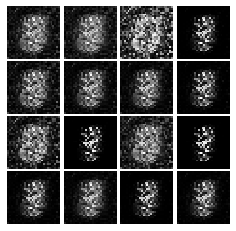

Epoch: 0, Iter: 360, D: 1.125, G:1.371


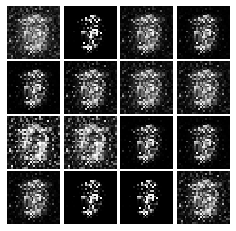

Epoch: 0, Iter: 380, D: 1.113, G:1.049


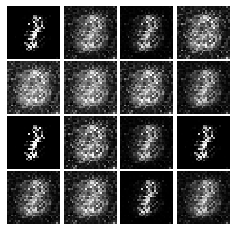

Epoch: 0, Iter: 400, D: 0.8159, G:2.378


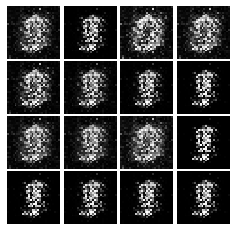

Epoch: 0, Iter: 420, D: 1.062, G:1.62


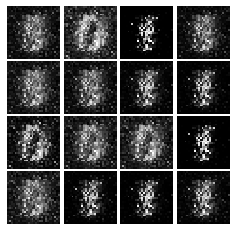

Epoch: 0, Iter: 440, D: 1.155, G:1.473


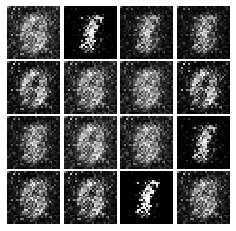

Epoch: 0, Iter: 460, D: 1.097, G:1.109


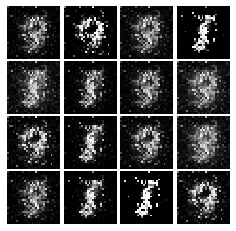

Epoch: 1, Iter: 480, D: 0.9317, G:1.078


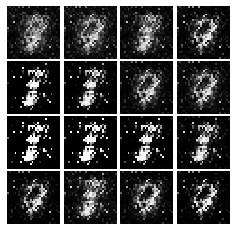

Epoch: 1, Iter: 500, D: 1.385, G:0.9665


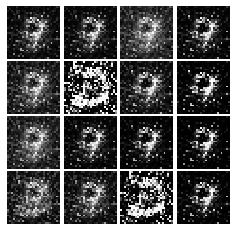

Epoch: 1, Iter: 520, D: 1.461, G:1.103


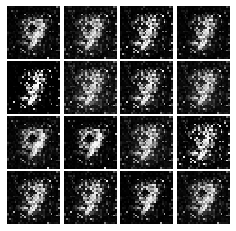

Epoch: 1, Iter: 540, D: 1.355, G:1.522


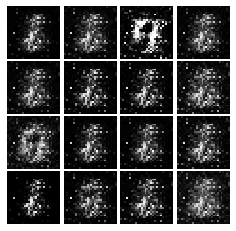

Epoch: 1, Iter: 560, D: 1.126, G:1.327


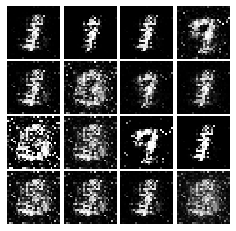

Epoch: 1, Iter: 580, D: 1.038, G:2.655


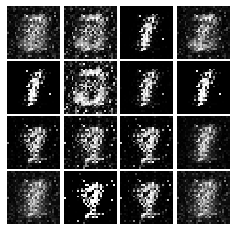

Epoch: 1, Iter: 600, D: 0.9177, G:1.707


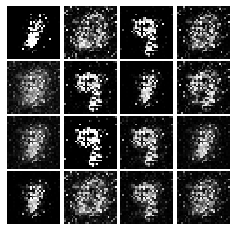

Epoch: 1, Iter: 620, D: 1.429, G:1.376


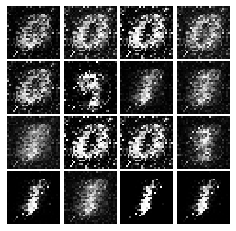

Epoch: 1, Iter: 640, D: 0.7343, G:1.177


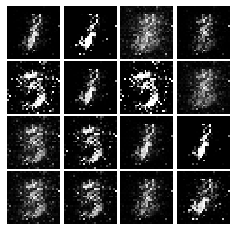

Epoch: 1, Iter: 660, D: 0.88, G:1.753


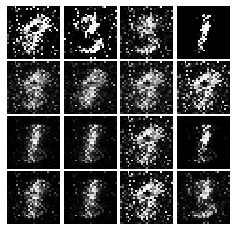

Epoch: 1, Iter: 680, D: 1.049, G:1.382


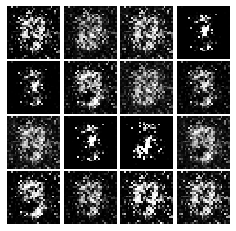

Epoch: 1, Iter: 700, D: 1.151, G:1.628


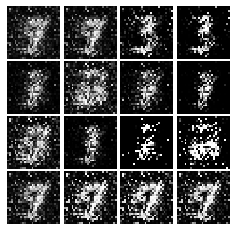

Epoch: 1, Iter: 720, D: 0.967, G:1.964


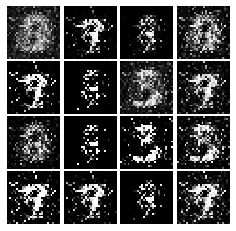

Epoch: 1, Iter: 740, D: 1.18, G:0.9221


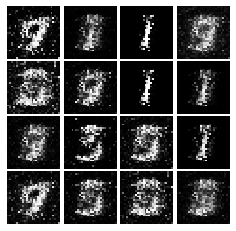

Epoch: 1, Iter: 760, D: 0.9963, G:1.315


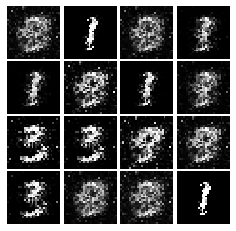

Epoch: 1, Iter: 780, D: 1.033, G:1.166


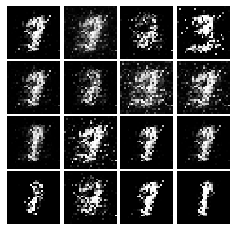

Epoch: 1, Iter: 800, D: 1.206, G:1.148


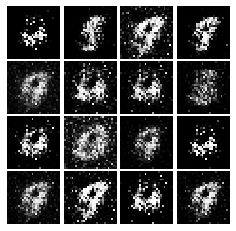

Epoch: 1, Iter: 820, D: 1.167, G:1.653


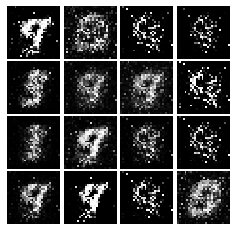

Epoch: 1, Iter: 840, D: 1.012, G:1.263


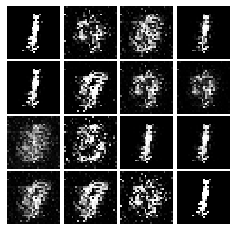

Epoch: 1, Iter: 860, D: 1.062, G:1.357


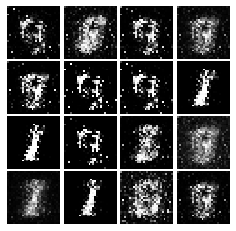

Epoch: 1, Iter: 880, D: 0.9597, G:1.204


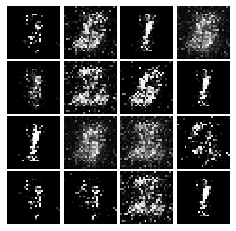

Epoch: 1, Iter: 900, D: 0.9361, G:1.341


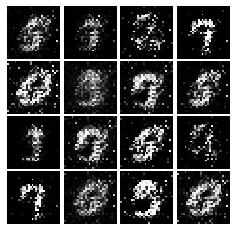

Epoch: 1, Iter: 920, D: 1.171, G:1.044


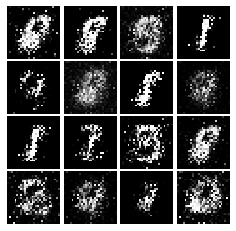

Epoch: 2, Iter: 940, D: 0.9348, G:3.99


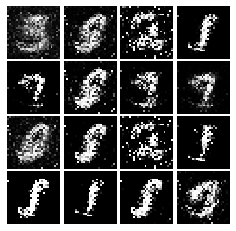

Epoch: 2, Iter: 960, D: 1.093, G:1.043


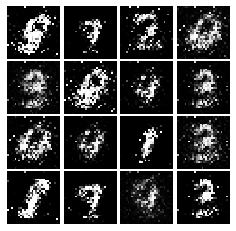

Epoch: 2, Iter: 980, D: 1.281, G:1.374


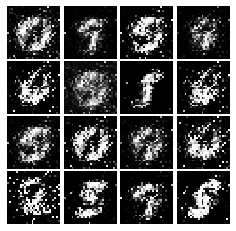

Epoch: 2, Iter: 1000, D: 1.121, G:1.239


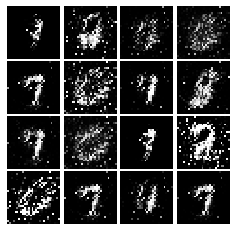

Epoch: 2, Iter: 1020, D: 1.229, G:0.9356


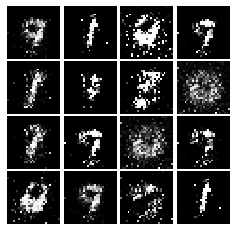

Epoch: 2, Iter: 1040, D: 1.287, G:0.9002


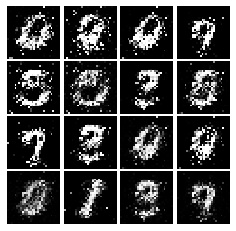

Epoch: 2, Iter: 1060, D: 1.243, G:0.9822


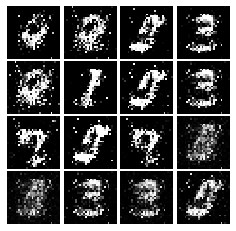

Epoch: 2, Iter: 1080, D: 1.22, G:2.019


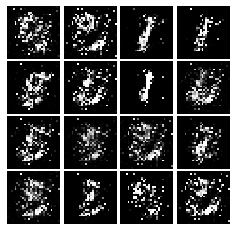

Epoch: 2, Iter: 1100, D: 1.187, G:1.533


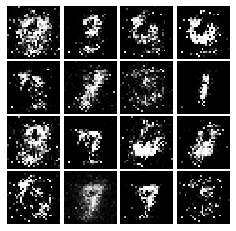

Epoch: 2, Iter: 1120, D: 1.191, G:1.092


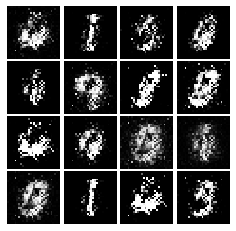

Epoch: 2, Iter: 1140, D: 1.109, G:1.378


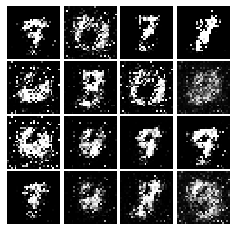

Epoch: 2, Iter: 1160, D: 0.9445, G:1.188


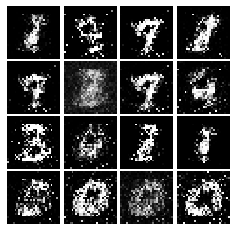

Epoch: 2, Iter: 1180, D: 1.27, G:1.128


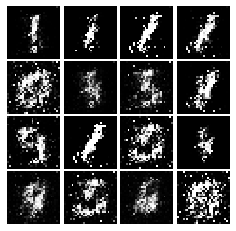

Epoch: 2, Iter: 1200, D: 1.674, G:0.3636


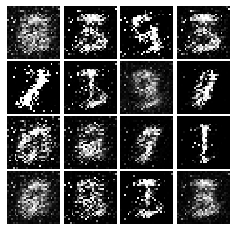

Epoch: 2, Iter: 1220, D: 1.648, G:0.6798


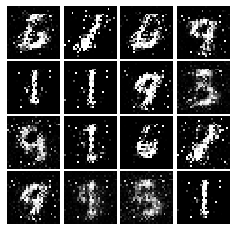

Epoch: 2, Iter: 1240, D: 1.259, G:1.251


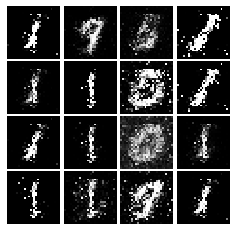

Epoch: 2, Iter: 1260, D: 1.213, G:0.9239


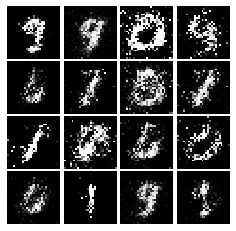

Epoch: 2, Iter: 1280, D: 1.26, G:1.122


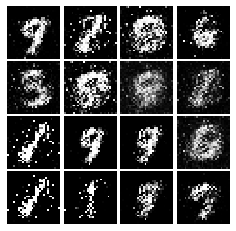

Epoch: 2, Iter: 1300, D: 1.166, G:1.641


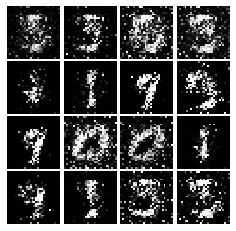

Epoch: 2, Iter: 1320, D: 1.094, G:1.064


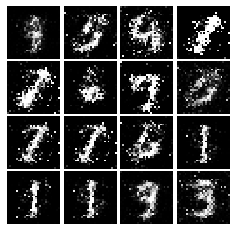

Epoch: 2, Iter: 1340, D: 1.113, G:1.236


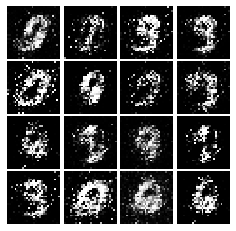

Epoch: 2, Iter: 1360, D: 1.384, G:0.9619


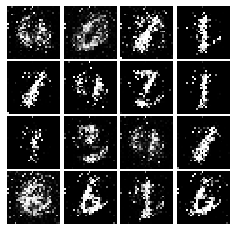

Epoch: 2, Iter: 1380, D: 1.167, G:1.165


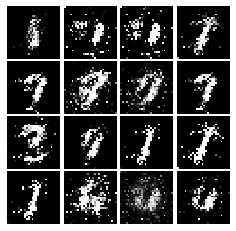

Epoch: 2, Iter: 1400, D: 1.341, G:0.9171


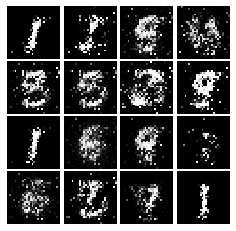

Epoch: 3, Iter: 1420, D: 1.235, G:0.9432


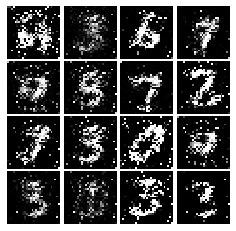

Epoch: 3, Iter: 1440, D: 1.058, G:1.132


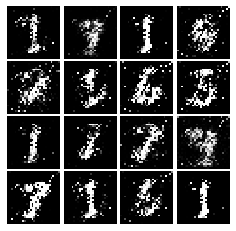

Epoch: 3, Iter: 1460, D: 1.248, G:1.049


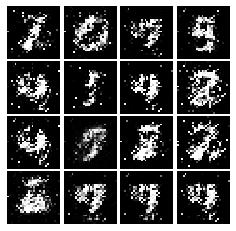

Epoch: 3, Iter: 1480, D: 1.242, G:1.673


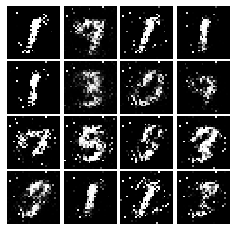

Epoch: 3, Iter: 1500, D: 1.338, G:0.9331


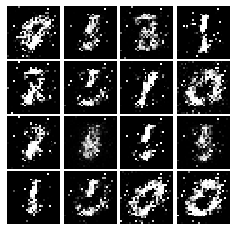

Epoch: 3, Iter: 1520, D: 1.33, G:1.119


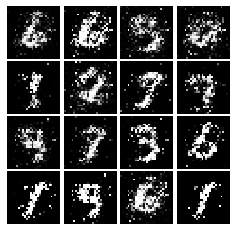

Epoch: 3, Iter: 1540, D: 1.248, G:1.107


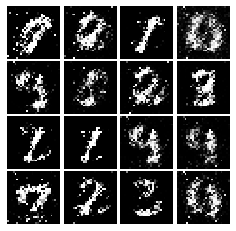

Epoch: 3, Iter: 1560, D: 1.163, G:1.082


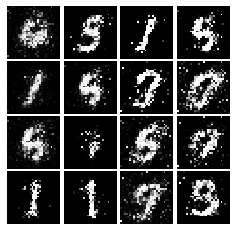

Epoch: 3, Iter: 1580, D: 1.367, G:1.03


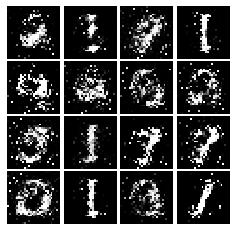

Epoch: 3, Iter: 1600, D: 1.276, G:0.4151


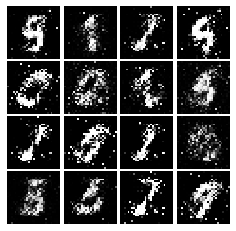

Epoch: 3, Iter: 1620, D: 1.166, G:1.12


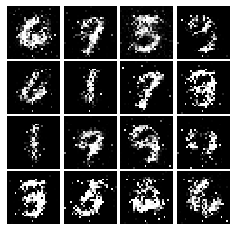

Epoch: 3, Iter: 1640, D: 1.244, G:0.9863


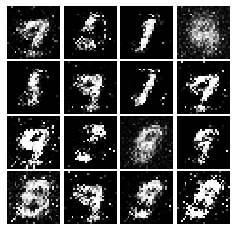

Epoch: 3, Iter: 1660, D: 1.093, G:1.165


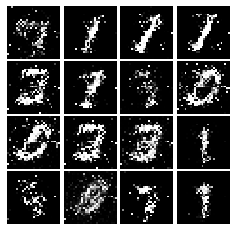

Epoch: 3, Iter: 1680, D: 1.112, G:1.501


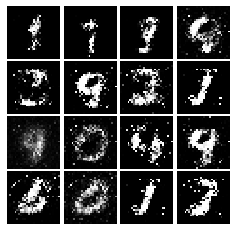

Epoch: 3, Iter: 1700, D: 1.36, G:1.193


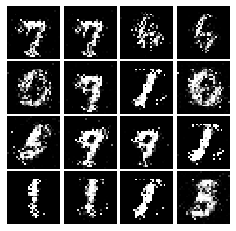

Epoch: 3, Iter: 1720, D: 1.262, G:0.8859


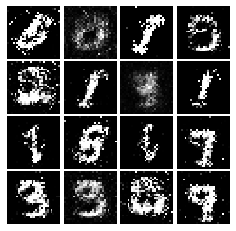

Epoch: 3, Iter: 1740, D: 1.185, G:0.6775


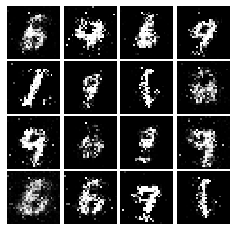

Epoch: 3, Iter: 1760, D: 1.193, G:0.9208


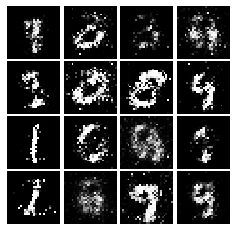

Epoch: 3, Iter: 1780, D: 1.453, G:0.9966


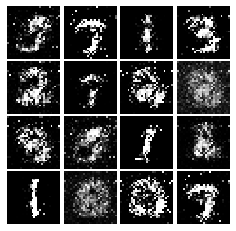

Epoch: 3, Iter: 1800, D: 1.521, G:0.817


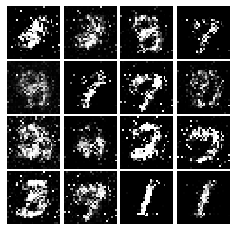

Epoch: 3, Iter: 1820, D: 1.399, G:0.8468


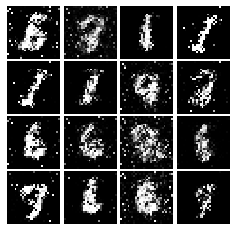

Epoch: 3, Iter: 1840, D: 1.245, G:0.8514


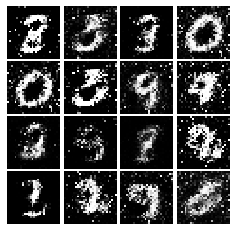

Epoch: 3, Iter: 1860, D: 1.281, G:0.9341


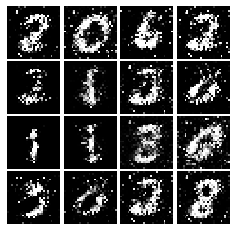

Epoch: 4, Iter: 1880, D: 1.254, G:0.931


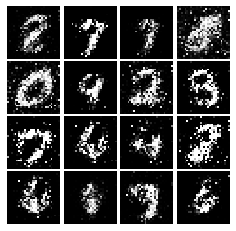

Epoch: 4, Iter: 1900, D: 1.236, G:1.125


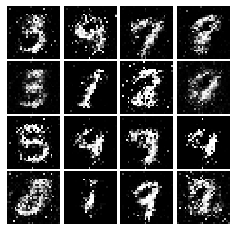

Epoch: 4, Iter: 1920, D: 1.277, G:0.918


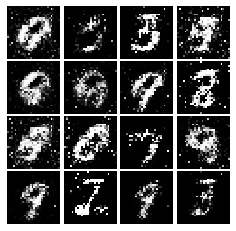

Epoch: 4, Iter: 1940, D: 1.164, G:1.011


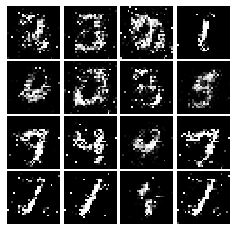

Epoch: 4, Iter: 1960, D: 1.351, G:0.8657


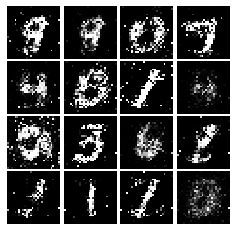

Epoch: 4, Iter: 1980, D: 1.208, G:0.8214


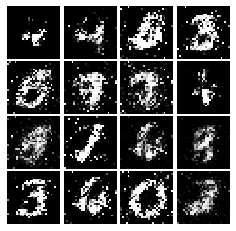

Epoch: 4, Iter: 2000, D: 1.217, G:1.052


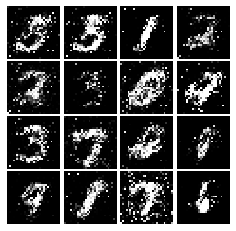

Epoch: 4, Iter: 2020, D: 1.222, G:0.8315


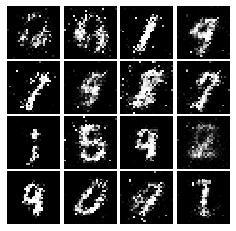

Epoch: 4, Iter: 2040, D: 1.339, G:0.8813


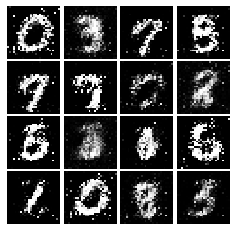

Epoch: 4, Iter: 2060, D: 1.321, G:0.8593


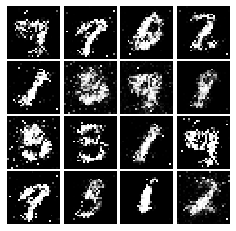

Epoch: 4, Iter: 2080, D: 1.434, G:1.256


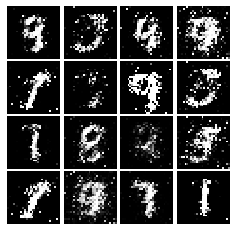

Epoch: 4, Iter: 2100, D: 1.252, G:0.8983


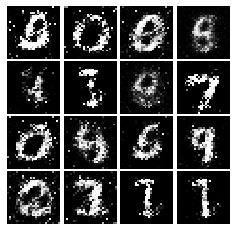

Epoch: 4, Iter: 2120, D: 1.435, G:0.8924


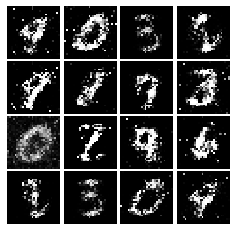

Epoch: 4, Iter: 2140, D: 1.249, G:0.8143


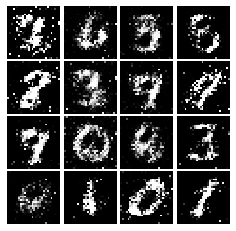

Epoch: 4, Iter: 2160, D: 1.361, G:0.8936


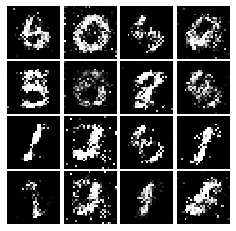

Epoch: 4, Iter: 2180, D: 1.343, G:0.9198


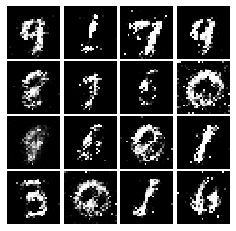

Epoch: 4, Iter: 2200, D: 1.255, G:0.8894


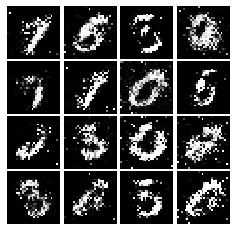

Epoch: 4, Iter: 2220, D: 1.322, G:0.9217


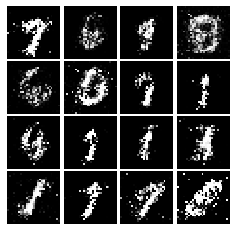

Epoch: 4, Iter: 2240, D: 1.305, G:0.8607


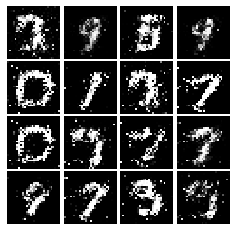

Epoch: 4, Iter: 2260, D: 1.448, G:0.8899


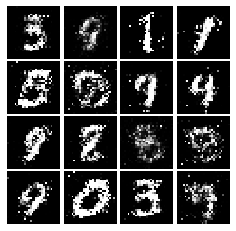

Epoch: 4, Iter: 2280, D: 1.386, G:0.9935


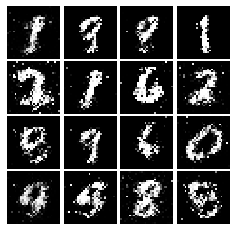

Epoch: 4, Iter: 2300, D: 1.203, G:0.8391


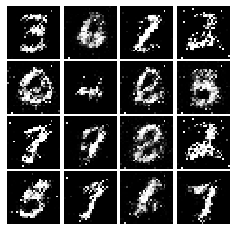

Epoch: 4, Iter: 2320, D: 1.252, G:0.9131


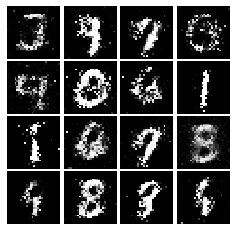

Epoch: 4, Iter: 2340, D: 1.217, G:0.9252


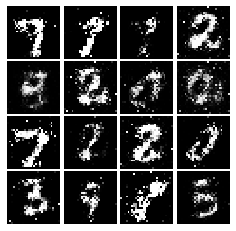

Epoch: 5, Iter: 2360, D: 1.274, G:0.8613


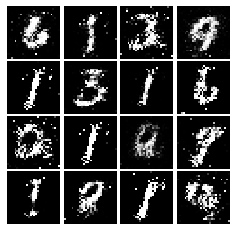

Epoch: 5, Iter: 2380, D: 1.327, G:0.7887


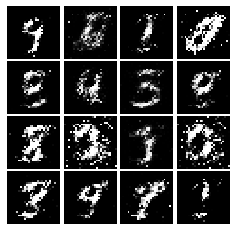

Epoch: 5, Iter: 2400, D: 1.29, G:0.9851


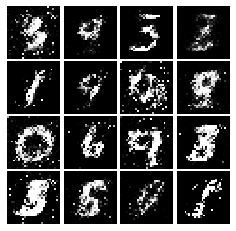

Epoch: 5, Iter: 2420, D: 1.241, G:0.9067


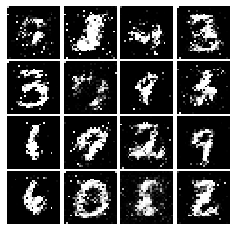

Epoch: 5, Iter: 2440, D: 1.31, G:0.9103


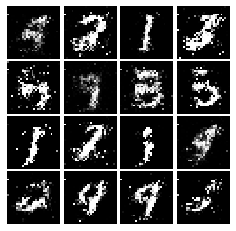

Epoch: 5, Iter: 2460, D: 1.254, G:0.9466


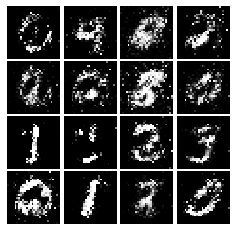

Epoch: 5, Iter: 2480, D: 1.262, G:0.8316


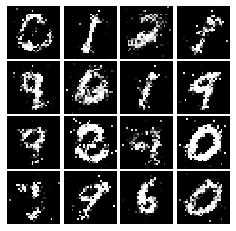

Epoch: 5, Iter: 2500, D: 1.263, G:0.8613


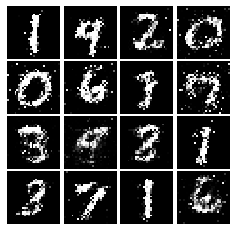

Epoch: 5, Iter: 2520, D: 1.437, G:1.044


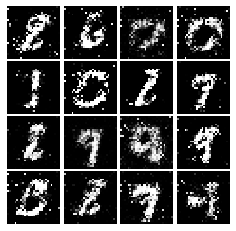

Epoch: 5, Iter: 2540, D: 1.437, G:0.8802


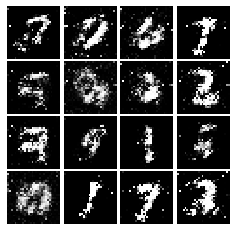

Epoch: 5, Iter: 2560, D: 1.33, G:0.9254


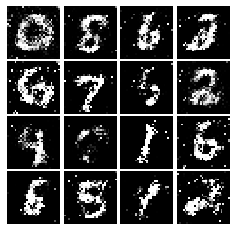

Epoch: 5, Iter: 2580, D: 1.28, G:0.9263


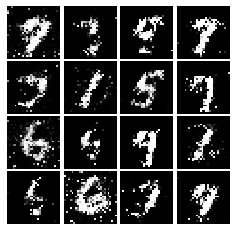

Epoch: 5, Iter: 2600, D: 1.505, G:0.7265


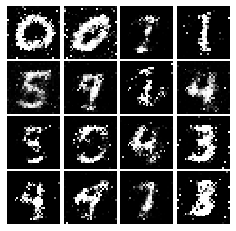

Epoch: 5, Iter: 2620, D: 1.315, G:0.8409


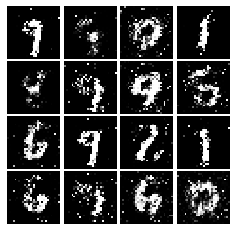

Epoch: 5, Iter: 2640, D: 1.22, G:1.198


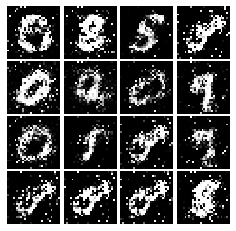

Epoch: 5, Iter: 2660, D: 1.271, G:0.8302


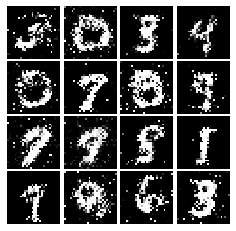

Epoch: 5, Iter: 2680, D: 1.299, G:0.8894


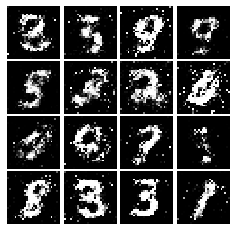

Epoch: 5, Iter: 2700, D: 1.394, G:0.8521


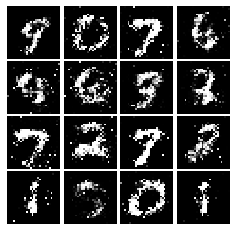

Epoch: 5, Iter: 2720, D: 1.348, G:0.8445


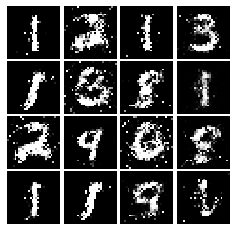

Epoch: 5, Iter: 2740, D: 1.148, G:0.8269


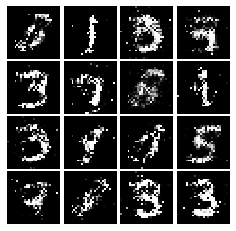

Epoch: 5, Iter: 2760, D: 1.364, G:1.018


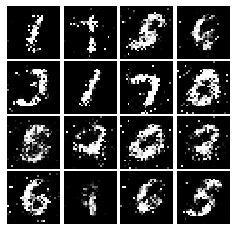

Epoch: 5, Iter: 2780, D: 1.243, G:0.841


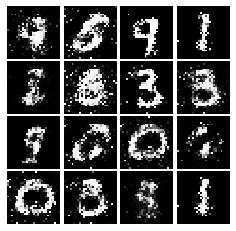

Epoch: 5, Iter: 2800, D: 1.261, G:0.828


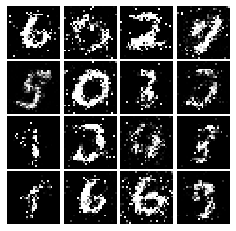

Epoch: 6, Iter: 2820, D: 1.26, G:0.9691


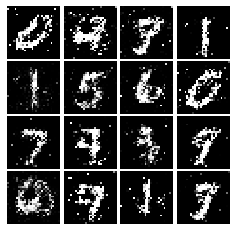

Epoch: 6, Iter: 2840, D: 1.319, G:0.885


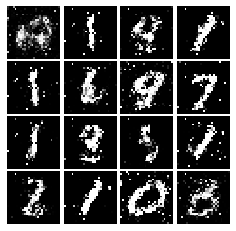

Epoch: 6, Iter: 2860, D: 1.297, G:0.828


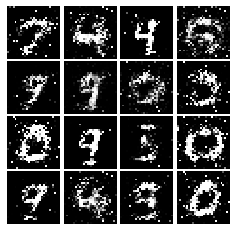

Epoch: 6, Iter: 2880, D: 1.157, G:0.8598


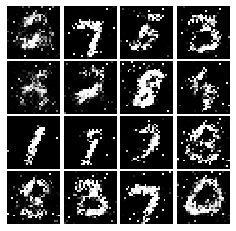

Epoch: 6, Iter: 2900, D: 1.339, G:0.8383


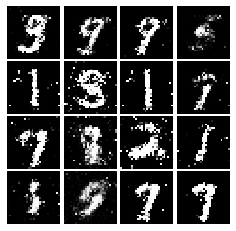

Epoch: 6, Iter: 2920, D: 1.346, G:0.7531


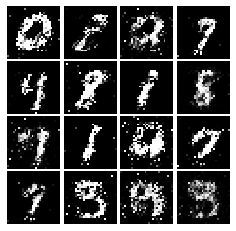

Epoch: 6, Iter: 2940, D: 1.216, G:1.001


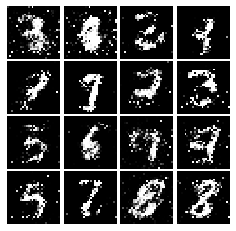

Epoch: 6, Iter: 2960, D: 1.301, G:0.8145


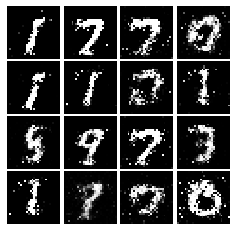

Epoch: 6, Iter: 2980, D: 1.318, G:0.8139


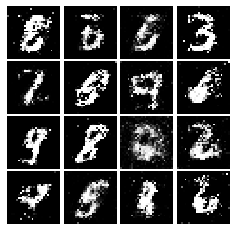

Epoch: 6, Iter: 3000, D: 1.342, G:0.9787


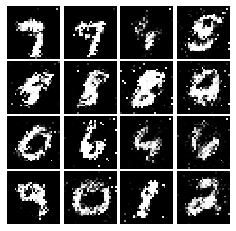

Epoch: 6, Iter: 3020, D: 1.333, G:0.8482


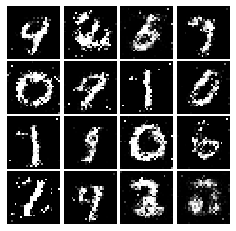

Epoch: 6, Iter: 3040, D: 1.361, G:0.8253


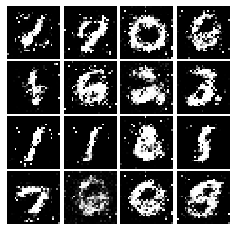

Epoch: 6, Iter: 3060, D: 1.269, G:0.8775


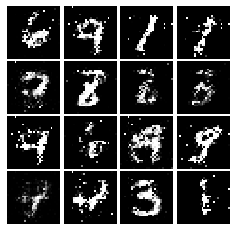

Epoch: 6, Iter: 3080, D: 1.359, G:0.8187


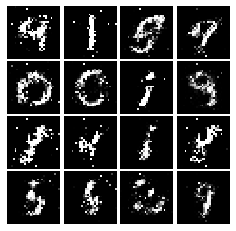

Epoch: 6, Iter: 3100, D: 1.168, G:0.8055


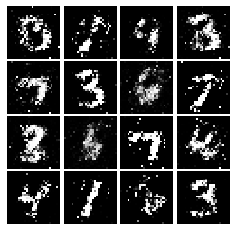

Epoch: 6, Iter: 3120, D: 1.238, G:0.8967


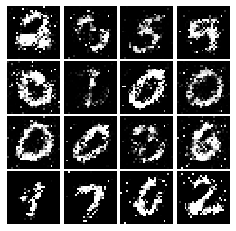

Epoch: 6, Iter: 3140, D: 1.311, G:0.8149


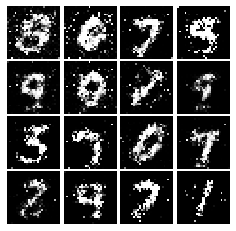

Epoch: 6, Iter: 3160, D: 1.269, G:0.8317


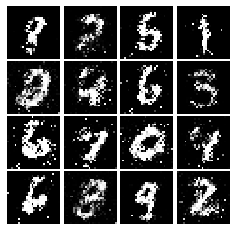

Epoch: 6, Iter: 3180, D: 1.306, G:0.8481


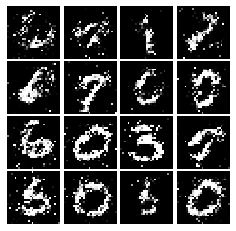

Epoch: 6, Iter: 3200, D: 1.343, G:0.8449


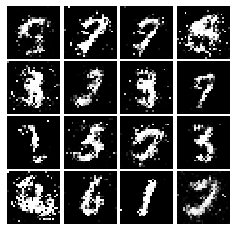

Epoch: 6, Iter: 3220, D: 1.329, G:0.7812


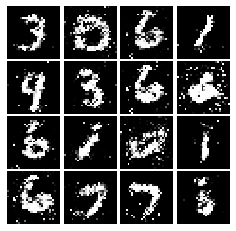

Epoch: 6, Iter: 3240, D: 1.273, G:0.7943


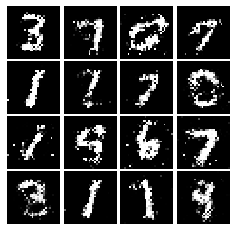

Epoch: 6, Iter: 3260, D: 1.319, G:0.7485


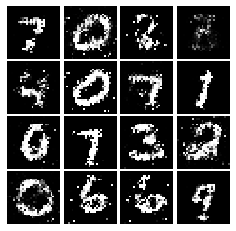

Epoch: 6, Iter: 3280, D: 1.239, G:0.785


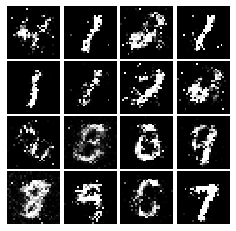

Epoch: 7, Iter: 3300, D: 1.282, G:0.8326


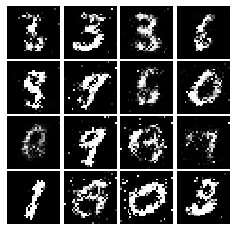

Epoch: 7, Iter: 3320, D: 1.361, G:0.6947


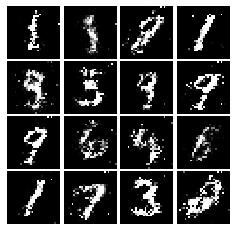

Epoch: 7, Iter: 3340, D: 1.278, G:1.015


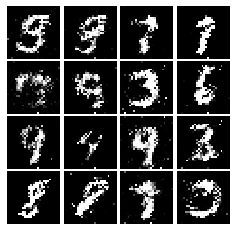

Epoch: 7, Iter: 3360, D: 1.385, G:0.8035


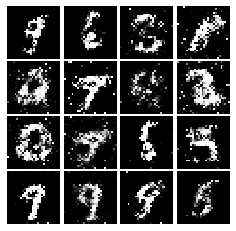

Epoch: 7, Iter: 3380, D: 1.291, G:0.7733


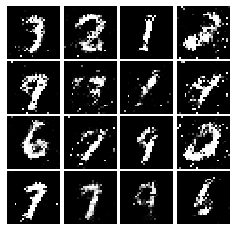

Epoch: 7, Iter: 3400, D: 1.378, G:0.7874


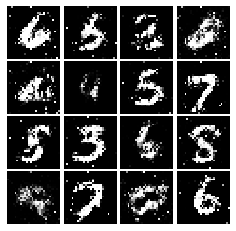

Epoch: 7, Iter: 3420, D: 1.362, G:0.812


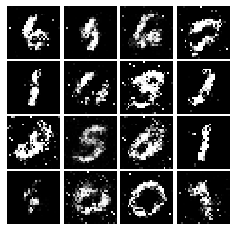

Epoch: 7, Iter: 3440, D: 1.394, G:0.8893


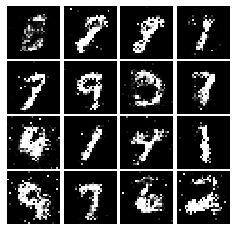

Epoch: 7, Iter: 3460, D: 1.339, G:0.8087


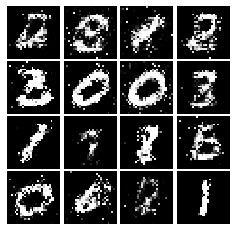

Epoch: 7, Iter: 3480, D: 1.371, G:0.7854


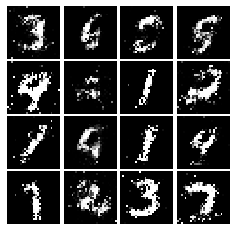

Epoch: 7, Iter: 3500, D: 1.321, G:0.8642


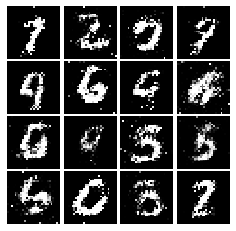

Epoch: 7, Iter: 3520, D: 1.341, G:0.9107


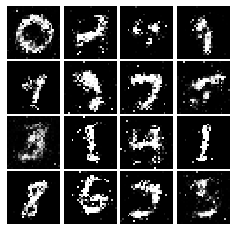

Epoch: 7, Iter: 3540, D: 1.412, G:0.8522


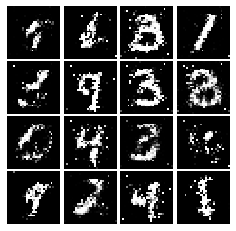

Epoch: 7, Iter: 3560, D: 1.31, G:0.7627


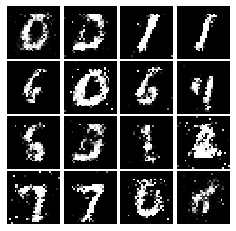

Epoch: 7, Iter: 3580, D: 1.316, G:0.8221


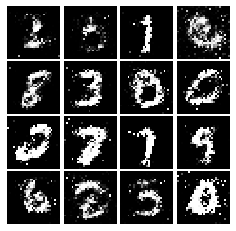

Epoch: 7, Iter: 3600, D: 1.312, G:0.8089


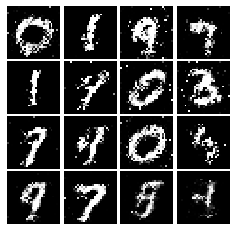

Epoch: 7, Iter: 3620, D: 1.31, G:0.7958


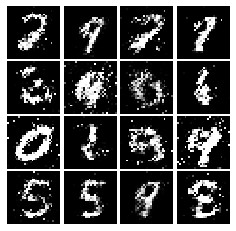

Epoch: 7, Iter: 3640, D: 1.332, G:0.7941


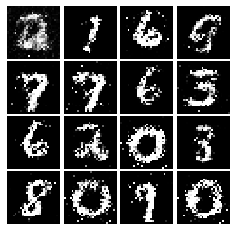

Epoch: 7, Iter: 3660, D: 1.33, G:0.7876


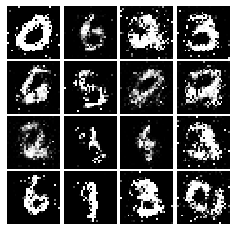

Epoch: 7, Iter: 3680, D: 1.398, G:0.7718


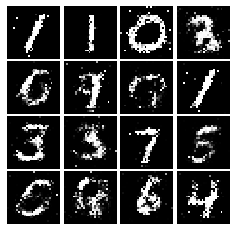

Epoch: 7, Iter: 3700, D: 1.312, G:0.7234


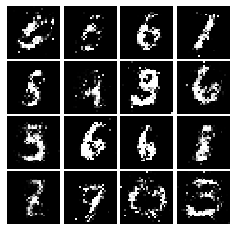

Epoch: 7, Iter: 3720, D: 1.361, G:0.7401


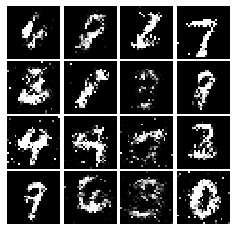

Epoch: 7, Iter: 3740, D: 1.338, G:0.7641


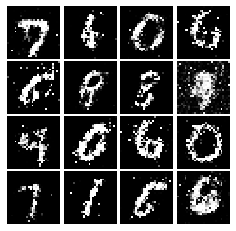

Epoch: 8, Iter: 3760, D: 1.356, G:0.8428


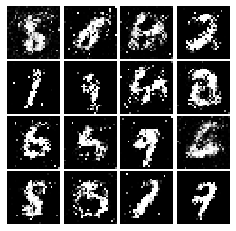

Epoch: 8, Iter: 3780, D: 1.329, G:0.7505


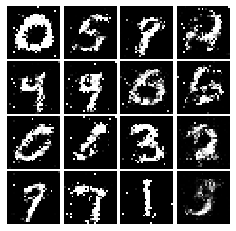

Epoch: 8, Iter: 3800, D: 1.274, G:0.7491


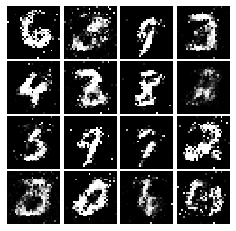

Epoch: 8, Iter: 3820, D: 1.373, G:0.7805


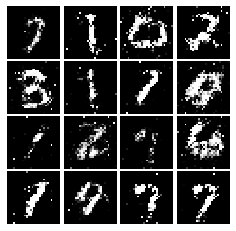

Epoch: 8, Iter: 3840, D: 1.343, G:0.7308


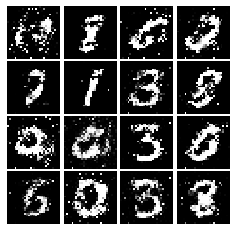

Epoch: 8, Iter: 3860, D: 1.293, G:0.7581


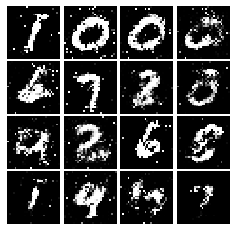

Epoch: 8, Iter: 3880, D: 1.289, G:0.7629


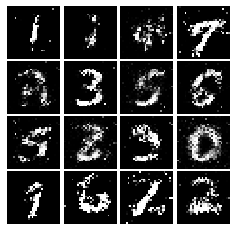

Epoch: 8, Iter: 3900, D: 1.386, G:0.8598


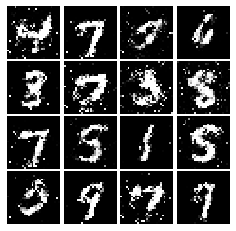

Epoch: 8, Iter: 3920, D: 1.317, G:0.7345


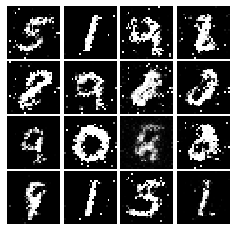

Epoch: 8, Iter: 3940, D: 1.363, G:0.7701


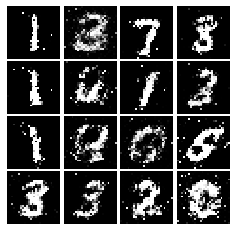

Epoch: 8, Iter: 3960, D: 1.345, G:0.761


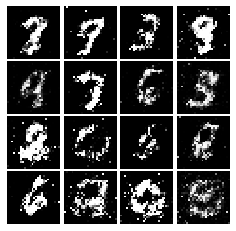

Epoch: 8, Iter: 3980, D: 1.329, G:0.8195


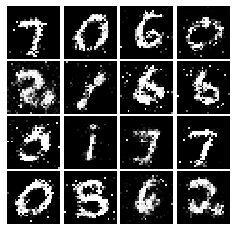

Epoch: 8, Iter: 4000, D: 1.329, G:0.748


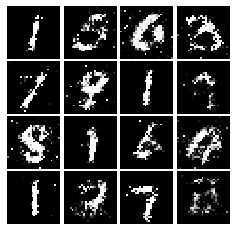

Epoch: 8, Iter: 4020, D: 1.314, G:0.7099


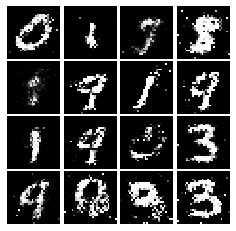

Epoch: 8, Iter: 4040, D: 1.295, G:0.7514


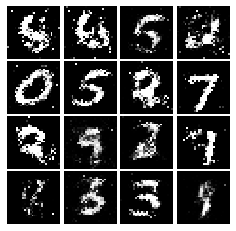

Epoch: 8, Iter: 4060, D: 1.321, G:0.8118


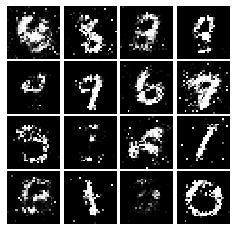

Epoch: 8, Iter: 4080, D: 1.386, G:0.7681


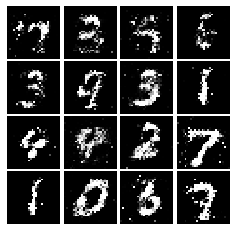

Epoch: 8, Iter: 4100, D: 1.391, G:0.7002


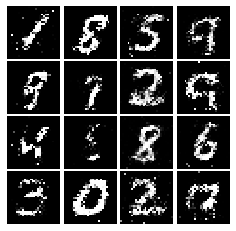

Epoch: 8, Iter: 4120, D: 1.335, G:0.7393


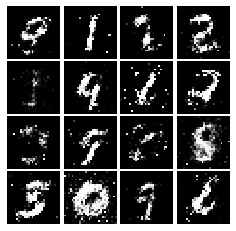

Epoch: 8, Iter: 4140, D: 1.354, G:0.8514


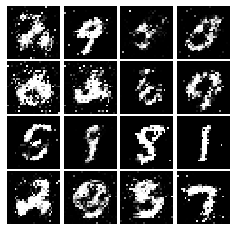

Epoch: 8, Iter: 4160, D: 1.348, G:0.8276


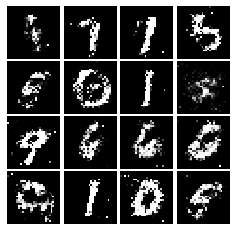

Epoch: 8, Iter: 4180, D: 1.425, G:0.8331


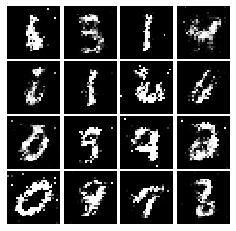

Epoch: 8, Iter: 4200, D: 1.356, G:0.778


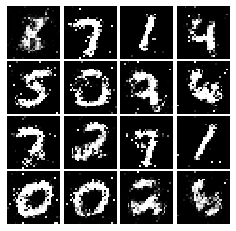

Epoch: 8, Iter: 4220, D: 1.364, G:0.937


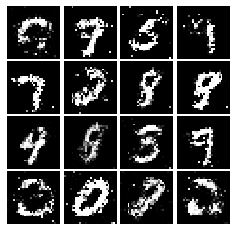

Epoch: 9, Iter: 4240, D: 1.344, G:0.8124


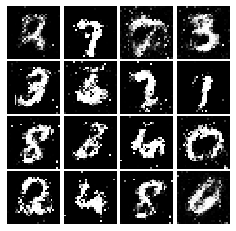

Epoch: 9, Iter: 4260, D: 1.389, G:0.7224


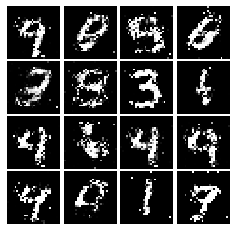

Epoch: 9, Iter: 4280, D: 1.423, G:0.9747


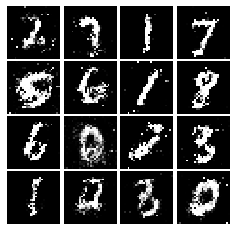

Epoch: 9, Iter: 4300, D: 1.369, G:0.8451


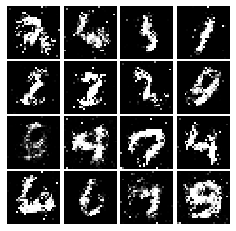

Epoch: 9, Iter: 4320, D: 1.488, G:0.7723


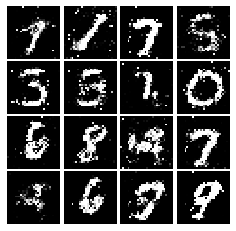

Epoch: 9, Iter: 4340, D: 1.353, G:0.8849


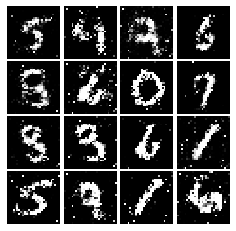

Epoch: 9, Iter: 4360, D: 1.33, G:0.8247


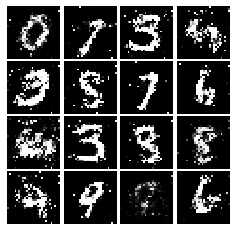

Epoch: 9, Iter: 4380, D: 1.395, G:0.9126


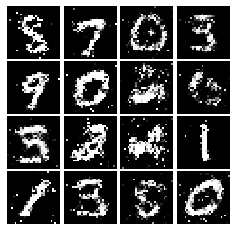

Epoch: 9, Iter: 4400, D: 1.32, G:0.7214


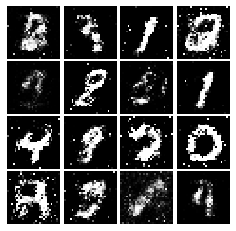

Epoch: 9, Iter: 4420, D: 1.346, G:0.7637


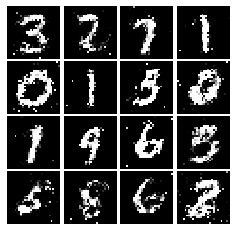

Epoch: 9, Iter: 4440, D: 1.311, G:0.7147


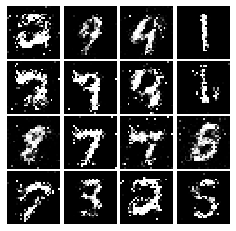

Epoch: 9, Iter: 4460, D: 1.336, G:0.7092


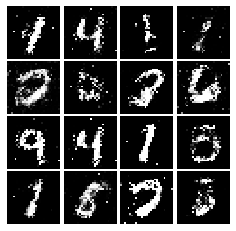

Epoch: 9, Iter: 4480, D: 1.327, G:0.7818


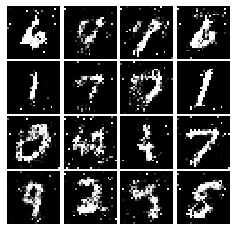

Epoch: 9, Iter: 4500, D: 1.471, G:0.7602


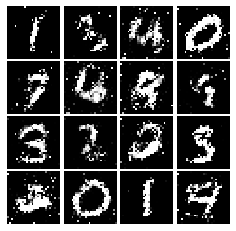

Epoch: 9, Iter: 4520, D: 1.374, G:0.7931


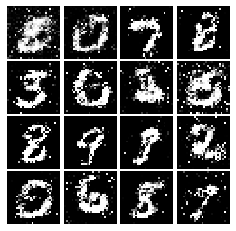

Epoch: 9, Iter: 4540, D: 1.319, G:0.8525


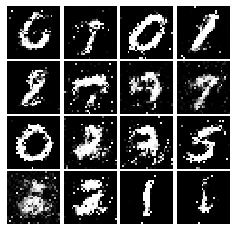

Epoch: 9, Iter: 4560, D: 1.316, G:0.7785


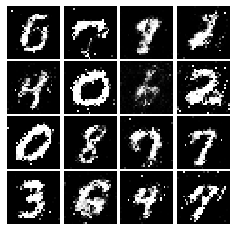

Epoch: 9, Iter: 4580, D: 1.385, G:0.7554


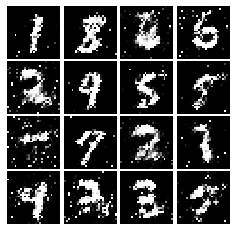

Epoch: 9, Iter: 4600, D: 1.392, G:0.7654


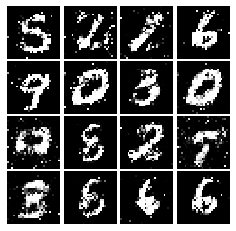

Epoch: 9, Iter: 4620, D: 1.383, G:0.801


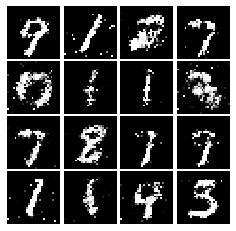

Epoch: 9, Iter: 4640, D: 1.304, G:0.8082


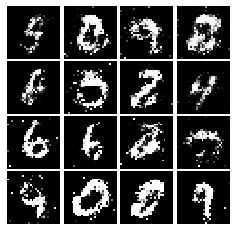

Epoch: 9, Iter: 4660, D: 1.381, G:0.8475


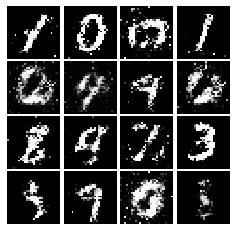

Epoch: 9, Iter: 4680, D: 1.355, G:0.7587


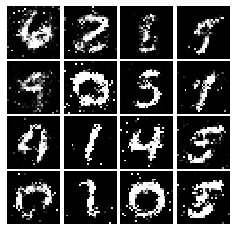

Final images


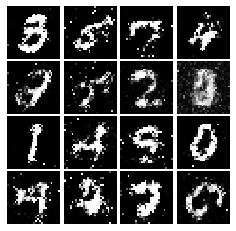

In [8]:
D = discriminator()
G = generator()

# Use the function you wrote earlier to get optimizers for the Discriminator and the Generator
D_solver = tf.keras.optimizers.Adam(learning_rate=1e-3, beta_1=0.5, beta_2=0.999)
G_solver = tf.keras.optimizers.Adam(learning_rate=1e-3, beta_1=0.5, beta_2=0.999)
    
# Run it!
#print(G.summary())
train(D, G, D_solver, G_solver, discriminator_loss, generator_loss)

Well that wasn't so hard, was it? After the first epoch, you should see fuzzy outlines, clear shapes as you approach epoch 3, and decent shapes, about half of which will be sharp and clearly recognizable as we pass epoch 5. In our case, we'll simply train D(x) and G(z) with one batch each every iteration. However, papers often experiment with different schedules of training D(x) and G(z), sometimes doing one for more steps than the other, or even training each one until the loss gets "good enough" and then switching to training the other. 

## Section 1.2 Least-square GAN Loss
### Section 1.2.1 LSGAN Loss [10 pts]
We'll now look at [Least Squares GAN](https://arxiv.org/abs/1611.04076), a newer, more stable alernative to the original GAN loss function. For this part, all we have to do is change the loss function and retrain the model. We'll implement equation (9) in the paper, with the generator loss:
$$\ell_G  =  \frac{1}{2}\mathbb{E}_{z \sim p(z)}\left[\left(D(G(z))-1\right)^2\right]$$
and the discriminator loss:
$$ \ell_D = \frac{1}{2}\mathbb{E}_{x \sim p_\text{data}}\left[\left(D(x)-1\right)^2\right] + \frac{1}{2}\mathbb{E}_{z \sim p(z)}\left[ \left(D(G(z))\right)^2\right]$$
Fill in the `ls_discriminator_loss` and `ls_generator_loss` in the cell below.

**HINTS**: Instead of computing the expectation, we will be averaging over elements of the minibatch, so make sure to combine the loss by averaging instead of summing. When plugging in for $D(x)$ and $D(G(z))$ use the direct output from the discriminator (`scores_real` and `scores_fake`).

In [0]:
def ls_discriminator_loss(logits_real, logits_fake):
    """
    Compute the Least-Squares GAN loss for the discriminator.

    Inputs:
    - logits_real: Tensor of shape (N,) giving scores for the real data.
    - logits_fake: Tensor of shape (N,) giving scores for the fake data.
    - N is the Batch size
 
    Outputs:
    - loss: A Tensor containing the loss.
    """
 
    loss = None
    
    ####################################
    # your code here. 
    ###################################
    loss =  0.5*(tf.reduce_mean(tf.square(logits_real-1))) + 0.5*(tf.reduce_mean(tf.square(
        logits_fake)))
    ##########       END      ##########
    return loss

def ls_generator_loss(logits_fake):
    """
    Computes the Least-Squares GAN loss for the generator.
 
    Inputs:
    - logits_fake: TensorFlow Tensor of shape (N,) giving scores for the fake data.
 
    Outputs:
    - loss: A TensorFlow Tensor containing the loss.
    """

    loss = None
 
    ####################################
    #          YOUR CODE HERE          #
    ####################################
    loss = 0.5*(tf.reduce_mean(tf.square(logits_fake-1)))
    ##########       END      ##########
    return loss    

### Section 1.2.2 Train LSGAN [5 pts]
Similarly, train your LSGAN on MNIST dataset. You should expect results that resemble the following if your loss function and training loop implementations are correct:

<img src="files/gan_samples/mnist_ls.jpg" width=300>

In [0]:
# a giant helper function
def train(D, G, D_solver, G_solver, ls_discriminator_loss, ls_generator_loss,\
              show_every=20, print_every=20, batch_size=128, num_epochs=10, noise_size=100):
    """
    Train loop for GAN.

    The loop will consist of two steps: a discriminator step and a generator step.

    (1) In the discriminator step, first step is to sample noise to generate a fake data batch using the generator. 
    Calculate the discriminator output for real and fake data, and use the output to compute discriminator loss. 
    In code 'd_total_error' is the total discriminator loss.
    
    (2) For the generator step, first step is to sample noise to generate a fake data batch. 
    Get the discriminator output for the fake data batch and use this to compute the generator loss. 
    In code 'g_error' is the generator loss. 
    
    Use the sample_noise function to sample random noise, and the discriminator_loss
    and generator_loss functions for their respective loss computations

    Inputs:
    - D: Discriminator model
    - G: Generator model
    - D_solver: an Optimizer for Discriminator
    - G_solver: an Optimizer for Generator
    - generator_loss: Generator loss
    - discriminator_loss: Discriminator loss
    Returns:
        Nothing
    """
    mnist = MNIST(batch_size=batch_size, shuffle=True)
    
    iter_count = 0
    for epoch in range(num_epochs):
        for (x, _) in mnist:
            with tf.GradientTape() as tape:
                real_data = x
                ##########################################
                # your code   # Discriminator step       # 
                logits_real = D(preprocess_img(real_data))
                noise = sample_noise(batch_size,noise_size)
                fake_images = G(noise) 
                logits_fake = D(tf.reshape(fake_images, [batch_size, 784]))
                d_total_error = ls_discriminator_loss(logits_real,logits_fake)
                ##########################################
                d_gradients = tape.gradient(d_total_error, D.trainable_variables)      
                D_solver.apply_gradients(zip(d_gradients, D.trainable_variables))
            
            with tf.GradientTape() as tape:
                ##########################################
                # your code # Generator step             # 
                noise = sample_noise(batch_size,noise_size)
                fake_images = G(noise)
                gen_logits_fake = D(tf.reshape(fake_images, [batch_size, 784]))
                g_error = ls_generator_loss(gen_logits_fake)
                ##########################################
                g_gradients = tape.gradient(g_error, G.trainable_variables)      
                G_solver.apply_gradients(zip(g_gradients, G.trainable_variables))

            if (iter_count % show_every == 0):
                print('Epoch: {}, Iter: {}, D: {:.4}, G:{:.4}'.format(epoch, iter_count,d_total_error,g_error))
                imgs_numpy = fake_images.cpu().numpy()
                show_images(imgs_numpy[0:16])
                plt.show()
            iter_count += 1
    
    # random noise fed into our generator
    z = sample_noise(batch_size, noise_size)
    # generated images
    G_sample = G(z)
    print('Final images')
    show_images(G_sample[:16])
    plt.show()

Epoch: 0, Iter: 0, D: 0.4317, G:0.3303


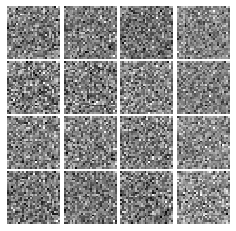

Epoch: 0, Iter: 20, D: 0.07908, G:0.8886


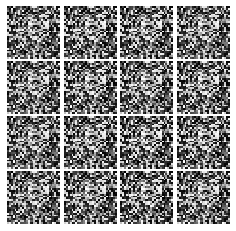

Epoch: 0, Iter: 40, D: 0.06353, G:0.8117


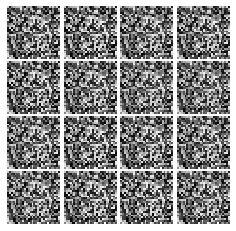

Epoch: 0, Iter: 60, D: 0.04979, G:0.8162


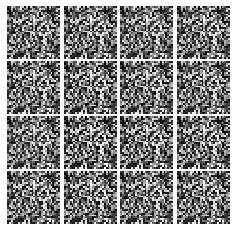

Epoch: 0, Iter: 80, D: 0.05573, G:0.6807


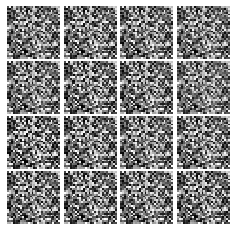

Epoch: 0, Iter: 100, D: 0.0403, G:1.141


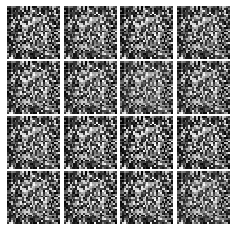

Epoch: 0, Iter: 120, D: 0.05416, G:0.4202


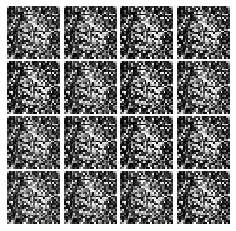

Epoch: 0, Iter: 140, D: 0.01539, G:0.3675


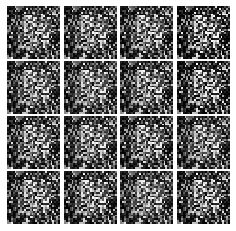

Epoch: 0, Iter: 160, D: 0.004604, G:0.6179


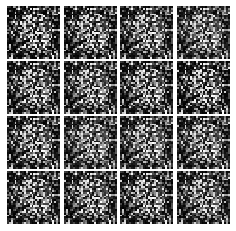

Epoch: 0, Iter: 180, D: 0.005018, G:0.6129


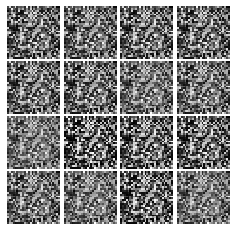

Epoch: 0, Iter: 200, D: 0.008841, G:0.636


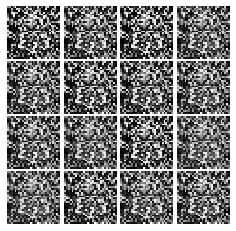

Epoch: 0, Iter: 220, D: 0.002401, G:0.5275


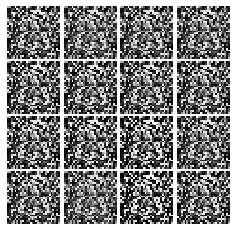

Epoch: 0, Iter: 240, D: 0.005306, G:0.3623


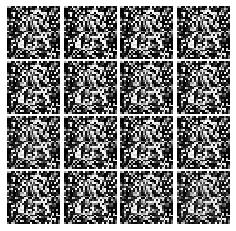

Epoch: 0, Iter: 260, D: 0.003197, G:0.539


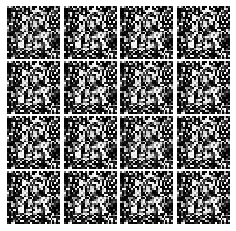

Epoch: 0, Iter: 280, D: 0.004861, G:0.429


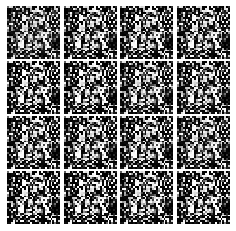

Epoch: 0, Iter: 300, D: 0.01211, G:0.8853


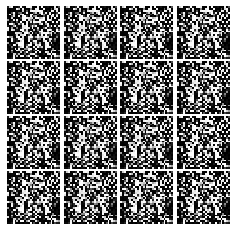

Epoch: 0, Iter: 320, D: 0.001664, G:0.5405


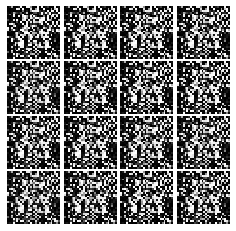

Epoch: 0, Iter: 340, D: 0.002467, G:0.5488


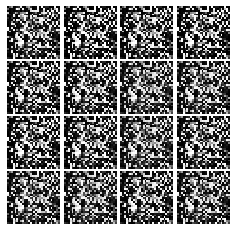

Epoch: 0, Iter: 360, D: 0.03721, G:1.418


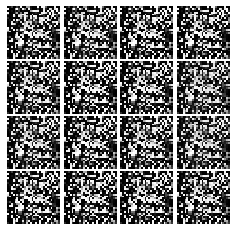

Epoch: 0, Iter: 380, D: 0.003252, G:0.6434


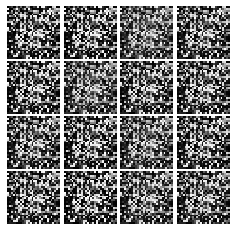

Epoch: 0, Iter: 400, D: 0.009199, G:1.019


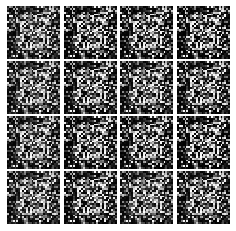

Epoch: 0, Iter: 420, D: 0.1132, G:1.122


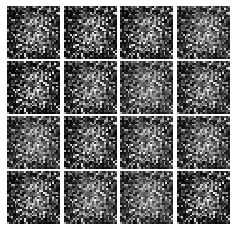

Epoch: 0, Iter: 440, D: 0.2686, G:1.554


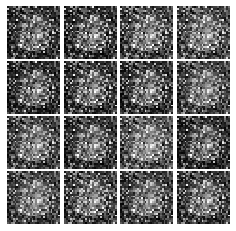

Epoch: 0, Iter: 460, D: 0.9316, G:0.9495


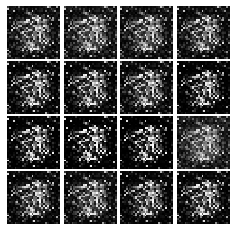

Epoch: 1, Iter: 480, D: 0.1055, G:0.3761


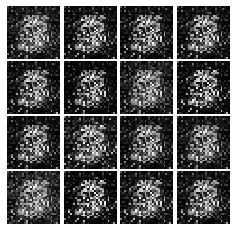

Epoch: 1, Iter: 500, D: 0.1323, G:0.5281


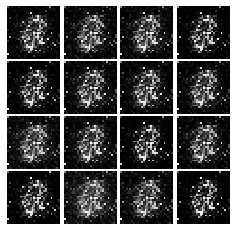

Epoch: 1, Iter: 520, D: 0.373, G:0.2985


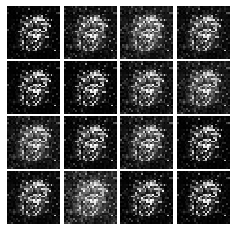

Epoch: 1, Iter: 540, D: 0.1512, G:0.4393


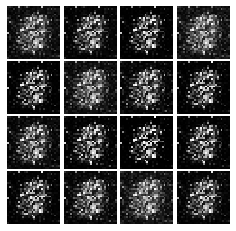

Epoch: 1, Iter: 560, D: 0.1266, G:0.2536


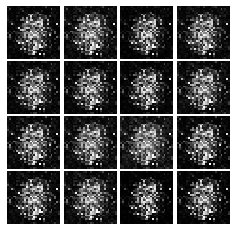

Epoch: 1, Iter: 580, D: 0.1028, G:0.3135


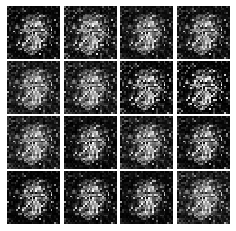

Epoch: 1, Iter: 600, D: 0.126, G:0.4244


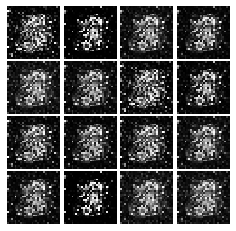

Epoch: 1, Iter: 620, D: 0.1438, G:0.3911


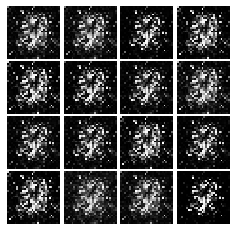

Epoch: 1, Iter: 640, D: 0.6949, G:0.564


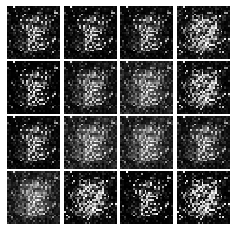

Epoch: 1, Iter: 660, D: 0.3008, G:0.3165


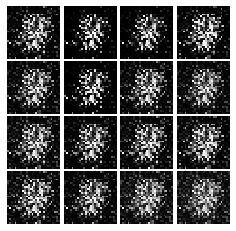

Epoch: 1, Iter: 680, D: 0.1389, G:0.416


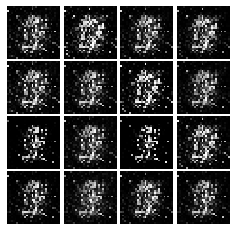

Epoch: 1, Iter: 700, D: 0.1454, G:0.3258


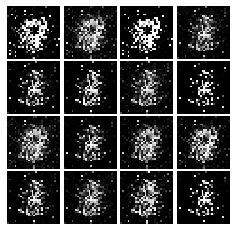

Epoch: 1, Iter: 720, D: 0.3132, G:1.179


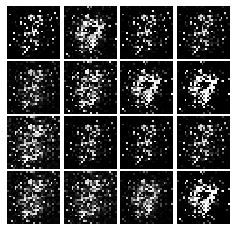

Epoch: 1, Iter: 740, D: 0.1241, G:0.3134


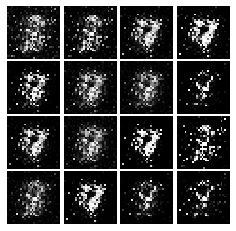

Epoch: 1, Iter: 760, D: 0.09883, G:0.3117


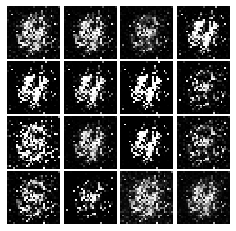

Epoch: 1, Iter: 780, D: 0.2264, G:0.6092


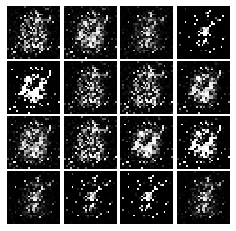

Epoch: 1, Iter: 800, D: 0.1048, G:0.3842


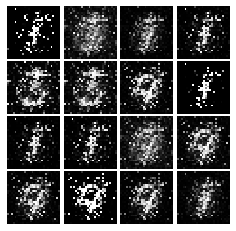

Epoch: 1, Iter: 820, D: 0.1393, G:0.4286


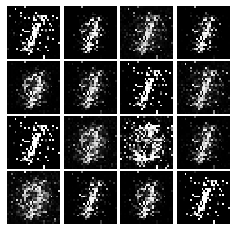

Epoch: 1, Iter: 840, D: 0.1476, G:0.2967


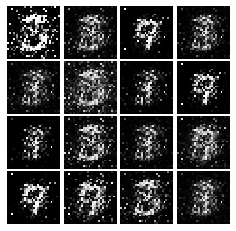

Epoch: 1, Iter: 860, D: 0.1644, G:0.2492


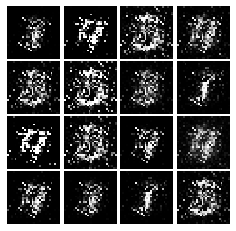

Epoch: 1, Iter: 880, D: 0.1387, G:0.475


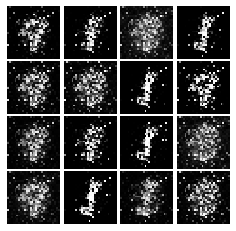

Epoch: 1, Iter: 900, D: 0.1356, G:0.3214


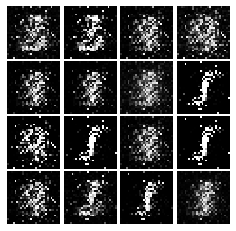

Epoch: 1, Iter: 920, D: 0.1674, G:0.2649


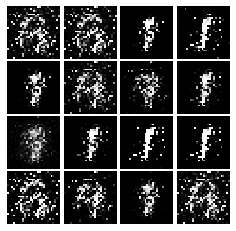

Epoch: 2, Iter: 940, D: 0.1642, G:0.3768


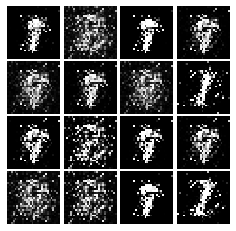

Epoch: 2, Iter: 960, D: 0.1577, G:0.4351


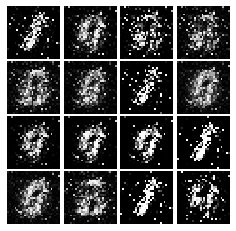

Epoch: 2, Iter: 980, D: 0.1571, G:0.3346


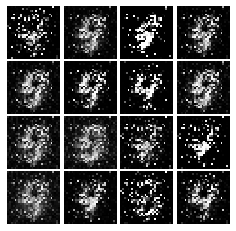

Epoch: 2, Iter: 1000, D: 0.1181, G:0.5083


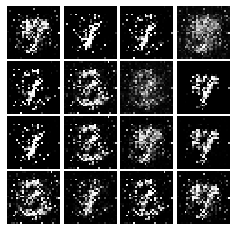

Epoch: 2, Iter: 1020, D: 0.1846, G:0.4105


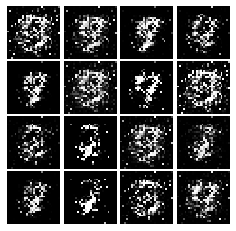

Epoch: 2, Iter: 1040, D: 0.1411, G:0.2576


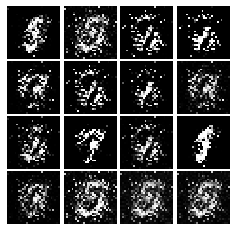

Epoch: 2, Iter: 1060, D: 0.1128, G:0.3399


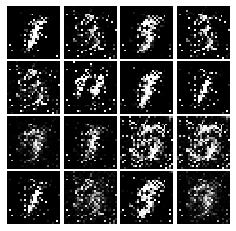

Epoch: 2, Iter: 1080, D: 0.1828, G:0.3097


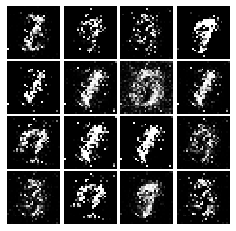

Epoch: 2, Iter: 1100, D: 0.1893, G:0.2483


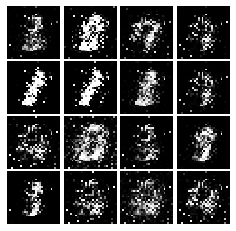

Epoch: 2, Iter: 1120, D: 0.1612, G:0.5068


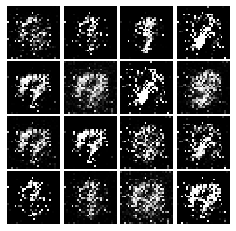

Epoch: 2, Iter: 1140, D: 0.1519, G:0.3347


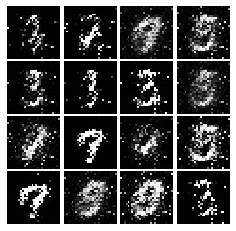

Epoch: 2, Iter: 1160, D: 0.1597, G:0.3371


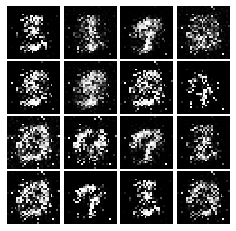

Epoch: 2, Iter: 1180, D: 0.1326, G:0.4255


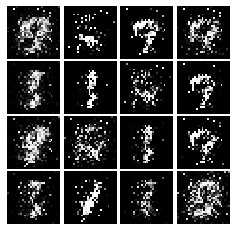

Epoch: 2, Iter: 1200, D: 0.1663, G:0.3396


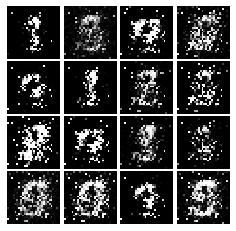

Epoch: 2, Iter: 1220, D: 0.1792, G:0.3045


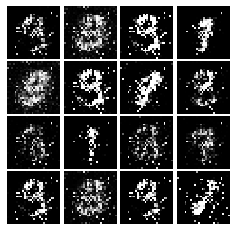

Epoch: 2, Iter: 1240, D: 0.1593, G:0.2714


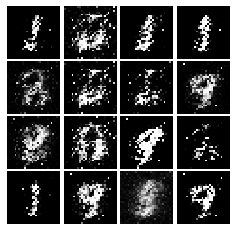

Epoch: 2, Iter: 1260, D: 0.2255, G:0.2187


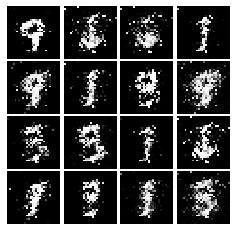

Epoch: 2, Iter: 1280, D: 0.1387, G:0.2742


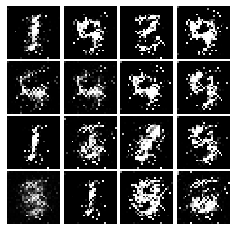

Epoch: 2, Iter: 1300, D: 0.1558, G:0.3133


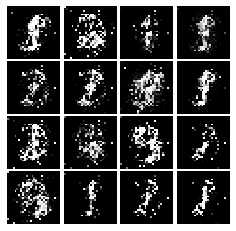

Epoch: 2, Iter: 1320, D: 0.1831, G:0.1845


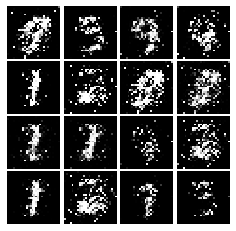

Epoch: 2, Iter: 1340, D: 0.1889, G:0.5377


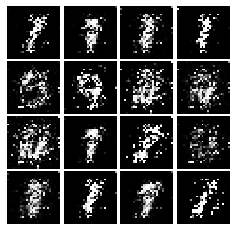

Epoch: 2, Iter: 1360, D: 0.1694, G:0.2475


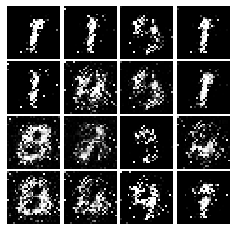

Epoch: 2, Iter: 1380, D: 0.1578, G:0.3345


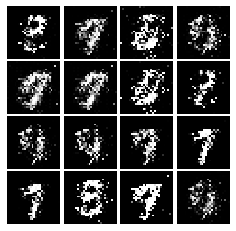

Epoch: 2, Iter: 1400, D: 0.1804, G:0.1705


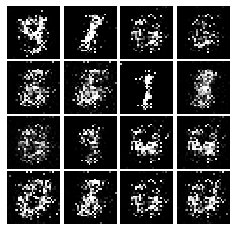

Epoch: 3, Iter: 1420, D: 0.1912, G:0.2819


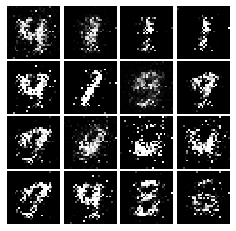

Epoch: 3, Iter: 1440, D: 0.1803, G:0.3338


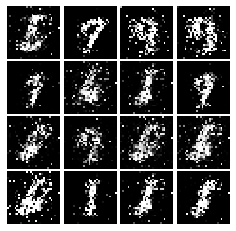

Epoch: 3, Iter: 1460, D: 0.1724, G:0.3356


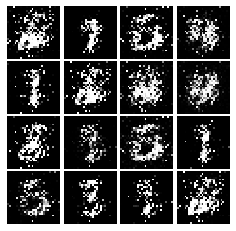

Epoch: 3, Iter: 1480, D: 0.2, G:0.2844


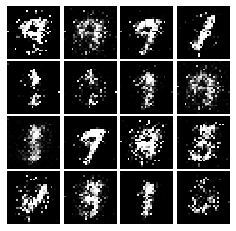

Epoch: 3, Iter: 1500, D: 0.1956, G:0.3352


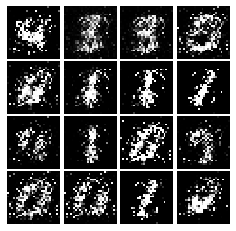

Epoch: 3, Iter: 1520, D: 0.1822, G:0.2483


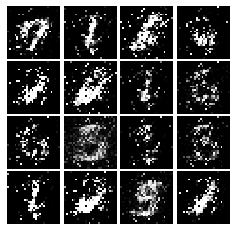

Epoch: 3, Iter: 1540, D: 0.2101, G:0.2565


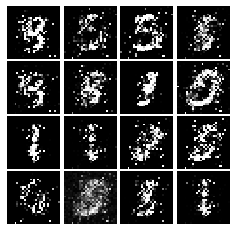

Epoch: 3, Iter: 1560, D: 0.1742, G:0.2676


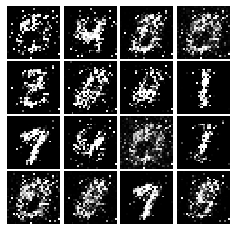

Epoch: 3, Iter: 1580, D: 0.2052, G:0.2248


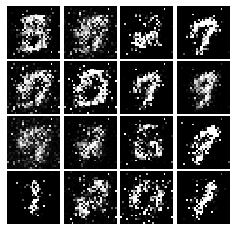

Epoch: 3, Iter: 1600, D: 0.2183, G:0.2484


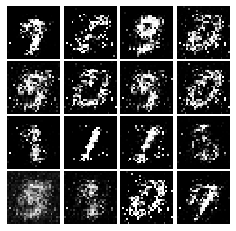

Epoch: 3, Iter: 1620, D: 0.2126, G:0.226


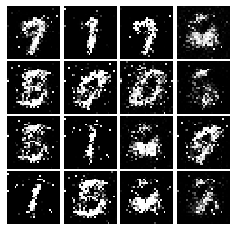

Epoch: 3, Iter: 1640, D: 0.1709, G:0.3324


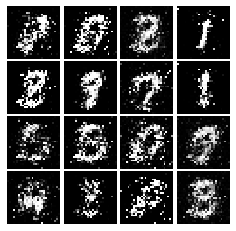

Epoch: 3, Iter: 1660, D: 0.1775, G:0.4177


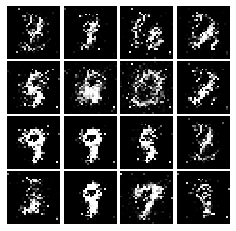

Epoch: 3, Iter: 1680, D: 0.1878, G:0.2093


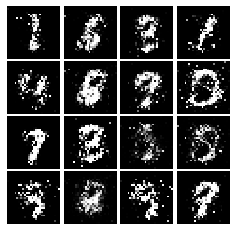

Epoch: 3, Iter: 1700, D: 0.2429, G:0.1764


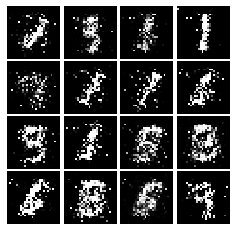

Epoch: 3, Iter: 1720, D: 0.1795, G:0.2419


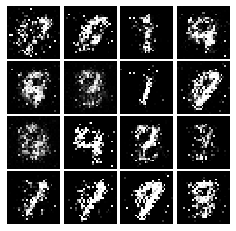

Epoch: 3, Iter: 1740, D: 0.1833, G:0.2555


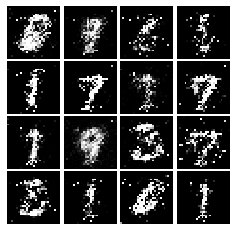

Epoch: 3, Iter: 1760, D: 0.1858, G:0.2152


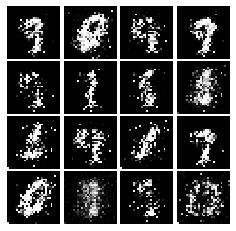

Epoch: 3, Iter: 1780, D: 0.1641, G:0.2442


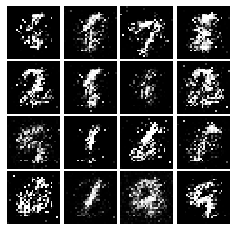

Epoch: 3, Iter: 1800, D: 0.2591, G:0.2201


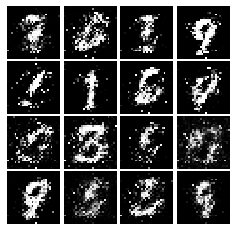

Epoch: 3, Iter: 1820, D: 0.1713, G:0.2383


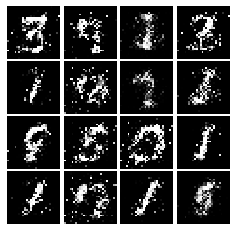

Epoch: 3, Iter: 1840, D: 0.2046, G:0.2293


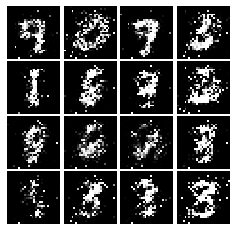

Epoch: 3, Iter: 1860, D: 0.1718, G:0.3054


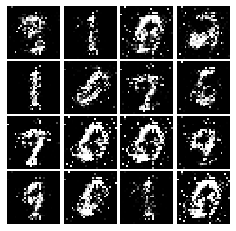

Epoch: 4, Iter: 1880, D: 0.1822, G:0.2649


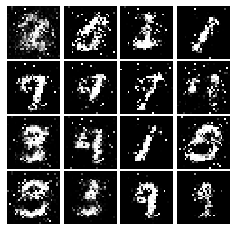

Epoch: 4, Iter: 1900, D: 0.1663, G:0.2186


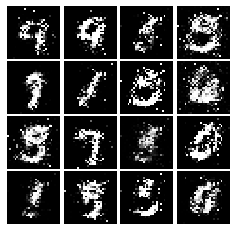

Epoch: 4, Iter: 1920, D: 0.1993, G:0.2057


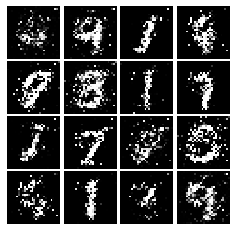

Epoch: 4, Iter: 1940, D: 0.1991, G:0.2318


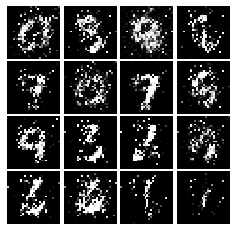

Epoch: 4, Iter: 1960, D: 0.1759, G:0.256


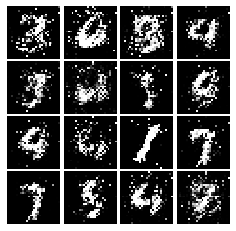

Epoch: 4, Iter: 1980, D: 0.2186, G:0.2127


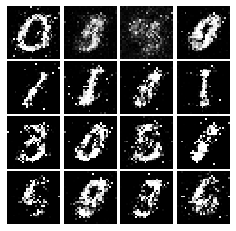

Epoch: 4, Iter: 2000, D: 0.2187, G:0.176


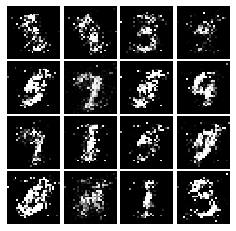

Epoch: 4, Iter: 2020, D: 0.2226, G:0.1885


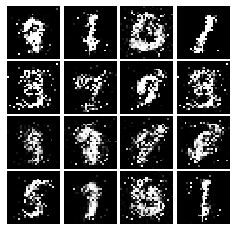

Epoch: 4, Iter: 2040, D: 0.2395, G:0.1886


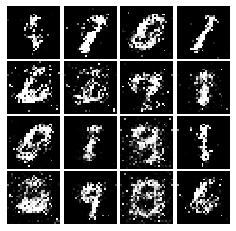

Epoch: 4, Iter: 2060, D: 0.1953, G:0.207


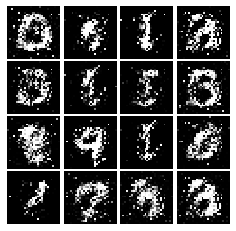

Epoch: 4, Iter: 2080, D: 0.2272, G:0.1924


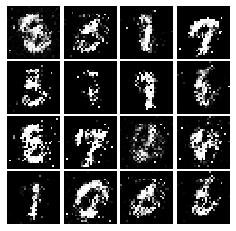

Epoch: 4, Iter: 2100, D: 0.1978, G:0.2207


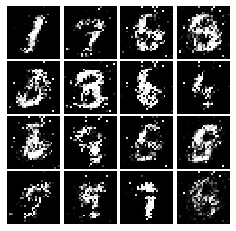

Epoch: 4, Iter: 2120, D: 0.1953, G:0.1456


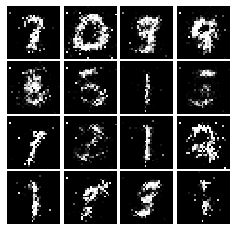

Epoch: 4, Iter: 2140, D: 0.2373, G:0.1749


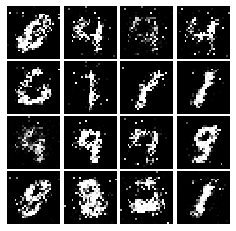

Epoch: 4, Iter: 2160, D: 0.2371, G:0.2132


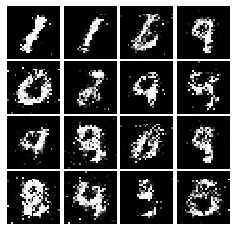

Epoch: 4, Iter: 2180, D: 0.2083, G:0.1843


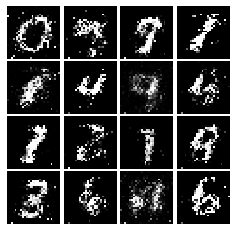

Epoch: 4, Iter: 2200, D: 0.2298, G:0.2161


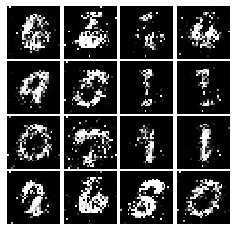

Epoch: 4, Iter: 2220, D: 0.218, G:0.1945


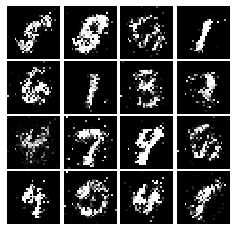

Epoch: 4, Iter: 2240, D: 0.236, G:0.1661


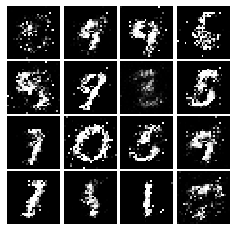

Epoch: 4, Iter: 2260, D: 0.2374, G:0.2179


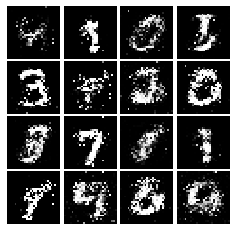

Epoch: 4, Iter: 2280, D: 0.2011, G:0.1992


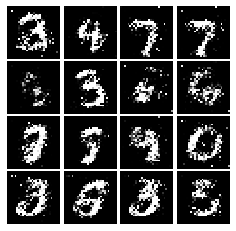

Epoch: 4, Iter: 2300, D: 0.1867, G:0.2279


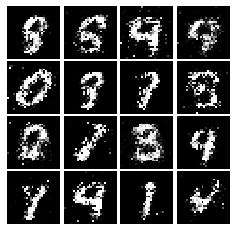

Epoch: 4, Iter: 2320, D: 0.2204, G:0.1825


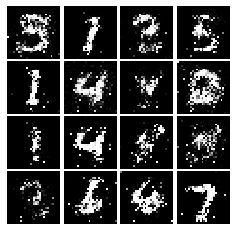

Epoch: 4, Iter: 2340, D: 0.1922, G:0.2513


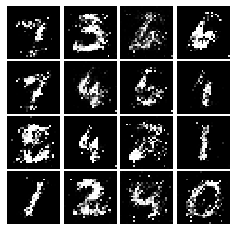

Epoch: 5, Iter: 2360, D: 0.2275, G:0.2025


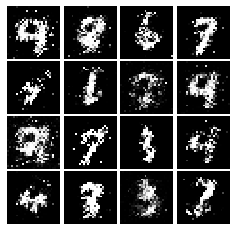

Epoch: 5, Iter: 2380, D: 0.224, G:0.1496


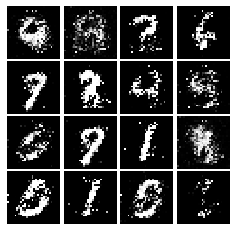

Epoch: 5, Iter: 2400, D: 0.212, G:0.2318


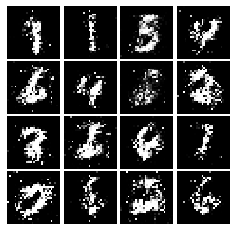

Epoch: 5, Iter: 2420, D: 0.2089, G:0.2072


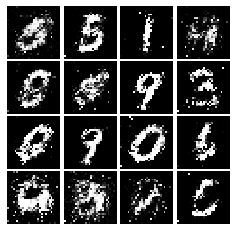

Epoch: 5, Iter: 2440, D: 0.2268, G:0.2229


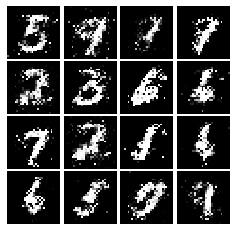

Epoch: 5, Iter: 2460, D: 0.1815, G:0.2221


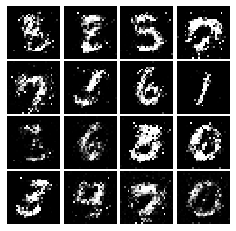

Epoch: 5, Iter: 2480, D: 0.2078, G:0.1924


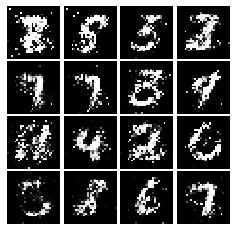

Epoch: 5, Iter: 2500, D: 0.2116, G:0.1762


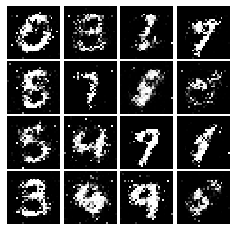

Epoch: 5, Iter: 2520, D: 0.2501, G:0.1581


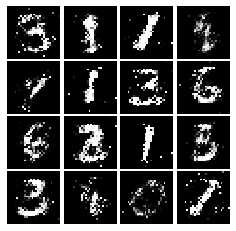

Epoch: 5, Iter: 2540, D: 0.2019, G:0.1743


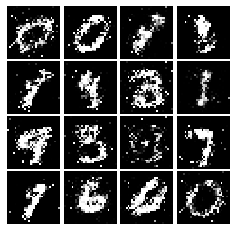

Epoch: 5, Iter: 2560, D: 0.203, G:0.1869


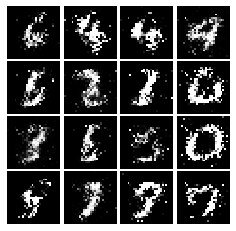

Epoch: 5, Iter: 2580, D: 0.2246, G:0.1602


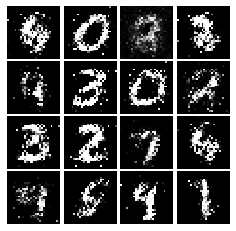

Epoch: 5, Iter: 2600, D: 0.2459, G:0.1722


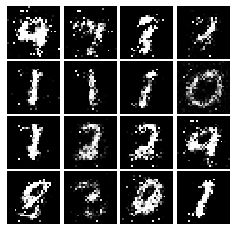

Epoch: 5, Iter: 2620, D: 0.2349, G:0.2145


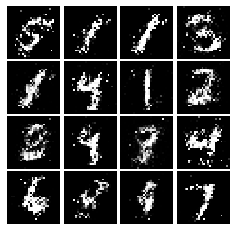

Epoch: 5, Iter: 2640, D: 0.2424, G:0.186


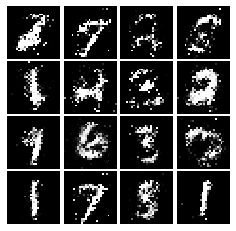

Epoch: 5, Iter: 2660, D: 0.2207, G:0.2666


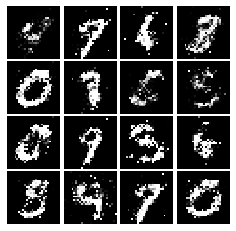

Epoch: 5, Iter: 2680, D: 0.244, G:0.1481


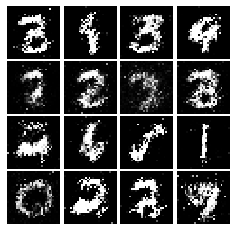

Epoch: 5, Iter: 2700, D: 0.2377, G:0.1759


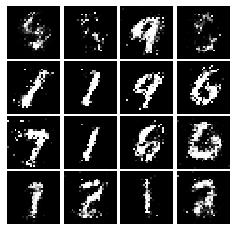

Epoch: 5, Iter: 2720, D: 0.2178, G:0.1727


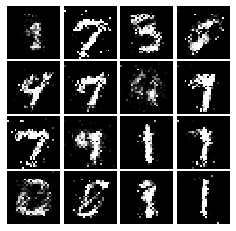

Epoch: 5, Iter: 2740, D: 0.2423, G:0.1938


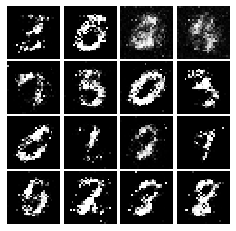

Epoch: 5, Iter: 2760, D: 0.2242, G:0.1706


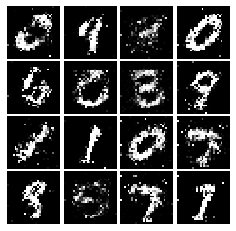

Epoch: 5, Iter: 2780, D: 0.2152, G:0.181


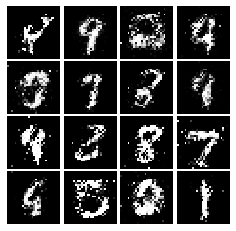

Epoch: 5, Iter: 2800, D: 0.2271, G:0.1878


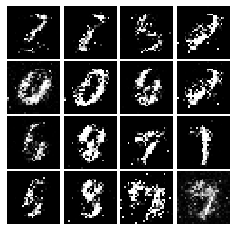

Epoch: 6, Iter: 2820, D: 0.2209, G:0.1935


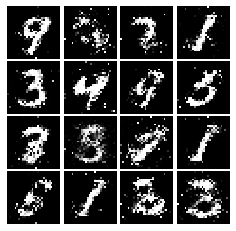

Epoch: 6, Iter: 2840, D: 0.2241, G:0.1774


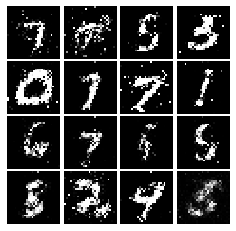

Epoch: 6, Iter: 2860, D: 0.1985, G:0.2082


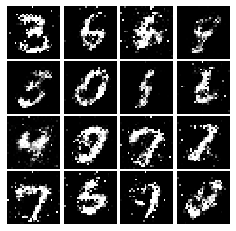

Epoch: 6, Iter: 2880, D: 0.1892, G:0.2055


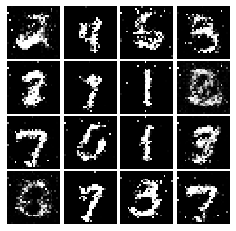

Epoch: 6, Iter: 2900, D: 0.2248, G:0.1797


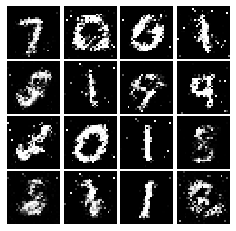

Epoch: 6, Iter: 2920, D: 0.228, G:0.1925


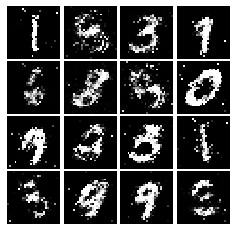

Epoch: 6, Iter: 2940, D: 0.2324, G:0.1788


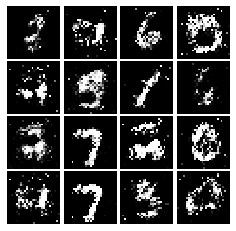

Epoch: 6, Iter: 2960, D: 0.2219, G:0.1786


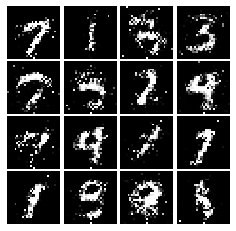

Epoch: 6, Iter: 2980, D: 0.2579, G:0.1725


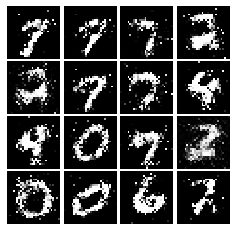

Epoch: 6, Iter: 3000, D: 0.2071, G:0.1775


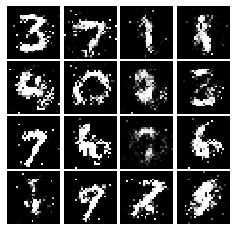

Epoch: 6, Iter: 3020, D: 0.2322, G:0.1645


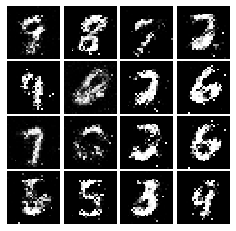

Epoch: 6, Iter: 3040, D: 0.21, G:0.1617


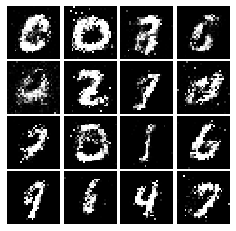

Epoch: 6, Iter: 3060, D: 0.245, G:0.1694


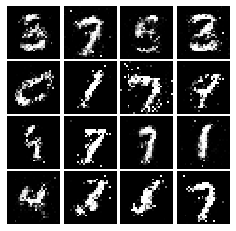

Epoch: 6, Iter: 3080, D: 0.2293, G:0.1821


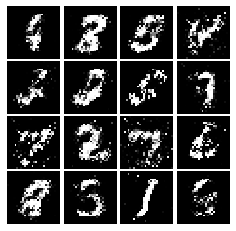

Epoch: 6, Iter: 3100, D: 0.2115, G:0.2112


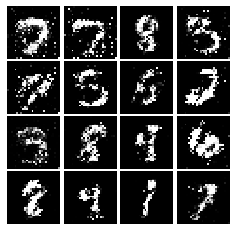

Epoch: 6, Iter: 3120, D: 0.22, G:0.1528


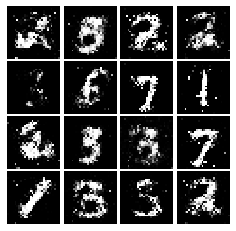

Epoch: 6, Iter: 3140, D: 0.2344, G:0.2112


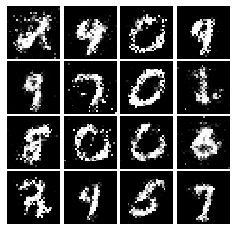

Epoch: 6, Iter: 3160, D: 0.1942, G:0.1819


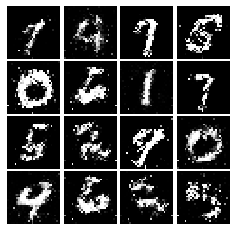

Epoch: 6, Iter: 3180, D: 0.2107, G:0.1806


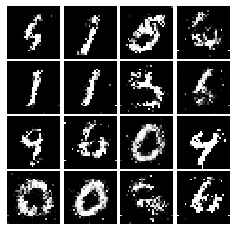

Epoch: 6, Iter: 3200, D: 0.2269, G:0.1849


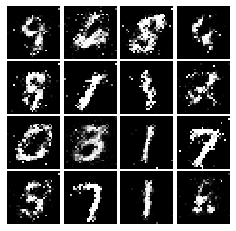

Epoch: 6, Iter: 3220, D: 0.219, G:0.1735


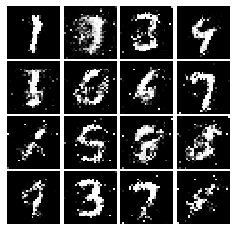

Epoch: 6, Iter: 3240, D: 0.2115, G:0.1823


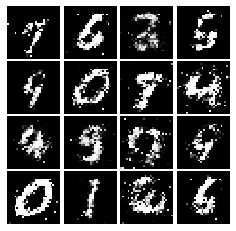

Epoch: 6, Iter: 3260, D: 0.2345, G:0.1976


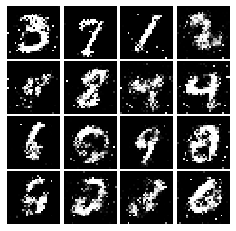

Epoch: 6, Iter: 3280, D: 0.2257, G:0.1957


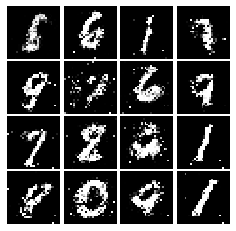

Epoch: 7, Iter: 3300, D: 0.2111, G:0.1832


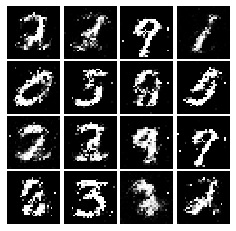

Epoch: 7, Iter: 3320, D: 0.2205, G:0.1747


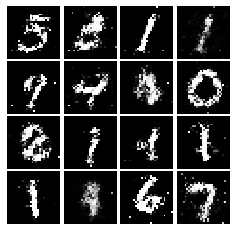

Epoch: 7, Iter: 3340, D: 0.1912, G:0.1753


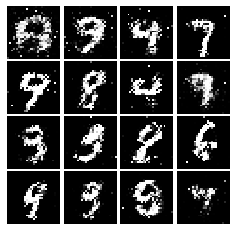

Epoch: 7, Iter: 3360, D: 0.2384, G:0.1871


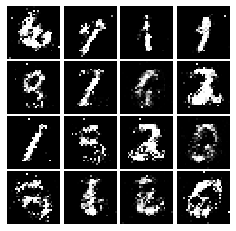

Epoch: 7, Iter: 3380, D: 0.2297, G:0.1503


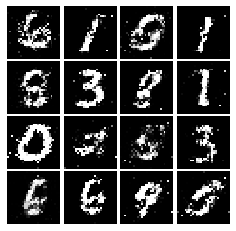

Epoch: 7, Iter: 3400, D: 0.2281, G:0.1656


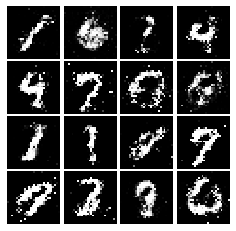

Epoch: 7, Iter: 3420, D: 0.2529, G:0.1584


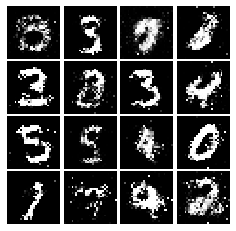

Epoch: 7, Iter: 3440, D: 0.2379, G:0.1827


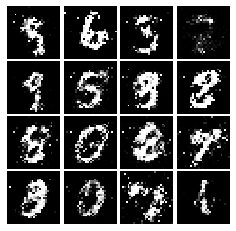

Epoch: 7, Iter: 3460, D: 0.2401, G:0.1568


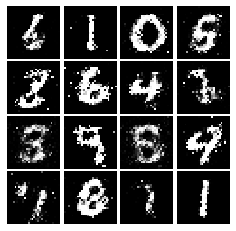

Epoch: 7, Iter: 3480, D: 0.2518, G:0.1688


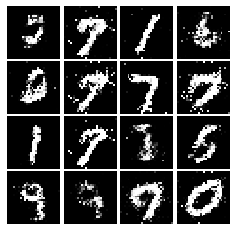

Epoch: 7, Iter: 3500, D: 0.2425, G:0.1869


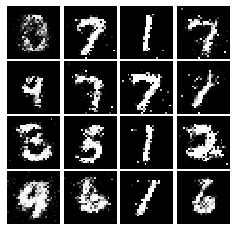

Epoch: 7, Iter: 3520, D: 0.2447, G:0.1518


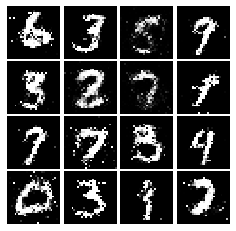

Epoch: 7, Iter: 3540, D: 0.2267, G:0.1797


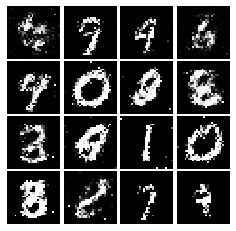

Epoch: 7, Iter: 3560, D: 0.2151, G:0.1807


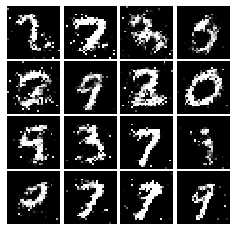

Epoch: 7, Iter: 3580, D: 0.2105, G:0.2087


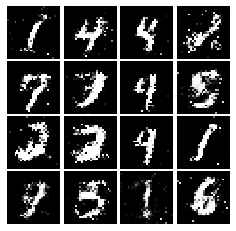

Epoch: 7, Iter: 3600, D: 0.2204, G:0.1781


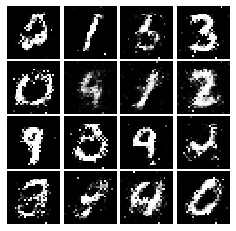

Epoch: 7, Iter: 3620, D: 0.2272, G:0.188


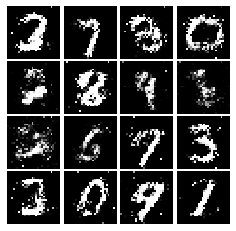

Epoch: 7, Iter: 3640, D: 0.2465, G:0.1719


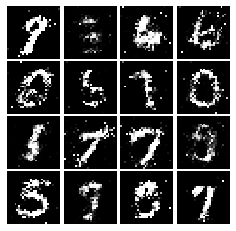

Epoch: 7, Iter: 3660, D: 0.2427, G:0.2456


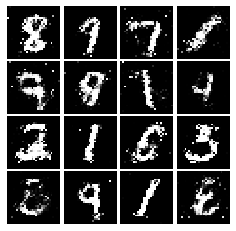

Epoch: 7, Iter: 3680, D: 0.2334, G:0.1717


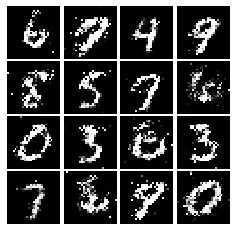

Epoch: 7, Iter: 3700, D: 0.2345, G:0.1511


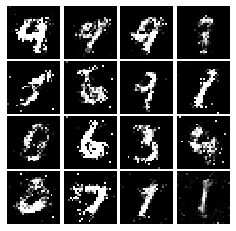

Epoch: 7, Iter: 3720, D: 0.2286, G:0.1695


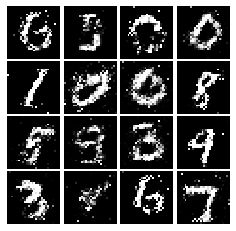

Epoch: 7, Iter: 3740, D: 0.2644, G:0.1484


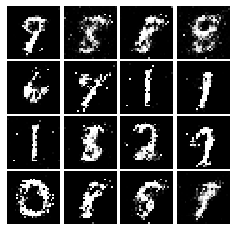

Epoch: 8, Iter: 3760, D: 0.2217, G:0.1686


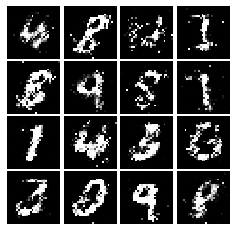

Epoch: 8, Iter: 3780, D: 0.2476, G:0.1863


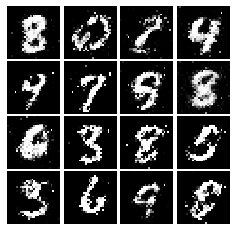

Epoch: 8, Iter: 3800, D: 0.2288, G:0.19


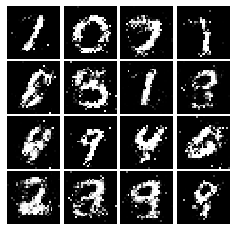

Epoch: 8, Iter: 3820, D: 0.2314, G:0.1636


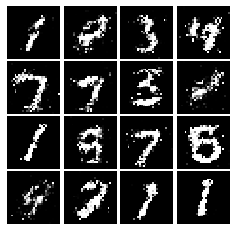

Epoch: 8, Iter: 3840, D: 0.2319, G:0.1569


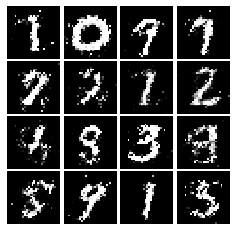

Epoch: 8, Iter: 3860, D: 0.2416, G:0.1616


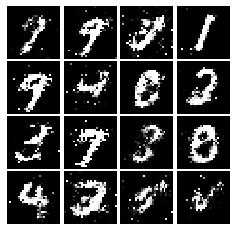

Epoch: 8, Iter: 3880, D: 0.2235, G:0.1577


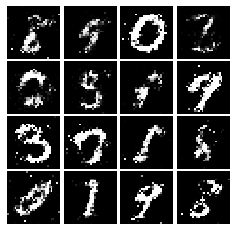

Epoch: 8, Iter: 3900, D: 0.2559, G:0.1677


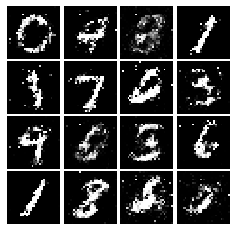

Epoch: 8, Iter: 3920, D: 0.2244, G:0.1691


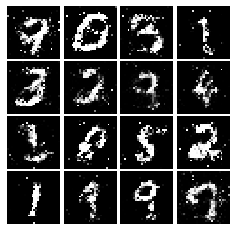

Epoch: 8, Iter: 3940, D: 0.2608, G:0.1544


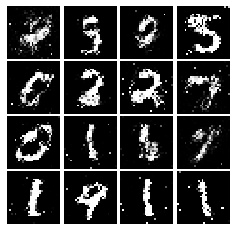

Epoch: 8, Iter: 3960, D: 0.234, G:0.2008


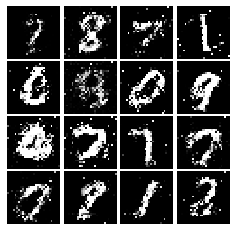

Epoch: 8, Iter: 3980, D: 0.2462, G:0.173


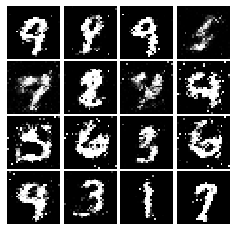

Epoch: 8, Iter: 4000, D: 0.2354, G:0.1566


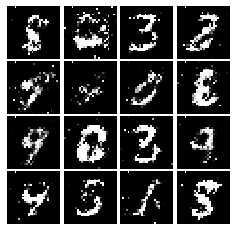

Epoch: 8, Iter: 4020, D: 0.2124, G:0.1397


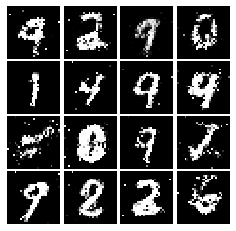

Epoch: 8, Iter: 4040, D: 0.2382, G:0.1764


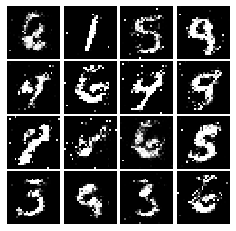

Epoch: 8, Iter: 4060, D: 0.2311, G:0.1613


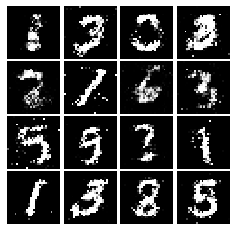

Epoch: 8, Iter: 4080, D: 0.2473, G:0.1885


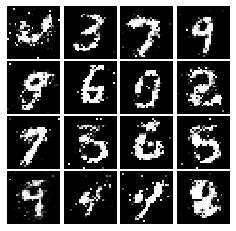

Epoch: 8, Iter: 4100, D: 0.2188, G:0.1846


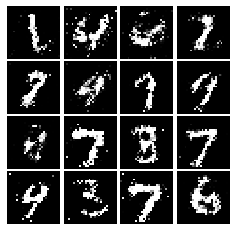

Epoch: 8, Iter: 4120, D: 0.225, G:0.1492


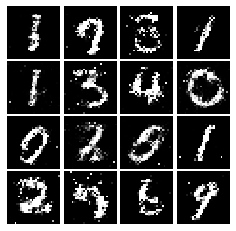

Epoch: 8, Iter: 4140, D: 0.2417, G:0.1974


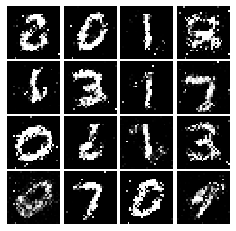

Epoch: 8, Iter: 4160, D: 0.2171, G:0.1582


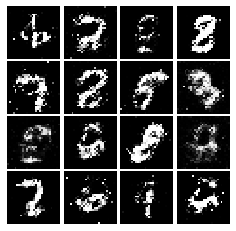

Epoch: 8, Iter: 4180, D: 0.2334, G:0.1626


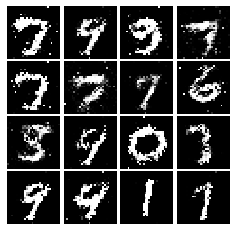

Epoch: 8, Iter: 4200, D: 0.2243, G:0.1751


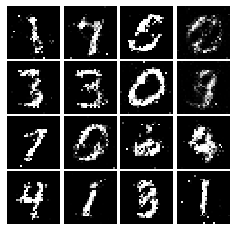

Epoch: 8, Iter: 4220, D: 0.2443, G:0.148


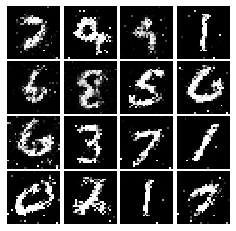

Epoch: 9, Iter: 4240, D: 0.2138, G:0.1761


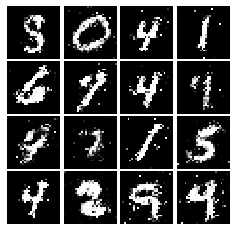

Epoch: 9, Iter: 4260, D: 0.2608, G:0.1531


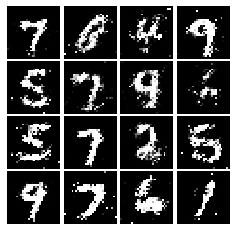

Epoch: 9, Iter: 4280, D: 0.2353, G:0.164


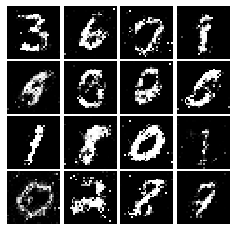

Epoch: 9, Iter: 4300, D: 0.2414, G:0.1579


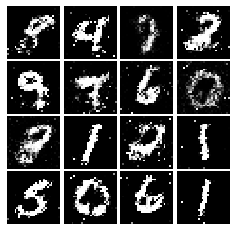

Epoch: 9, Iter: 4320, D: 0.242, G:0.1697


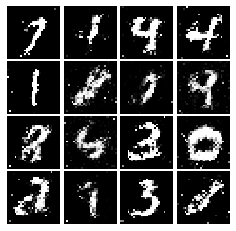

Epoch: 9, Iter: 4340, D: 0.2358, G:0.1669


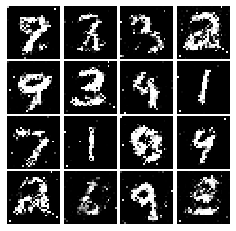

Epoch: 9, Iter: 4360, D: 0.25, G:0.1591


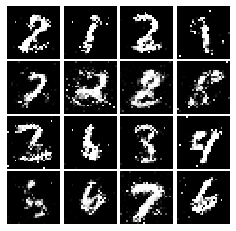

Epoch: 9, Iter: 4380, D: 0.2443, G:0.1467


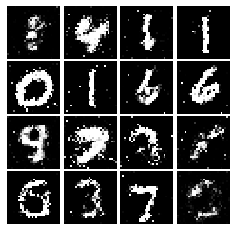

Epoch: 9, Iter: 4400, D: 0.2383, G:0.1609


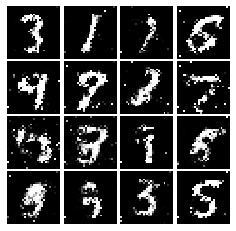

Epoch: 9, Iter: 4420, D: 0.245, G:0.1583


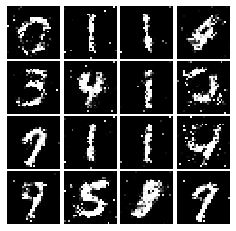

Epoch: 9, Iter: 4440, D: 0.2403, G:0.1595


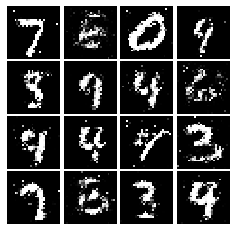

Epoch: 9, Iter: 4460, D: 0.2235, G:0.1718


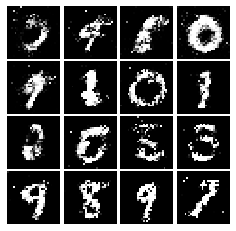

Epoch: 9, Iter: 4480, D: 0.2264, G:0.1631


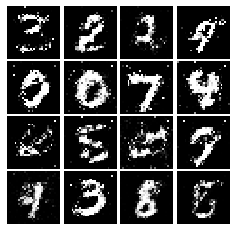

Epoch: 9, Iter: 4500, D: 0.2672, G:0.1516


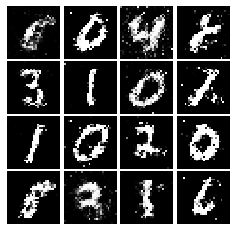

Epoch: 9, Iter: 4520, D: 0.2292, G:0.1832


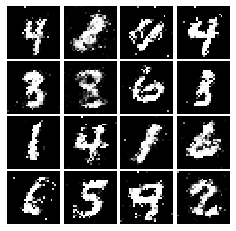

Epoch: 9, Iter: 4540, D: 0.2296, G:0.1523


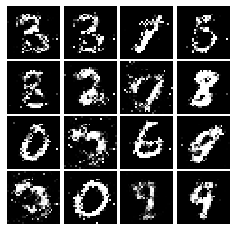

Epoch: 9, Iter: 4560, D: 0.2277, G:0.162


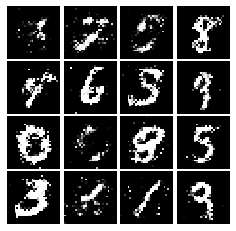

Epoch: 9, Iter: 4580, D: 0.233, G:0.1719


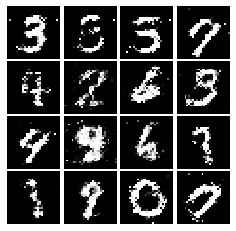

Epoch: 9, Iter: 4600, D: 0.2229, G:0.1757


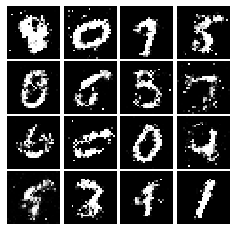

Epoch: 9, Iter: 4620, D: 0.2524, G:0.1596


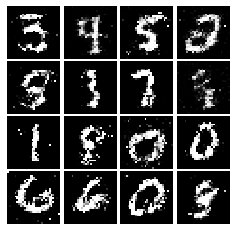

Epoch: 9, Iter: 4640, D: 0.2143, G:0.184


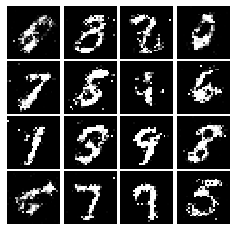

Epoch: 9, Iter: 4660, D: 0.2366, G:0.1447


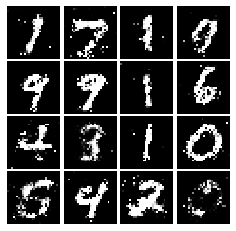

Epoch: 9, Iter: 4680, D: 0.2141, G:0.2426


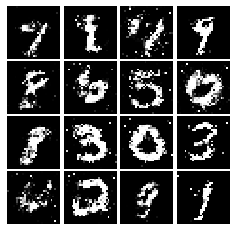

Final images


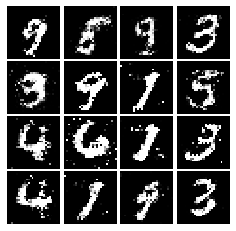

In [11]:
D = discriminator()
G = generator()

# Use the function you wrote earlier to get optimizers for the Discriminator and the Generator
D_solver = tf.keras.optimizers.Adam(learning_rate=1e-3, beta_1=0.5, beta_2=0.999)
G_solver = tf.keras.optimizers.Adam(learning_rate=1e-3, beta_1=0.5, beta_2=0.999)
    
# Run it!
#print(G.summary())
train(D, G, D_solver, G_solver, ls_discriminator_loss, ls_generator_loss)

# Section 2. Deeply Convolutional GANs [45 pts]

In this section, you will need to:
1. Implement DCGAN architecture
2. Train it on MNIST dataset for GAN/LSGAN loss function.

# Deeply Convolutional GANs
In the first part of the notebook, we implemented an almost direct copy of the original GAN network from Ian Goodfellow. However, this network architecture allows no real spatial reasoning. It is unable to reason about things like "sharp edges" in general because it lacks any convolutional layers. Thus, in this section, we will implement some of the ideas from [DCGAN](https://arxiv.org/abs/1511.06434), where we use convolutional networks 

### Section 2.1. DCGAN model architecture [20 pts]
Implement your generator and discriminator model as follows:

#### Discriminator
We will use a discriminator inspired by the TensorFlow MNIST classification [tutorial](https://www.tensorflow.org/get_started/mnist/pros), which is able to get above 99% accuracy on the MNIST dataset fairly quickly. *Be sure to check the dimensions of x and reshape when needed*, fully connected blocks expect [N,D] Tensors while conv2d blocks expect [N,H,W,C] Tensors. Please use `tf.keras.layers` to define the following architecture:

Architecture:
* Conv2D: 32 Filters, 5x5, Stride 1, padding 0
* Leaky ReLU(alpha=0.01)
* Max Pool 2x2, Stride 2
* Conv2D: 64 Filters, 5x5, Stride 1, padding 0
* Leaky ReLU(alpha=0.01)
* Max Pool 2x2, Stride 2
* Flatten
* Fully Connected with output size 4 x 4 x 64
* Leaky ReLU(alpha=0.01)
* Fully Connected with output size 1

Once again, please use biases for all convolutional and fully connected layers, and use the default parameter initializers. Note that a padding of 0 can be accomplished with the 'VALID' padding option.

In [0]:
import keras.models
from keras.models import Sequential 
from tensorflow.keras.layers import Dense,LeakyReLU, Activation,Conv2D,Conv2DTranspose,MaxPooling2D,BatchNormalization,Flatten,Reshape,InputLayer
def DC_Discriminator():
    """Compute discriminator score for a batch of input images.
    
    Inputs:
    - x: TensorFlow Tensor of flattened input images, shape [batch_size, 784]
    
    Returns:
    TensorFlow Tensor with shape [batch_size, 1], containing the score 
    for an image being real for each input image.
    """
    model = tf.keras.models.Sequential([
        # TODO: implement architecture
        # *****START OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
        InputLayer(784),
        Reshape((28,28,1)),
        Conv2D(32,(5,5),strides =1,padding="VALID"),
        LeakyReLU(alpha=0.01),
        MaxPooling2D((2, 2),strides =2),
        Conv2D(64,(5,5),strides =1,padding="VALID"),
        LeakyReLU(alpha=0.01),
        MaxPooling2D((2, 2),strides =2),
        Flatten(),
        Dense(4*4*64),
        LeakyReLU(alpha=0.01),
        Dense(1),
        # *****END OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
    ])
    return model

#### Generator
For the generator, we will copy the architecture exactly from the [InfoGAN paper](https://arxiv.org/pdf/1606.03657.pdf). See Appendix C.1 MNIST. Please use `tf.keras.layers` for your implementation. You might find the documentation for [tf.keras.layers.Conv2DTranspose](https://www.tensorflow.org/versions/r2.0/api_docs/python/tf/keras/layers/Conv2DTranspose) useful. The architecture is as follows.

Architecture:
* Fully connected with output size 1024 
* `ReLU`
* BatchNorm
* Fully connected with output size 7 x 7 x 128 
* `ReLU`
* BatchNorm
* Resize into Image Tensor of size 7, 7, 128
* Conv2D^T (transpose): 64 filters of 4x4, stride 2
* `ReLU`
* BatchNorm
* Conv2d^T (transpose): 1 filter of 4x4, stride 2
* `TanH`

Once again, use biases for the fully connected and transpose convolutional layers. Please use the default initializers for your parameters. For padding, choose the 'same' option for transpose convolutions. For Batch Normalization, assume we are always in 'training' mode.

In [0]:
def DC_Generator(noise_dim=NOISE_DIM):
    """Generate images from a random noise vector.
    
    Inputs:
    - z: TensorFlow Tensor of random noise with shape [batch_size, noise_dim]
    
    Returns:
    TensorFlow Tensor of generated images, with shape [batch_size, 784].
    """
    model = tf.keras.models.Sequential([
    # TODO: implement architecture
    # *****START OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
     InputLayer(noise_dim),
     Dense(1024),
     Activation('relu'),
     BatchNormalization(),
     Dense(7*7*128),
     Activation('relu'),
     BatchNormalization(),
     Reshape([7,7,128]),
     Conv2DTranspose(64,(4,4),strides = 2,padding="SAME"),
     Activation('relu'),
    BatchNormalization(),
     Conv2DTranspose(1,(4,4),strides =2,padding="SAME"),
     Activation('tanh'),
    # *****END OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
    ])   
    return model

### Section 2.2 Train a DCGAN Model with GAN / LSGAN loss function [15 pts]
Now, train your new model with GAN loss function. Observe the visualized result of your model, and describe what you see.

In [0]:
# a giant helper function
def train(D, G, D_solver, G_solver, discriminator_loss, generator_loss,\
              show_every=20, print_every=20, batch_size=128, num_epochs=10, noise_size=100):
    """
    Train loop for GAN.

    The loop will consist of two steps: a discriminator step and a generator step.

    (1) In the discriminator step, first step is to sample noise to generate a fake data batch using the generator. 
    Calculate the discriminator output for real and fake data, and use the output to compute discriminator loss. 
    In code 'd_total_error' is the total discriminator loss.
    
    (2) For the generator step, first step is to sample noise to generate a fake data batch. 
    Get the discriminator output for the fake data batch and use this to compute the generator loss. 
    In code 'g_error' is the generator loss. 
    
    Use the sample_noise function to sample random noise, and the discriminator_loss
    and generator_loss functions for their respective loss computations

    Inputs:
    - D: Discriminator model
    - G: Generator model
    - D_solver: an Optimizer for Discriminator
    - G_solver: an Optimizer for Generator
    - generator_loss: Generator loss
    - discriminator_loss: Discriminator loss
    Returns:
        Nothing
    """
    mnist = MNIST(batch_size=batch_size, shuffle=True)
    
    iter_count = 0
    for epoch in range(num_epochs):
        for (x, _) in mnist:
            with tf.GradientTape() as tape:
                real_data = x
                ##########################################
                # your code   # Discriminator step       # 
                logits_real = D(preprocess_img(real_data))
                noise = sample_noise(batch_size,noise_size)
                fake_images = G(noise) 
                logits_fake = D(tf.reshape(fake_images, [batch_size, 784]))
                d_total_error = discriminator_loss(logits_real,logits_fake)
                ##########################################
                d_gradients = tape.gradient(d_total_error, D.trainable_variables)      
                D_solver.apply_gradients(zip(d_gradients, D.trainable_variables))
            
            with tf.GradientTape() as tape:
                ##########################################
                # your code # Generator step             # 
                noise = sample_noise(batch_size,noise_size)
                fake_images = G(noise)
                gen_logits_fake = D(tf.reshape(fake_images, [batch_size, 784]))
                g_error = generator_loss(gen_logits_fake)
                ##########################################
                g_gradients = tape.gradient(g_error, G.trainable_variables)      
                G_solver.apply_gradients(zip(g_gradients, G.trainable_variables))

            if (iter_count % show_every == 0):
                print('Epoch: {}, Iter: {}, D: {:.4}, G:{:.4}'.format(epoch, iter_count,d_total_error,g_error))
                imgs_numpy = fake_images.cpu().numpy()
                show_images(imgs_numpy[0:16])
                plt.show()
            iter_count += 1
    
    # random noise fed into our generator
    z = sample_noise(batch_size, noise_size)
    # generated images
    G_sample = G(z)
    print('Final images')
    show_images(G_sample[:16])
    plt.show()

Epoch: 0, Iter: 0, D: 1.365, G:0.663


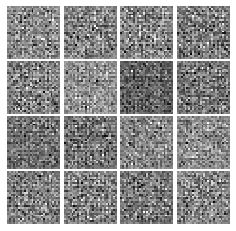

Epoch: 0, Iter: 20, D: 1.22, G:2.26


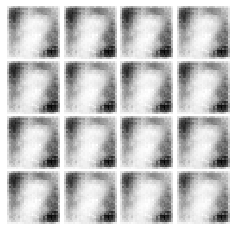

Epoch: 0, Iter: 40, D: 0.2963, G:3.153


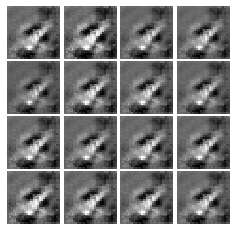

Epoch: 0, Iter: 60, D: 0.5796, G:2.222


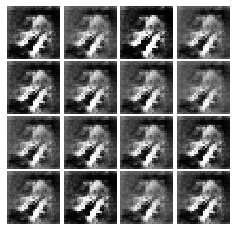

Epoch: 0, Iter: 80, D: 0.5559, G:6.578


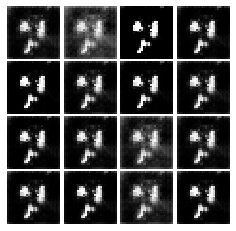

Epoch: 0, Iter: 100, D: 0.2902, G:2.925


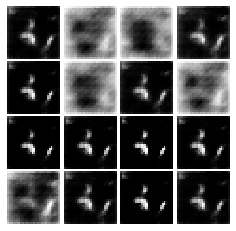

Epoch: 0, Iter: 120, D: 0.6852, G:5.06


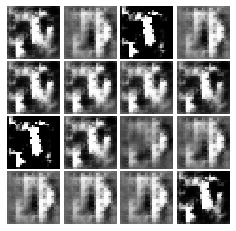

Epoch: 0, Iter: 140, D: 0.324, G:2.265


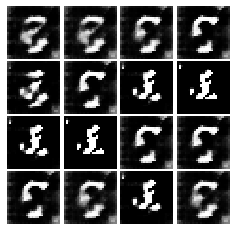

Epoch: 0, Iter: 160, D: 0.5891, G:3.387


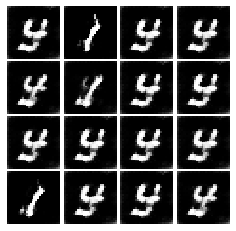

Epoch: 0, Iter: 180, D: 0.5393, G:2.943


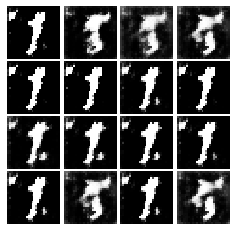

Epoch: 0, Iter: 200, D: 0.3757, G:3.535


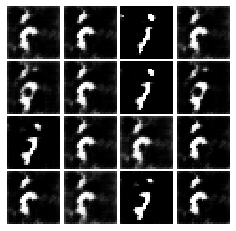

Epoch: 0, Iter: 220, D: 0.3293, G:3.155


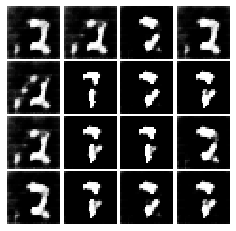

Epoch: 0, Iter: 240, D: 0.2455, G:4.278


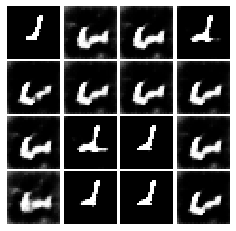

Epoch: 0, Iter: 260, D: 0.4478, G:3.102


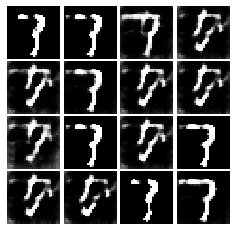

Epoch: 0, Iter: 280, D: 2.359, G:4.435


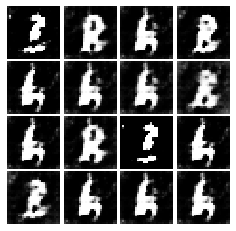

Epoch: 0, Iter: 300, D: 0.3207, G:2.774


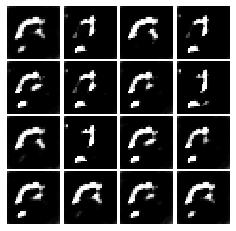

Epoch: 0, Iter: 320, D: 0.1312, G:3.784


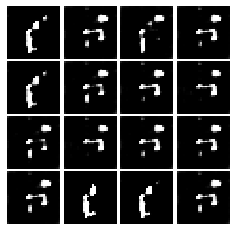

Epoch: 0, Iter: 340, D: 0.2132, G:4.298


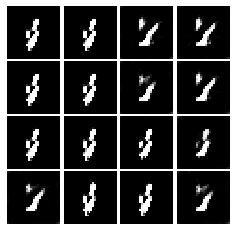

Epoch: 0, Iter: 360, D: 0.316, G:5.367


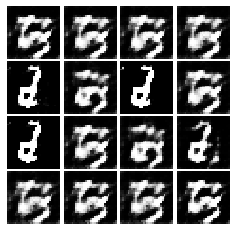

Epoch: 0, Iter: 380, D: 1.019, G:3.719


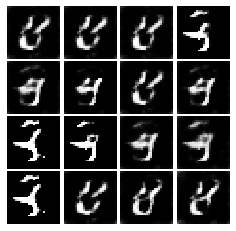

Epoch: 0, Iter: 400, D: 0.833, G:1.933


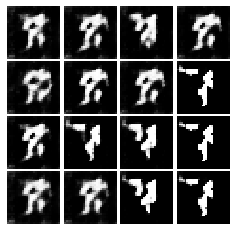

Epoch: 0, Iter: 420, D: 0.5585, G:4.348


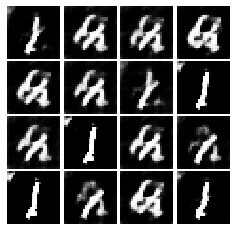

Epoch: 0, Iter: 440, D: 0.8318, G:2.671


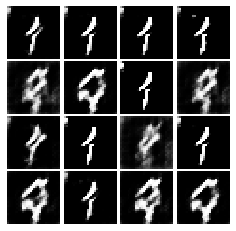

Epoch: 0, Iter: 460, D: 0.1579, G:3.61


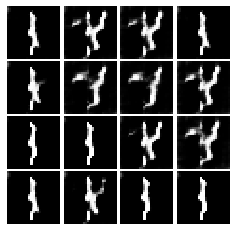

Epoch: 1, Iter: 480, D: 0.3788, G:3.109


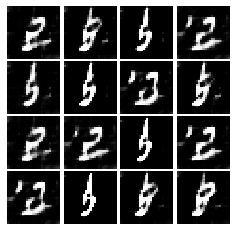

Epoch: 1, Iter: 500, D: 0.3662, G:1.743


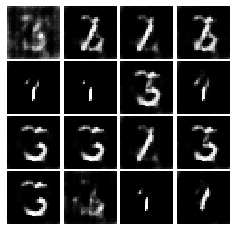

Epoch: 1, Iter: 520, D: 1.098, G:4.822


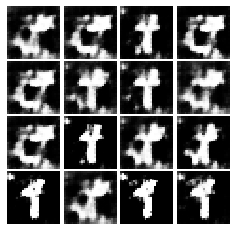

Epoch: 1, Iter: 540, D: 0.5293, G:3.195


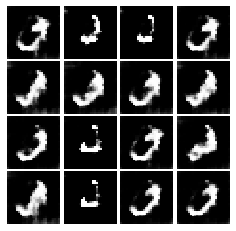

Epoch: 1, Iter: 560, D: 0.4938, G:1.967


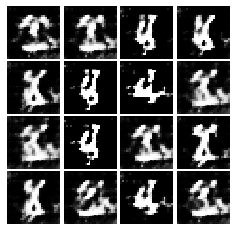

Epoch: 1, Iter: 580, D: 0.4757, G:2.483


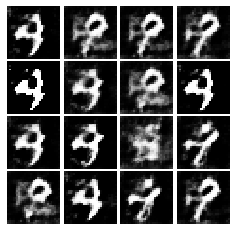

Epoch: 1, Iter: 600, D: 0.5206, G:2.913


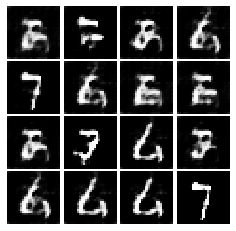

Epoch: 1, Iter: 620, D: 0.165, G:2.994


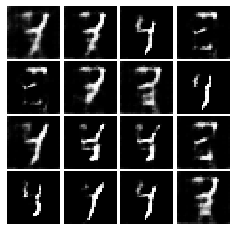

Epoch: 1, Iter: 640, D: 4.397, G:3.412


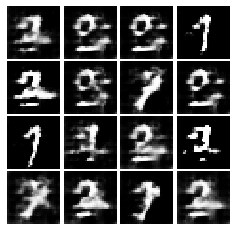

Epoch: 1, Iter: 660, D: 1.944, G:2.641


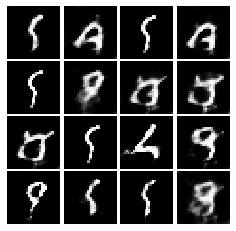

Epoch: 1, Iter: 680, D: 0.5417, G:3.004


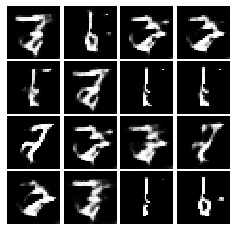

Epoch: 1, Iter: 700, D: 0.4946, G:2.444


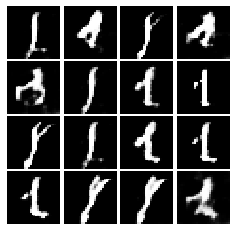

Epoch: 1, Iter: 720, D: 0.7077, G:3.472


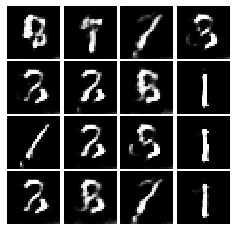

Epoch: 1, Iter: 740, D: 0.6291, G:1.767


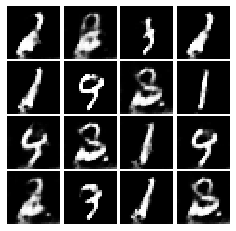

Epoch: 1, Iter: 760, D: 0.6064, G:1.41


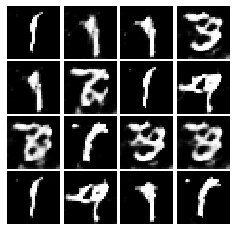

Epoch: 1, Iter: 780, D: 0.3665, G:3.423


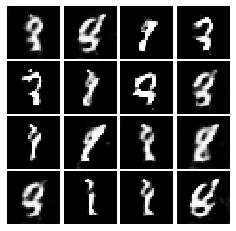

Epoch: 1, Iter: 800, D: 0.468, G:1.953


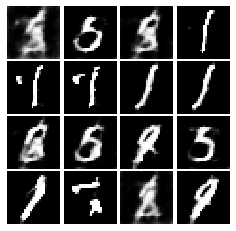

Epoch: 1, Iter: 820, D: 0.4132, G:3.504


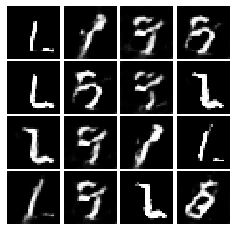

Epoch: 1, Iter: 840, D: 0.45, G:2.676


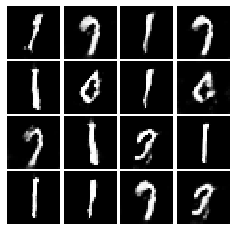

Epoch: 1, Iter: 860, D: 0.6564, G:2.595


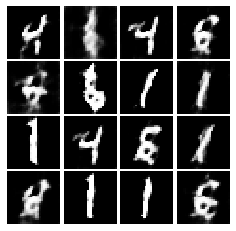

Epoch: 1, Iter: 880, D: 0.5142, G:2.331


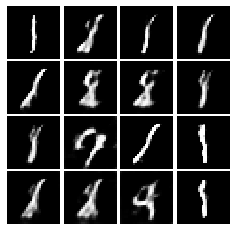

Epoch: 1, Iter: 900, D: 0.5642, G:2.033


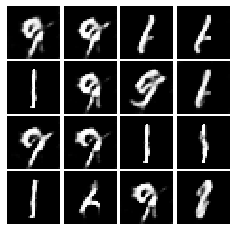

Epoch: 1, Iter: 920, D: 0.4778, G:2.102


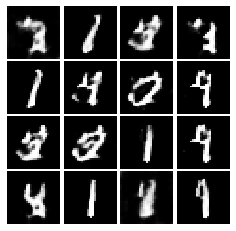

Epoch: 2, Iter: 940, D: 0.4856, G:2.536


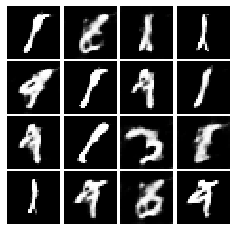

Epoch: 2, Iter: 960, D: 0.4585, G:2.411


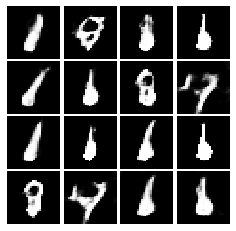

Epoch: 2, Iter: 980, D: 0.576, G:2.619


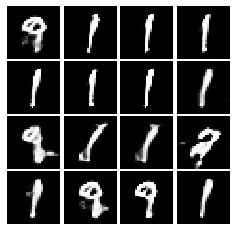

Epoch: 2, Iter: 1000, D: 0.444, G:1.929


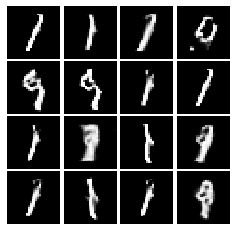

Epoch: 2, Iter: 1020, D: 0.5037, G:2.148


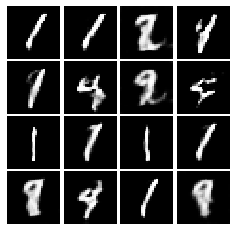

Epoch: 2, Iter: 1040, D: 1.276, G:3.18


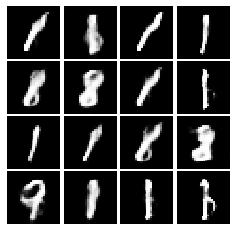

Epoch: 2, Iter: 1060, D: 0.3874, G:3.036


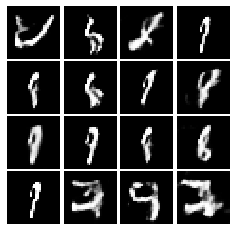

Epoch: 2, Iter: 1080, D: 0.6153, G:1.642


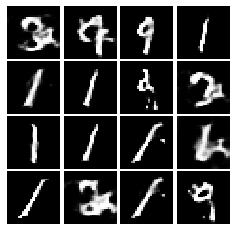

Epoch: 2, Iter: 1100, D: 0.6069, G:1.951


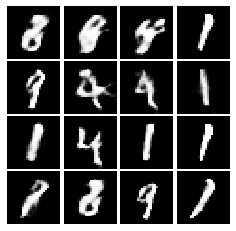

Epoch: 2, Iter: 1120, D: 0.6092, G:2.152


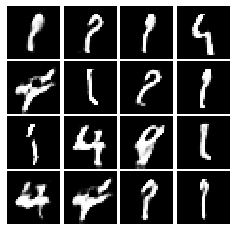

Epoch: 2, Iter: 1140, D: 0.5425, G:1.781


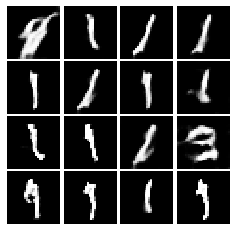

Epoch: 2, Iter: 1160, D: 0.5767, G:1.785


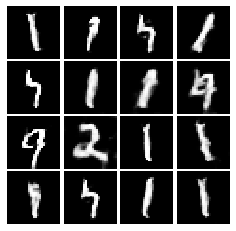

Epoch: 2, Iter: 1180, D: 0.5975, G:2.218


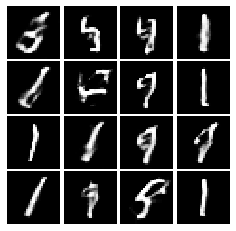

Epoch: 2, Iter: 1200, D: 0.4907, G:2.631


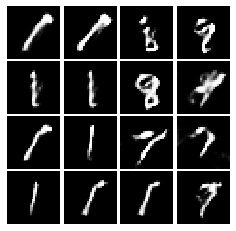

Epoch: 2, Iter: 1220, D: 0.6933, G:1.846


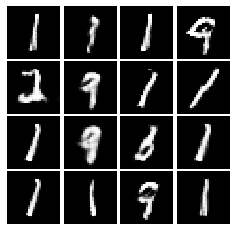

Epoch: 2, Iter: 1240, D: 0.5737, G:2.323


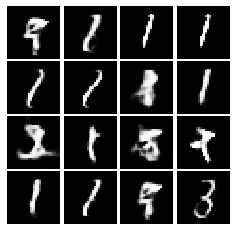

Epoch: 2, Iter: 1260, D: 0.6413, G:2.091


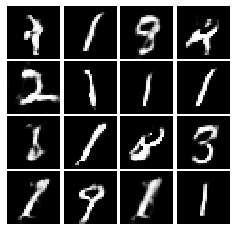

Epoch: 2, Iter: 1280, D: 0.6635, G:2.733


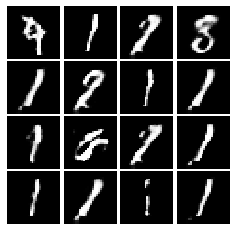

Epoch: 2, Iter: 1300, D: 0.4341, G:2.716


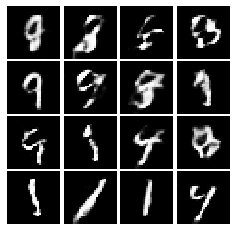

Epoch: 2, Iter: 1320, D: 0.5964, G:1.76


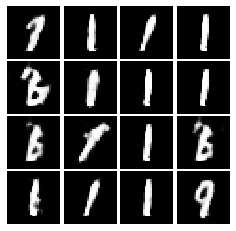

Epoch: 2, Iter: 1340, D: 0.5298, G:2.391


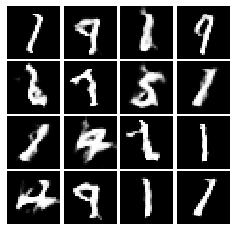

Epoch: 2, Iter: 1360, D: 0.4294, G:2.225


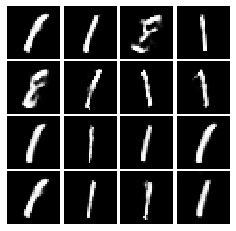

Epoch: 2, Iter: 1380, D: 0.6701, G:1.663


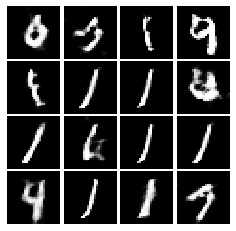

Epoch: 2, Iter: 1400, D: 0.4934, G:2.607


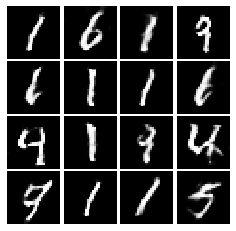

Epoch: 3, Iter: 1420, D: 0.4957, G:2.136


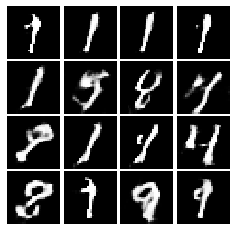

Epoch: 3, Iter: 1440, D: 0.8148, G:2.67


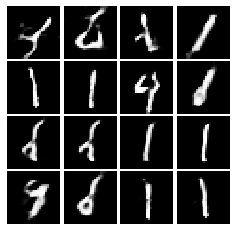

Epoch: 3, Iter: 1460, D: 0.5593, G:1.608


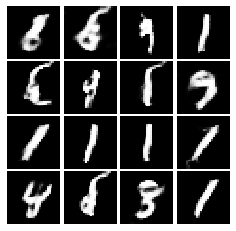

Epoch: 3, Iter: 1480, D: 0.5362, G:1.997


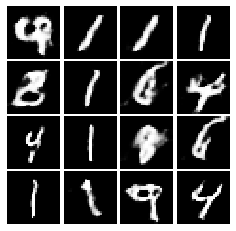

Epoch: 3, Iter: 1500, D: 0.5775, G:1.583


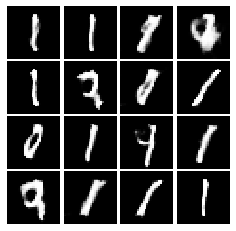

Epoch: 3, Iter: 1520, D: 0.5248, G:2.108


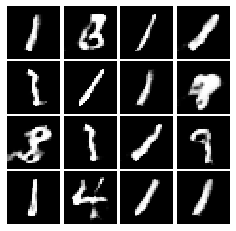

Epoch: 3, Iter: 1540, D: 0.8562, G:3.285


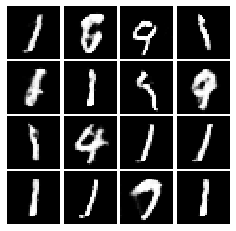

Epoch: 3, Iter: 1560, D: 0.6368, G:2.509


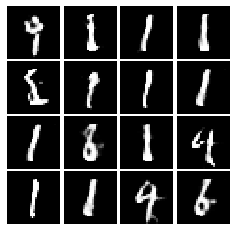

Epoch: 3, Iter: 1580, D: 0.5012, G:2.151


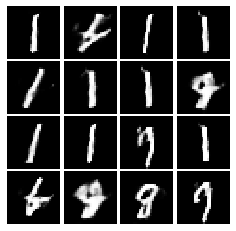

Epoch: 3, Iter: 1600, D: 0.6274, G:2.437


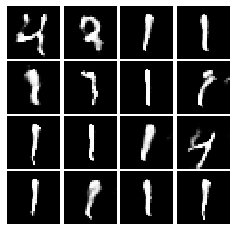

Epoch: 3, Iter: 1620, D: 0.2861, G:2.332


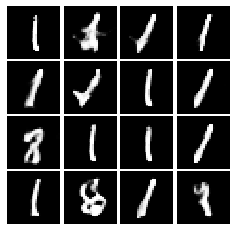

Epoch: 3, Iter: 1640, D: 0.4767, G:1.832


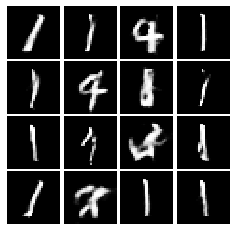

Epoch: 3, Iter: 1660, D: 0.4585, G:2.85


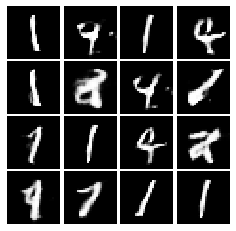

Epoch: 3, Iter: 1680, D: 0.4362, G:2.362


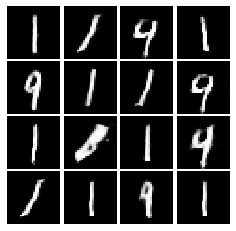

Epoch: 3, Iter: 1700, D: 0.4858, G:2.467


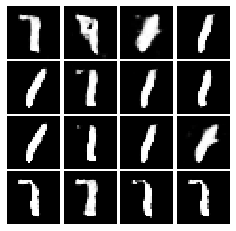

Epoch: 3, Iter: 1720, D: 0.5388, G:1.991


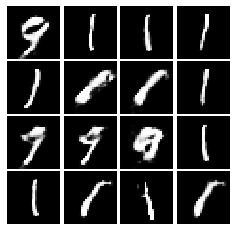

Epoch: 3, Iter: 1740, D: 0.5378, G:1.902


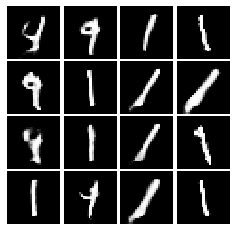

Epoch: 3, Iter: 1760, D: 0.4422, G:2.094


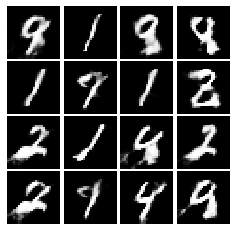

Epoch: 3, Iter: 1780, D: 0.543, G:2.027


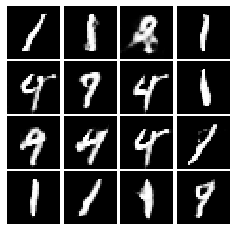

Epoch: 3, Iter: 1800, D: 0.5755, G:1.984


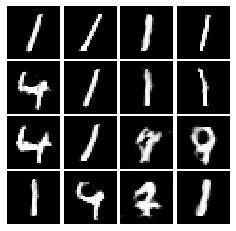

Epoch: 3, Iter: 1820, D: 0.7371, G:1.684


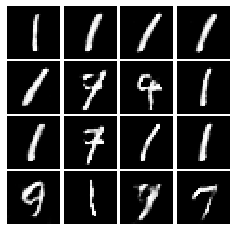

Epoch: 3, Iter: 1840, D: 0.5024, G:1.802


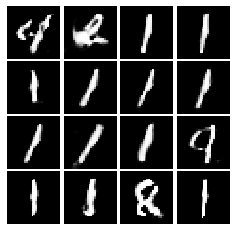

Epoch: 3, Iter: 1860, D: 0.5416, G:1.828


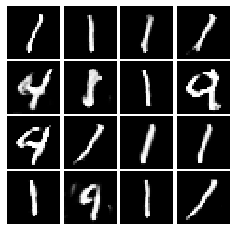

Epoch: 4, Iter: 1880, D: 0.4699, G:2.01


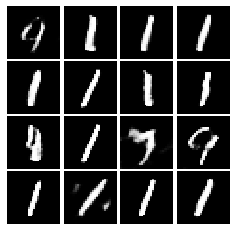

Epoch: 4, Iter: 1900, D: 0.5107, G:1.793


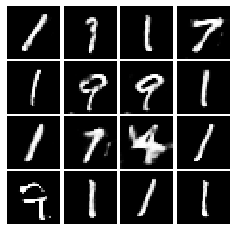

Epoch: 4, Iter: 1920, D: 0.5869, G:2.12


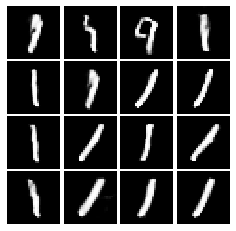

Epoch: 4, Iter: 1940, D: 0.8453, G:3.493


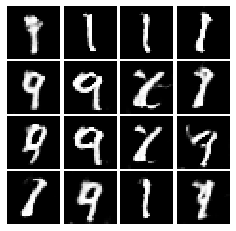

Epoch: 4, Iter: 1960, D: 0.5921, G:1.772


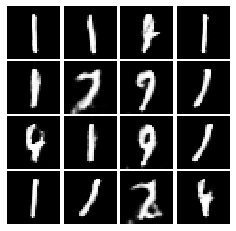

Epoch: 4, Iter: 1980, D: 0.4511, G:2.234


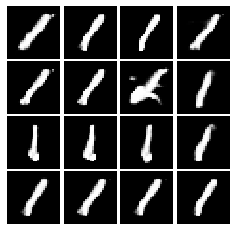

Epoch: 4, Iter: 2000, D: 0.7727, G:1.777


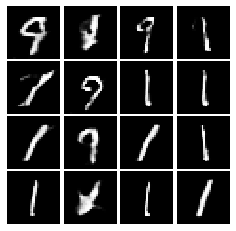

Epoch: 4, Iter: 2020, D: 0.657, G:2.145


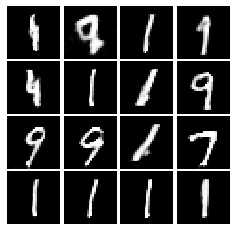

Epoch: 4, Iter: 2040, D: 0.5985, G:1.948


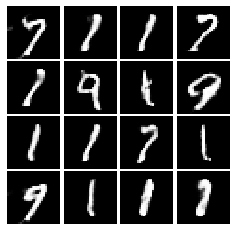

Epoch: 4, Iter: 2060, D: 0.4974, G:2.382


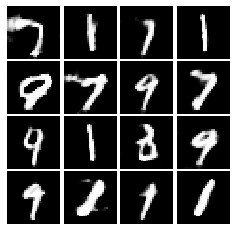

Epoch: 4, Iter: 2080, D: 0.5514, G:1.713


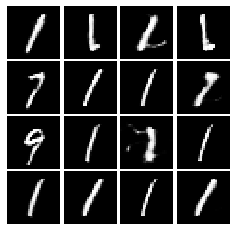

Epoch: 4, Iter: 2100, D: 0.524, G:2.274


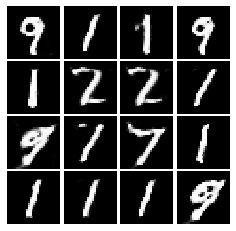

Epoch: 4, Iter: 2120, D: 0.6878, G:1.313


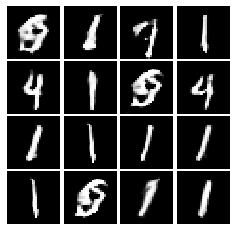

Epoch: 4, Iter: 2140, D: 0.6407, G:1.741


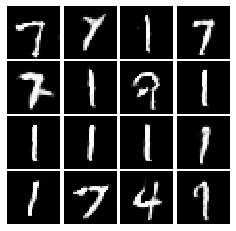

Epoch: 4, Iter: 2160, D: 0.7966, G:1.853


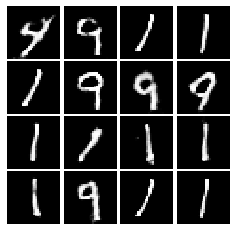

Epoch: 4, Iter: 2180, D: 0.6314, G:1.864


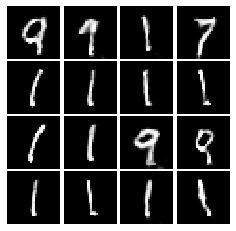

Epoch: 4, Iter: 2200, D: 0.5798, G:2.051


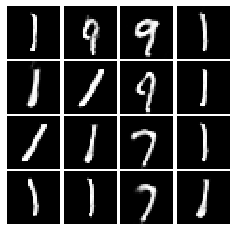

Epoch: 4, Iter: 2220, D: 0.7545, G:1.477


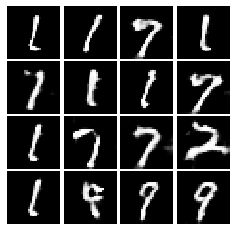

Epoch: 4, Iter: 2240, D: 0.5152, G:1.76


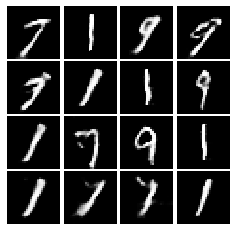

Epoch: 4, Iter: 2260, D: 0.4674, G:2.198


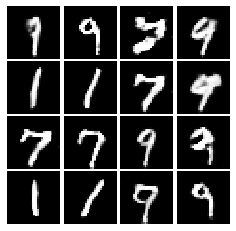

Epoch: 4, Iter: 2280, D: 0.4609, G:2.144


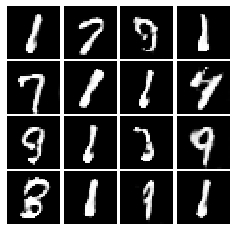

Epoch: 4, Iter: 2300, D: 0.5343, G:2.046


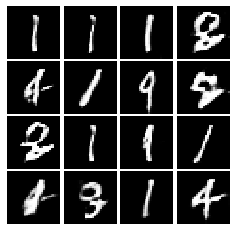

Epoch: 4, Iter: 2320, D: 0.4786, G:2.605


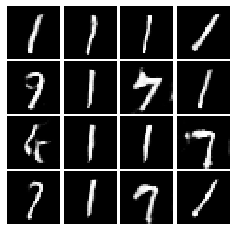

Epoch: 4, Iter: 2340, D: 0.501, G:2.742


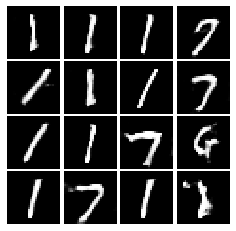

Epoch: 5, Iter: 2360, D: 0.5237, G:2.086


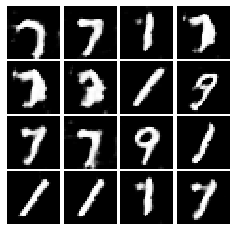

Epoch: 5, Iter: 2380, D: 0.6293, G:2.352


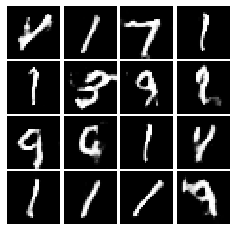

Epoch: 5, Iter: 2400, D: 0.5966, G:2.204


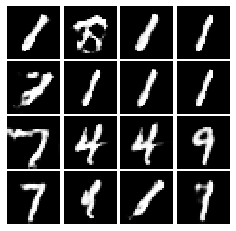

Epoch: 5, Iter: 2420, D: 0.484, G:2.498


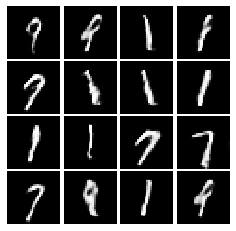

Epoch: 5, Iter: 2440, D: 0.4338, G:2.474


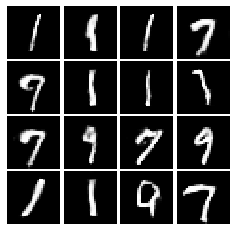

Epoch: 5, Iter: 2460, D: 0.7201, G:2.395


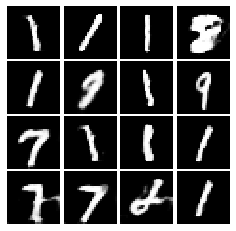

Epoch: 5, Iter: 2480, D: 0.4275, G:1.891


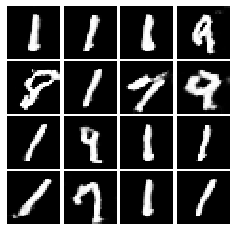

Epoch: 5, Iter: 2500, D: 0.4853, G:2.09


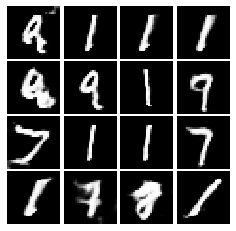

Epoch: 5, Iter: 2520, D: 0.74, G:2.433


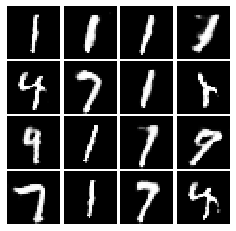

Epoch: 5, Iter: 2540, D: 0.6391, G:1.688


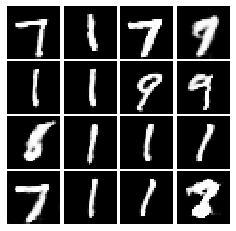

Epoch: 5, Iter: 2560, D: 0.6986, G:1.618


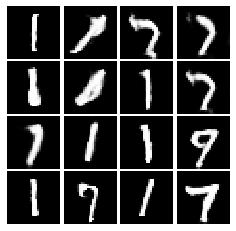

Epoch: 5, Iter: 2580, D: 0.767, G:1.682


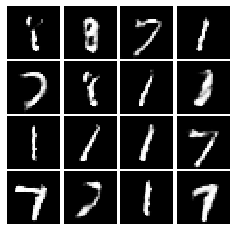

Epoch: 5, Iter: 2600, D: 0.69, G:1.515


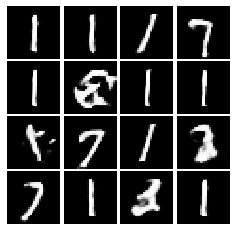

Epoch: 5, Iter: 2620, D: 0.664, G:2.423


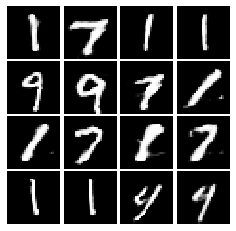

Epoch: 5, Iter: 2640, D: 0.6032, G:1.814


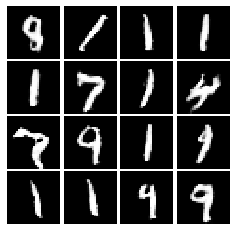

Epoch: 5, Iter: 2660, D: 0.5872, G:2.154


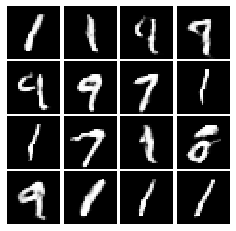

Epoch: 5, Iter: 2680, D: 0.8136, G:1.742


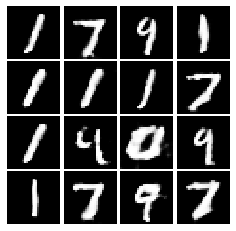

Epoch: 5, Iter: 2700, D: 0.6046, G:1.964


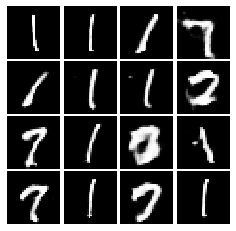

Epoch: 5, Iter: 2720, D: 0.6645, G:1.512


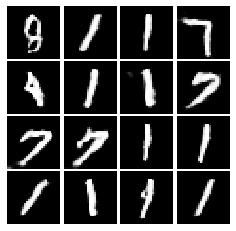

Epoch: 5, Iter: 2740, D: 0.597, G:2.336


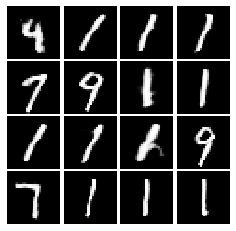

Epoch: 5, Iter: 2760, D: 0.73, G:2.082


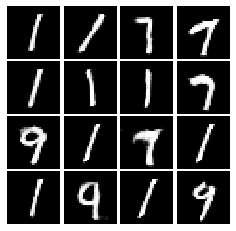

Epoch: 5, Iter: 2780, D: 0.5999, G:1.644


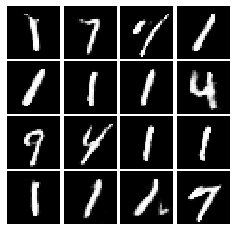

Epoch: 5, Iter: 2800, D: 0.5573, G:2.046


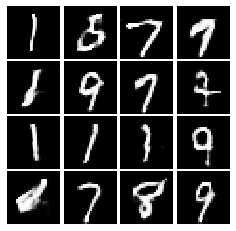

Epoch: 6, Iter: 2820, D: 0.7701, G:1.673


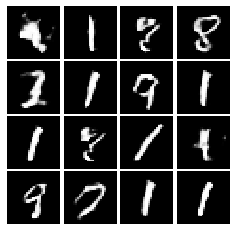

Epoch: 6, Iter: 2840, D: 0.7705, G:2.056


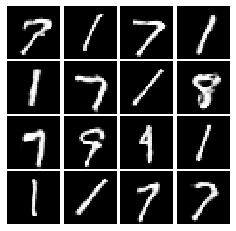

Epoch: 6, Iter: 2860, D: 0.8065, G:2.512


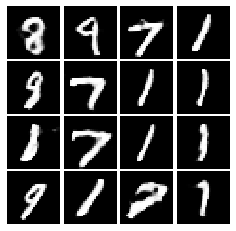

Epoch: 6, Iter: 2880, D: 0.6542, G:1.62


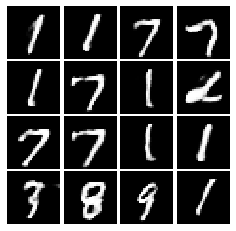

Epoch: 6, Iter: 2900, D: 0.6928, G:1.627


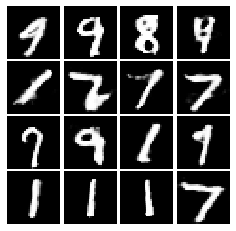

Epoch: 6, Iter: 2920, D: 0.7346, G:1.471


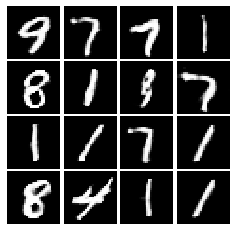

Epoch: 6, Iter: 2940, D: 0.7979, G:1.736


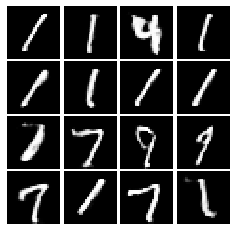

Epoch: 6, Iter: 2960, D: 0.7146, G:1.529


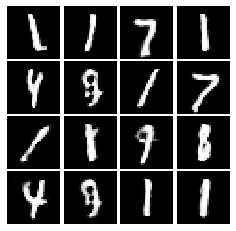

Epoch: 6, Iter: 2980, D: 0.6813, G:1.88


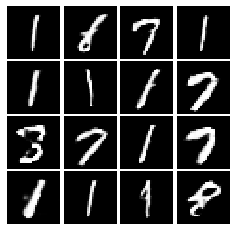

Epoch: 6, Iter: 3000, D: 0.6442, G:1.613


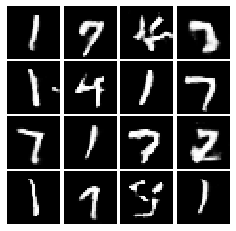

Epoch: 6, Iter: 3020, D: 0.8658, G:2.511


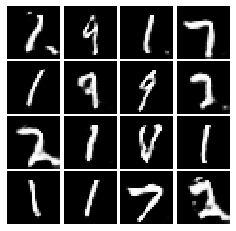

Epoch: 6, Iter: 3040, D: 0.5306, G:1.858


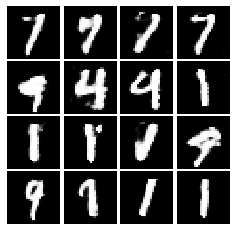

Epoch: 6, Iter: 3060, D: 0.5387, G:1.796


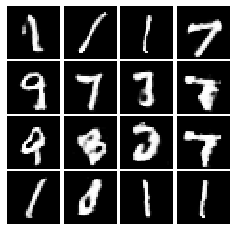

Epoch: 6, Iter: 3080, D: 0.5941, G:2.038


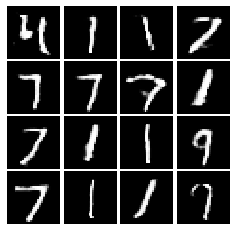

Epoch: 6, Iter: 3100, D: 0.6351, G:1.987


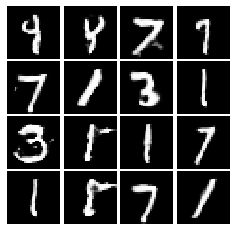

Epoch: 6, Iter: 3120, D: 0.769, G:1.857


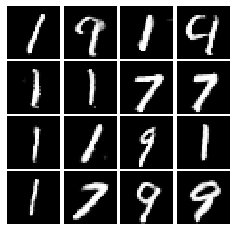

Epoch: 6, Iter: 3140, D: 0.7156, G:1.948


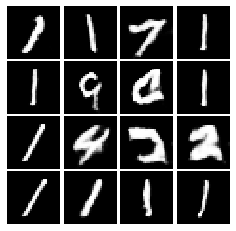

Epoch: 6, Iter: 3160, D: 0.6932, G:1.718


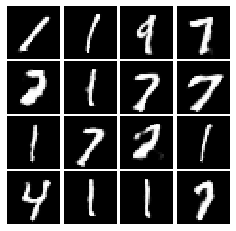

Epoch: 6, Iter: 3180, D: 0.6989, G:1.862


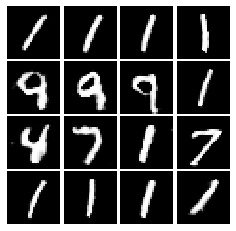

Epoch: 6, Iter: 3200, D: 0.5305, G:1.82


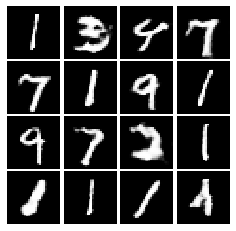

Epoch: 6, Iter: 3220, D: 0.527, G:1.75


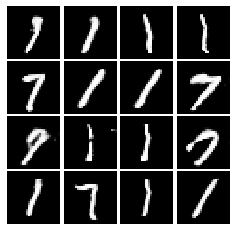

Epoch: 6, Iter: 3240, D: 0.6578, G:1.626


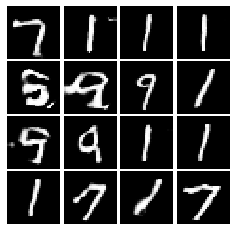

Epoch: 6, Iter: 3260, D: 0.6607, G:2.155


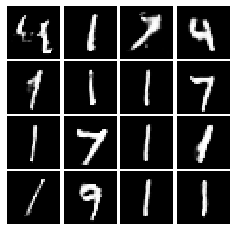

Epoch: 6, Iter: 3280, D: 0.8668, G:1.558


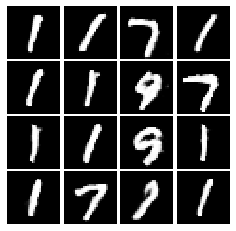

Epoch: 7, Iter: 3300, D: 0.4682, G:2.303


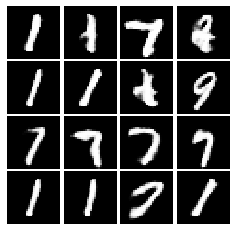

Epoch: 7, Iter: 3320, D: 0.6704, G:1.867


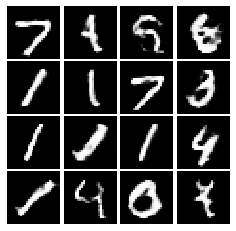

Epoch: 7, Iter: 3340, D: 0.8998, G:3.096


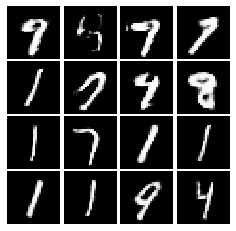

Epoch: 7, Iter: 3360, D: 0.713, G:1.918


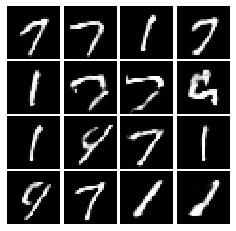

Epoch: 7, Iter: 3380, D: 0.6476, G:1.616


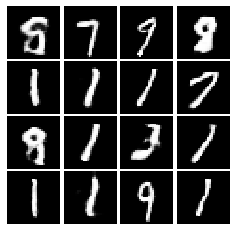

Epoch: 7, Iter: 3400, D: 0.6312, G:2.083


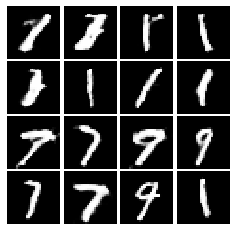

Epoch: 7, Iter: 3420, D: 0.593, G:2.0


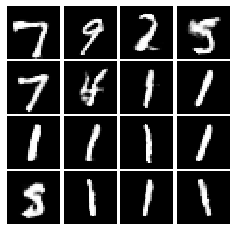

Epoch: 7, Iter: 3440, D: 0.7439, G:1.719


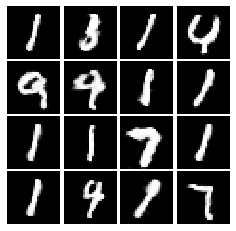

Epoch: 7, Iter: 3460, D: 0.6951, G:1.622


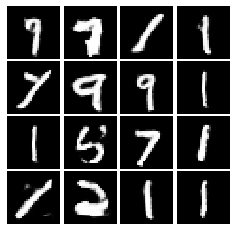

Epoch: 7, Iter: 3480, D: 0.6768, G:1.562


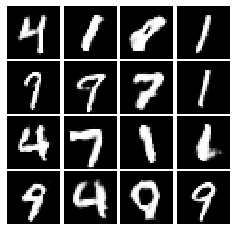

Epoch: 7, Iter: 3500, D: 0.6558, G:1.884


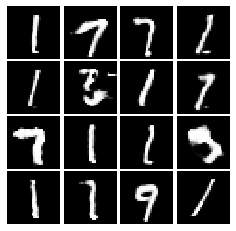

Epoch: 7, Iter: 3520, D: 0.6497, G:2.263


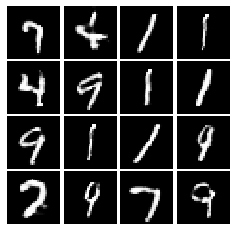

Epoch: 7, Iter: 3540, D: 0.5263, G:1.908


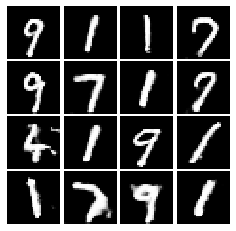

Epoch: 7, Iter: 3560, D: 0.5483, G:1.977


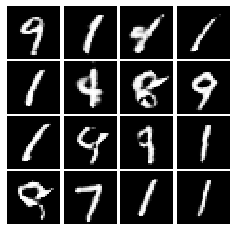

Epoch: 7, Iter: 3580, D: 0.7531, G:3.05


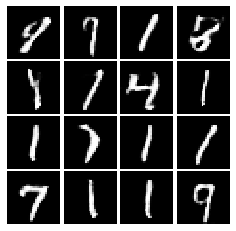

Epoch: 7, Iter: 3600, D: 0.7522, G:1.838


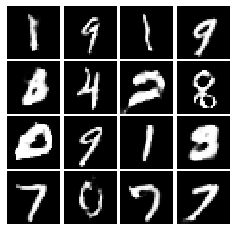

Epoch: 7, Iter: 3620, D: 0.6197, G:2.018


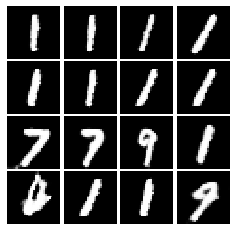

Epoch: 7, Iter: 3640, D: 0.6835, G:1.767


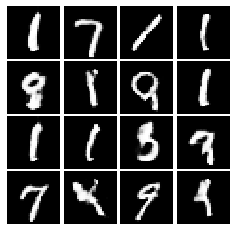

Epoch: 7, Iter: 3660, D: 0.6248, G:2.042


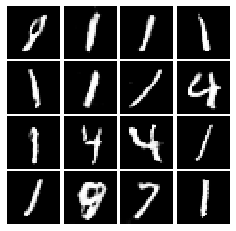

Epoch: 7, Iter: 3680, D: 0.7542, G:1.65


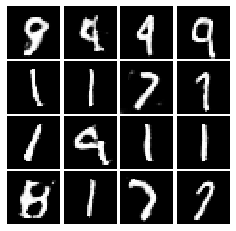

Epoch: 7, Iter: 3700, D: 0.7124, G:1.566


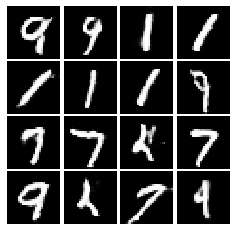

Epoch: 7, Iter: 3720, D: 0.5789, G:1.791


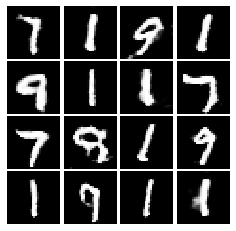

Epoch: 7, Iter: 3740, D: 0.7735, G:2.125


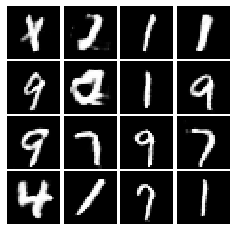

Epoch: 8, Iter: 3760, D: 0.724, G:1.5


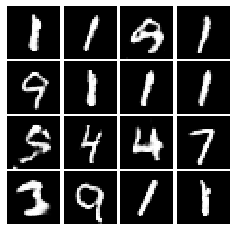

Epoch: 8, Iter: 3780, D: 0.6238, G:1.523


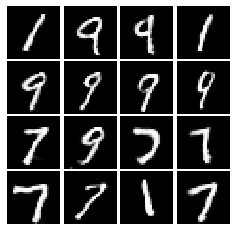

Epoch: 8, Iter: 3800, D: 0.7615, G:2.167


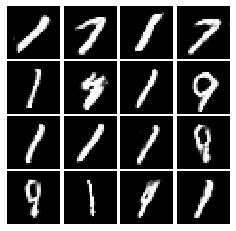

Epoch: 8, Iter: 3820, D: 0.8873, G:1.645


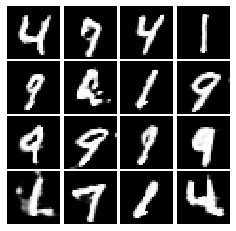

Epoch: 8, Iter: 3840, D: 0.7463, G:1.403


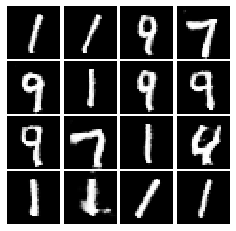

Epoch: 8, Iter: 3860, D: 0.5666, G:1.768


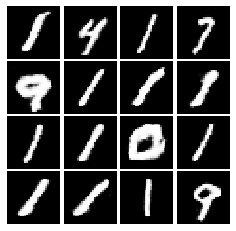

Epoch: 8, Iter: 3880, D: 1.002, G:1.437


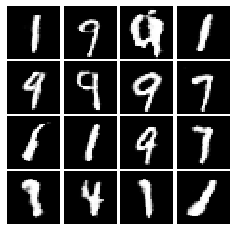

Epoch: 8, Iter: 3900, D: 0.7795, G:1.792


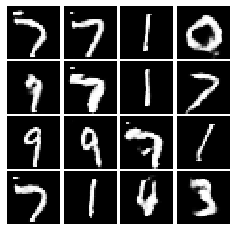

Epoch: 8, Iter: 3920, D: 0.5946, G:2.194


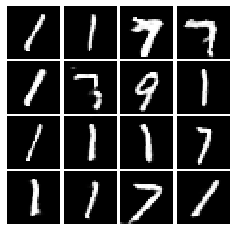

Epoch: 8, Iter: 3940, D: 0.7355, G:1.464


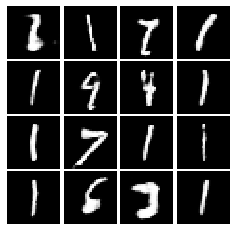

Epoch: 8, Iter: 3960, D: 0.7579, G:1.901


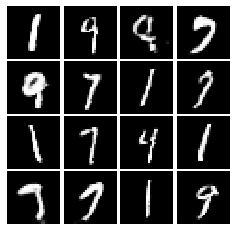

Epoch: 8, Iter: 3980, D: 0.6923, G:1.559


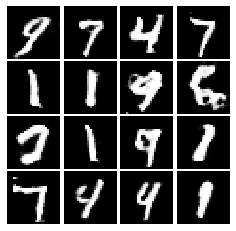

Epoch: 8, Iter: 4000, D: 0.8277, G:1.651


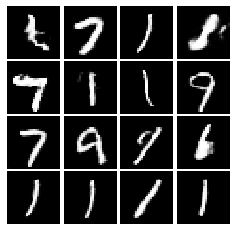

Epoch: 8, Iter: 4020, D: 0.6497, G:1.526


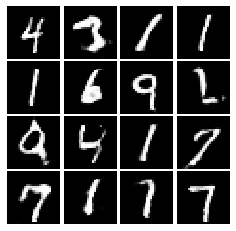

Epoch: 8, Iter: 4040, D: 0.7963, G:1.467


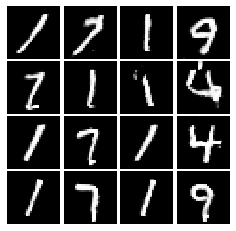

Epoch: 8, Iter: 4060, D: 0.7011, G:1.681


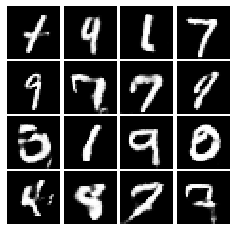

Epoch: 8, Iter: 4080, D: 0.79, G:1.257


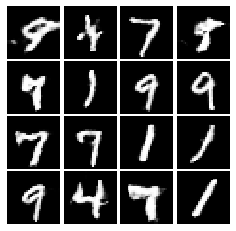

Epoch: 8, Iter: 4100, D: 0.7366, G:1.707


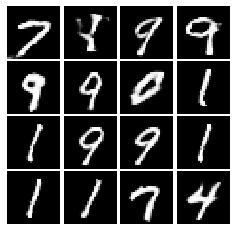

Epoch: 8, Iter: 4120, D: 0.7591, G:1.607


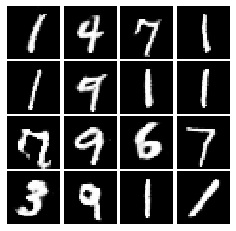

Epoch: 8, Iter: 4140, D: 0.7744, G:1.904


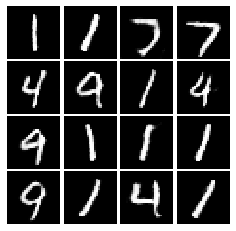

Epoch: 8, Iter: 4160, D: 0.7272, G:1.767


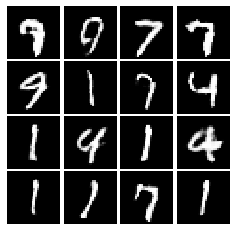

Epoch: 8, Iter: 4180, D: 0.7826, G:1.944


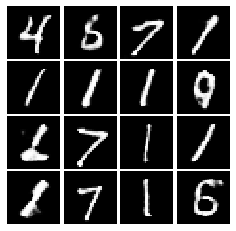

Epoch: 8, Iter: 4200, D: 0.7041, G:1.777


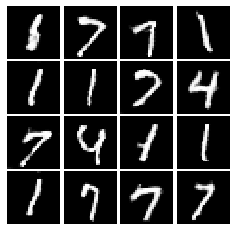

Epoch: 8, Iter: 4220, D: 0.482, G:2.027


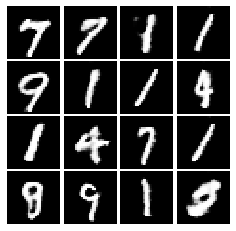

Epoch: 9, Iter: 4240, D: 0.6332, G:1.473


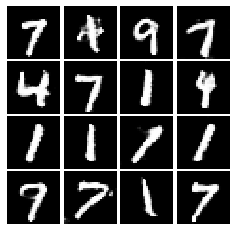

Epoch: 9, Iter: 4260, D: 0.6881, G:1.956


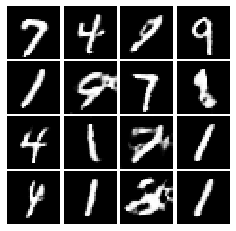

Epoch: 9, Iter: 4280, D: 0.6664, G:1.321


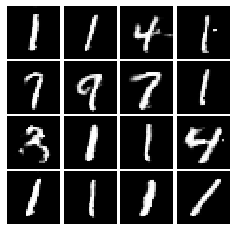

Epoch: 9, Iter: 4300, D: 0.9137, G:1.844


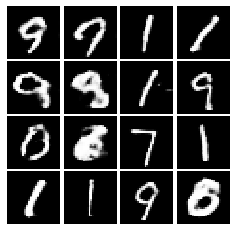

Epoch: 9, Iter: 4320, D: 0.664, G:1.551


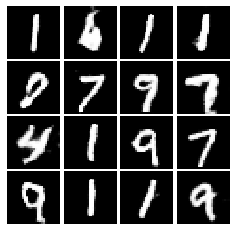

Epoch: 9, Iter: 4340, D: 0.5747, G:1.549


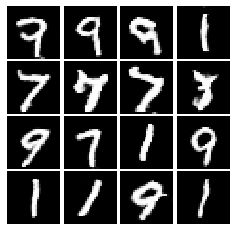

Epoch: 9, Iter: 4360, D: 0.7623, G:2.165


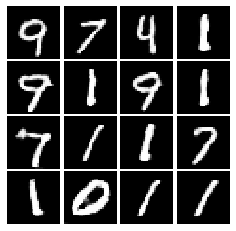

Epoch: 9, Iter: 4380, D: 0.7166, G:1.493


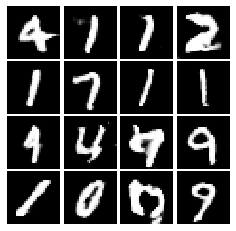

Epoch: 9, Iter: 4400, D: 0.6745, G:1.768


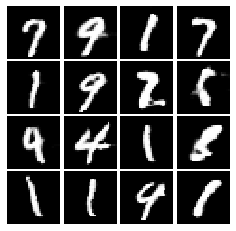

Epoch: 9, Iter: 4420, D: 0.7096, G:2.055


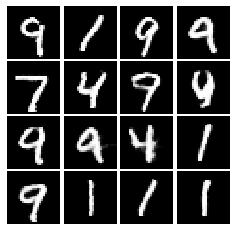

Epoch: 9, Iter: 4440, D: 0.792, G:2.075


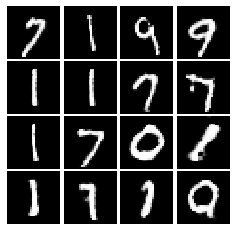

Epoch: 9, Iter: 4460, D: 0.6503, G:1.992


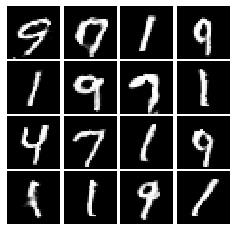

Epoch: 9, Iter: 4480, D: 0.7221, G:1.904


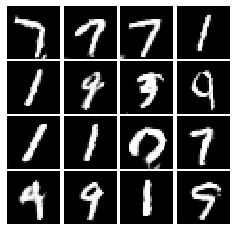

Epoch: 9, Iter: 4500, D: 0.6943, G:1.452


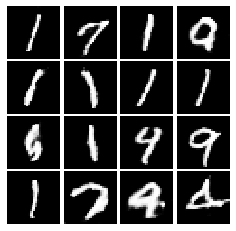

Epoch: 9, Iter: 4520, D: 0.6534, G:2.204


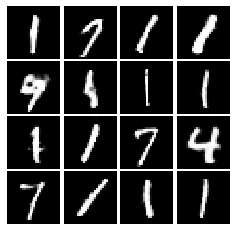

Epoch: 9, Iter: 4540, D: 0.8262, G:1.881


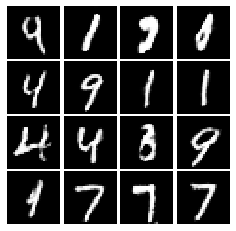

Epoch: 9, Iter: 4560, D: 0.6019, G:1.908


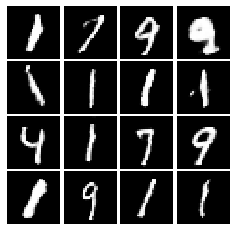

Epoch: 9, Iter: 4580, D: 0.6264, G:1.894


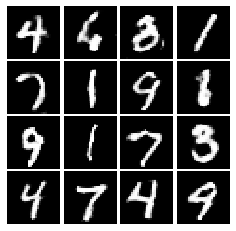

Epoch: 9, Iter: 4600, D: 0.6776, G:1.497


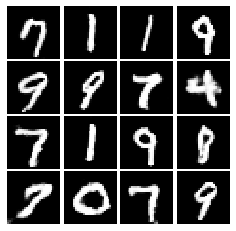

Epoch: 9, Iter: 4620, D: 0.701, G:1.706


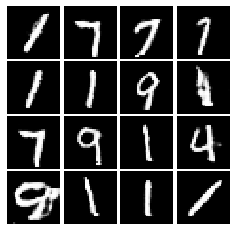

Epoch: 9, Iter: 4640, D: 0.455, G:1.827


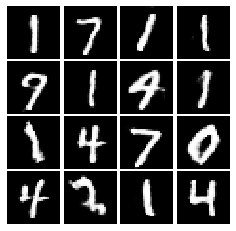

Epoch: 9, Iter: 4660, D: 0.6535, G:1.969


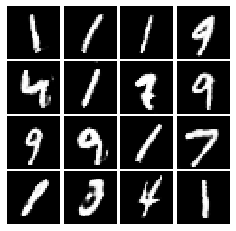

Epoch: 9, Iter: 4680, D: 0.7096, G:2.705


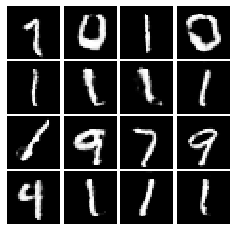

Final images


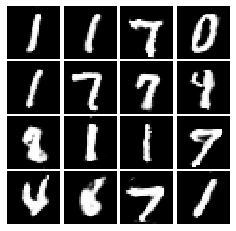

In [15]:
D = DC_Discriminator()
G = DC_Generator()

# Use the function you wrote earlier to get optimizers for the Discriminator and the Generator
D_solver = tf.keras.optimizers.Adam(learning_rate=1e-3, beta_1=0.5, beta_2=0.999)
G_solver = tf.keras.optimizers.Adam(learning_rate=1e-3, beta_1=0.5, beta_2=0.999)
    
# Run it!
#print(G.summary())
train(D, G, D_solver, G_solver, discriminator_loss,generator_loss)

Now, train your DCGAN model with LSGAN loss function. Observe the visualized result of your model, and describe what you see.

In [0]:
# a giant helper function
def train(D, G, D_solver, G_solver, ls_discriminator_loss, ls_generator_loss,\
              show_every=20, print_every=20, batch_size=128, num_epochs=10, noise_size=100):
    """
    Train loop for GAN.

    The loop will consist of two steps: a discriminator step and a generator step.

    (1) In the discriminator step, first step is to sample noise to generate a fake data batch using the generator. 
    Calculate the discriminator output for real and fake data, and use the output to compute discriminator loss. 
    In code 'd_total_error' is the total discriminator loss.
    
    (2) For the generator step, first step is to sample noise to generate a fake data batch. 
    Get the discriminator output for the fake data batch and use this to compute the generator loss. 
    In code 'g_error' is the generator loss. 
    
    Use the sample_noise function to sample random noise, and the discriminator_loss
    and generator_loss functions for their respective loss computations

    Inputs:
    - D: Discriminator model
    - G: Generator model
    - D_solver: an Optimizer for Discriminator
    - G_solver: an Optimizer for Generator
    - generator_loss: Generator loss
    - discriminator_loss: Discriminator loss
    Returns:
        Nothing
    """
    mnist = MNIST(batch_size=batch_size, shuffle=True)
    
    iter_count = 0
    for epoch in range(num_epochs):
        for (x, _) in mnist:
            with tf.GradientTape() as tape:
                real_data = x
                ##########################################
                # your code   # Discriminator step       # 
                logits_real = D(preprocess_img(real_data))
                noise = sample_noise(batch_size,noise_size)
                fake_images = G(noise) 
                logits_fake = D(tf.reshape(fake_images, [batch_size, 784]))
                d_total_error = ls_discriminator_loss(logits_real,logits_fake)
                ##########################################
                d_gradients = tape.gradient(d_total_error, D.trainable_variables)      
                D_solver.apply_gradients(zip(d_gradients, D.trainable_variables))
            
            with tf.GradientTape() as tape:
                ##########################################
                # your code # Generator step             # 
                noise = sample_noise(batch_size,noise_size)
                fake_images = G(noise)
                gen_logits_fake = D(tf.reshape(fake_images, [batch_size, 784]))
                g_error = ls_generator_loss(gen_logits_fake)
                ##########################################
                g_gradients = tape.gradient(g_error, G.trainable_variables)      
                G_solver.apply_gradients(zip(g_gradients, G.trainable_variables))

            if (iter_count % show_every == 0):
                print('Epoch: {}, Iter: {}, D: {:.4}, G:{:.4}'.format(epoch, iter_count,d_total_error,g_error))
                imgs_numpy = fake_images.cpu().numpy()
                show_images(imgs_numpy[0:16])
                plt.show()
            iter_count += 1
    
    # random noise fed into our generator
    z = sample_noise(batch_size, noise_size)
    # generated images
    G_sample = G(z)
    print('Final images')
    show_images(G_sample[:16])
    plt.show()

Epoch: 0, Iter: 0, D: 0.4203, G:0.3737


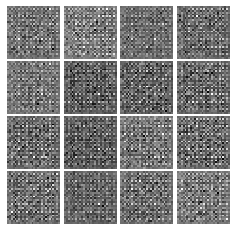

Epoch: 0, Iter: 20, D: 0.3448, G:0.09688


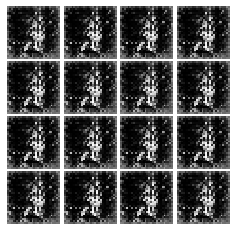

Epoch: 0, Iter: 40, D: 0.02647, G:0.4874


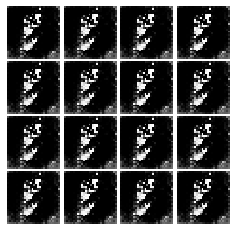

Epoch: 0, Iter: 60, D: 0.02898, G:0.5164


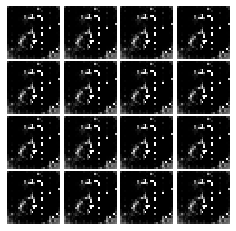

Epoch: 0, Iter: 80, D: 0.01126, G:0.6066


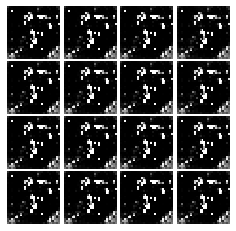

Epoch: 0, Iter: 100, D: 0.02246, G:0.6358


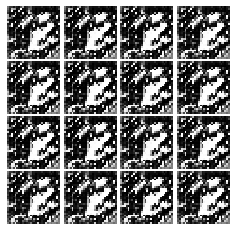

Epoch: 0, Iter: 120, D: 0.003333, G:0.5298


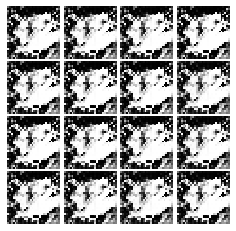

Epoch: 0, Iter: 140, D: 0.06027, G:0.3973


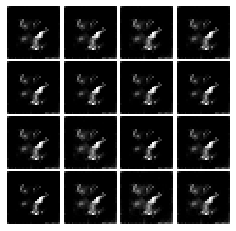

Epoch: 0, Iter: 160, D: 0.01365, G:0.5237


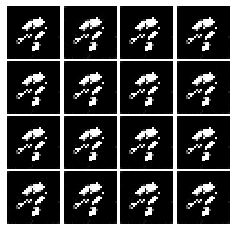

Epoch: 0, Iter: 180, D: 0.016, G:0.5707


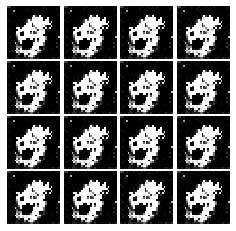

Epoch: 0, Iter: 200, D: 0.003712, G:0.4847


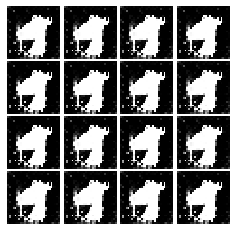

Epoch: 0, Iter: 220, D: 0.003929, G:0.4665


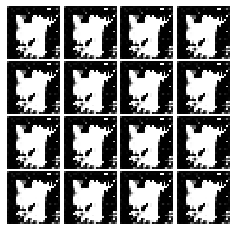

Epoch: 0, Iter: 240, D: 0.002044, G:0.5058


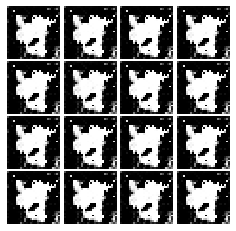

Epoch: 0, Iter: 260, D: 0.003465, G:0.5296


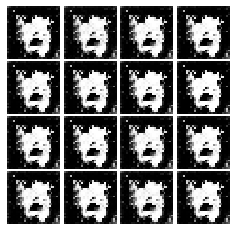

Epoch: 0, Iter: 280, D: 0.2278, G:0.3008


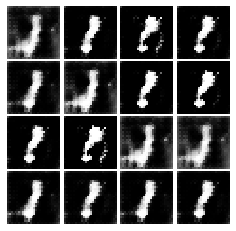

Epoch: 0, Iter: 300, D: 0.1594, G:0.338


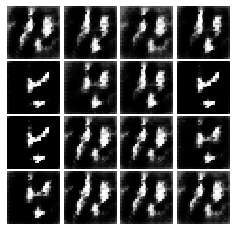

Epoch: 0, Iter: 320, D: 0.05621, G:0.3524


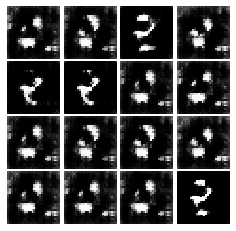

Epoch: 0, Iter: 340, D: 0.09305, G:0.2771


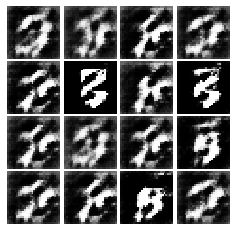

Epoch: 0, Iter: 360, D: 0.07662, G:0.5914


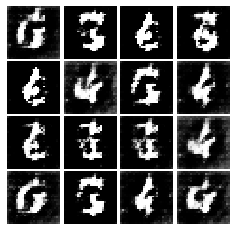

Epoch: 0, Iter: 380, D: 0.0676, G:0.3683


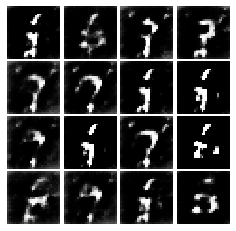

Epoch: 0, Iter: 400, D: 0.1038, G:0.4086


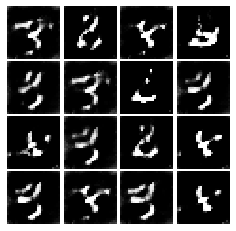

Epoch: 0, Iter: 420, D: 0.04688, G:0.4103


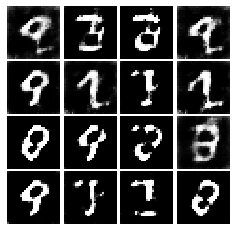

Epoch: 0, Iter: 440, D: 0.07629, G:0.3577


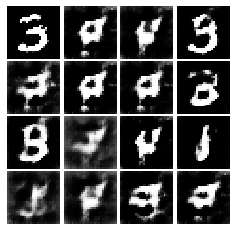

Epoch: 0, Iter: 460, D: 0.06725, G:0.3824


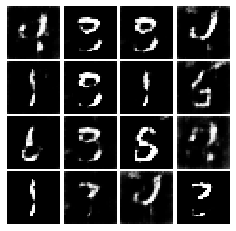

Epoch: 1, Iter: 480, D: 0.08133, G:0.3705


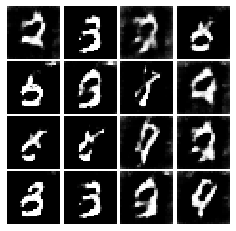

Epoch: 1, Iter: 500, D: 0.06987, G:0.4797


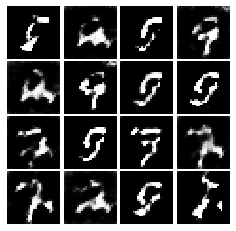

Epoch: 1, Iter: 520, D: 0.07172, G:0.6061


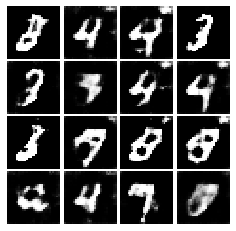

Epoch: 1, Iter: 540, D: 0.1102, G:0.4742


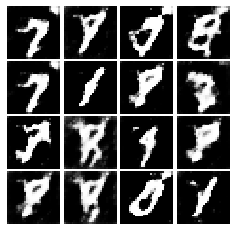

Epoch: 1, Iter: 560, D: 0.1102, G:0.2639


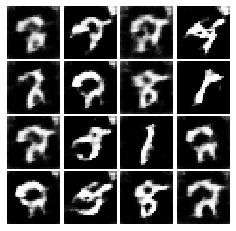

Epoch: 1, Iter: 580, D: 0.09745, G:0.3291


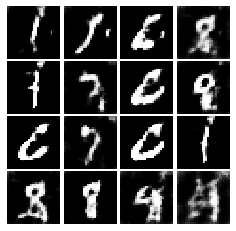

Epoch: 1, Iter: 600, D: 0.09664, G:0.3417


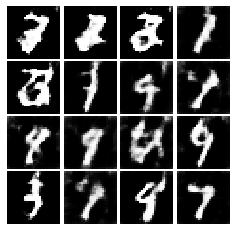

Epoch: 1, Iter: 620, D: 0.1222, G:0.3507


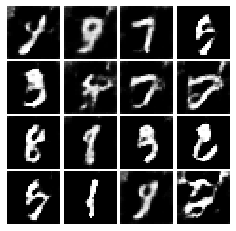

Epoch: 1, Iter: 640, D: 0.1079, G:0.426


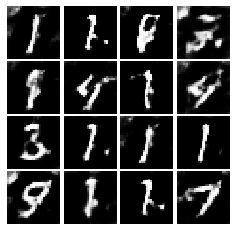

Epoch: 1, Iter: 660, D: 0.08828, G:0.3435


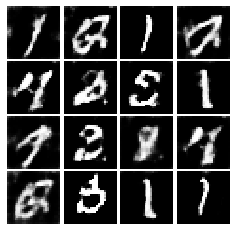

Epoch: 1, Iter: 680, D: 0.1134, G:0.321


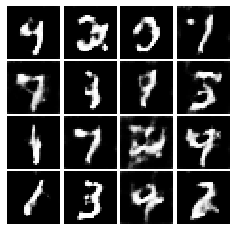

Epoch: 1, Iter: 700, D: 0.09538, G:0.3231


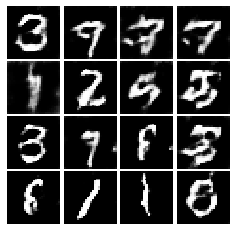

Epoch: 1, Iter: 720, D: 0.09266, G:0.3861


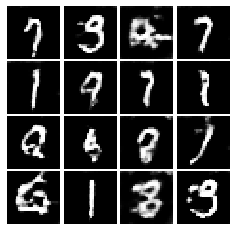

Epoch: 1, Iter: 740, D: 0.1356, G:0.4195


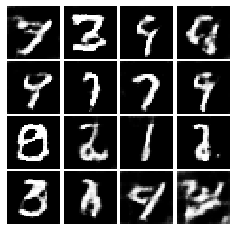

Epoch: 1, Iter: 760, D: 0.1349, G:0.3069


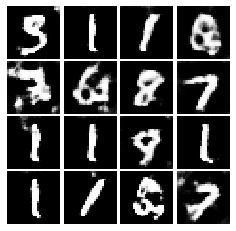

Epoch: 1, Iter: 780, D: 0.1191, G:0.2886


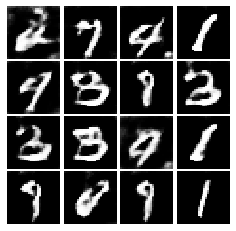

Epoch: 1, Iter: 800, D: 0.1424, G:0.3227


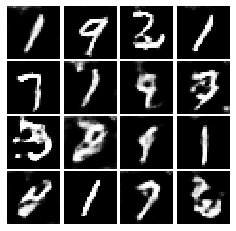

Epoch: 1, Iter: 820, D: 0.1505, G:0.2463


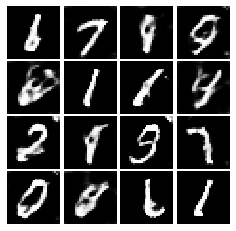

Epoch: 1, Iter: 840, D: 0.1463, G:0.3873


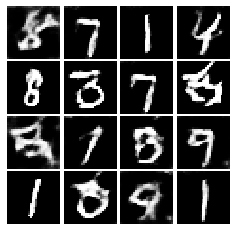

Epoch: 1, Iter: 860, D: 0.1342, G:0.2676


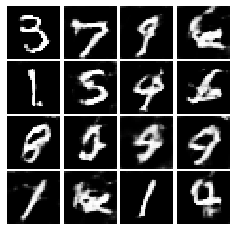

Epoch: 1, Iter: 880, D: 0.119, G:0.3413


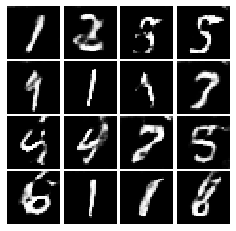

Epoch: 1, Iter: 900, D: 0.144, G:0.3467


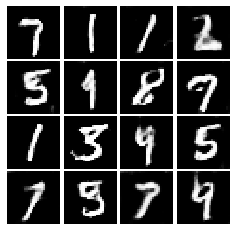

Epoch: 1, Iter: 920, D: 0.1396, G:0.252


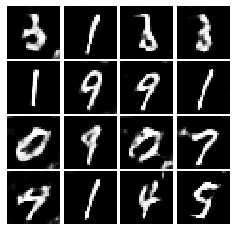

Epoch: 2, Iter: 940, D: 0.1063, G:0.3349


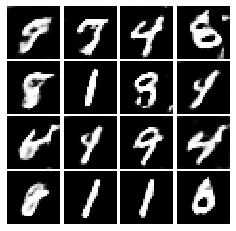

Epoch: 2, Iter: 960, D: 0.1534, G:0.2448


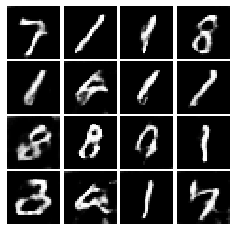

Epoch: 2, Iter: 980, D: 0.146, G:0.2622


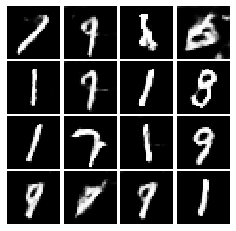

Epoch: 2, Iter: 1000, D: 0.1314, G:0.2483


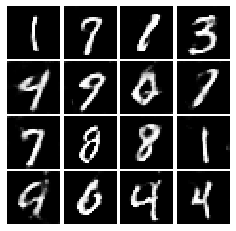

Epoch: 2, Iter: 1020, D: 0.1436, G:0.3264


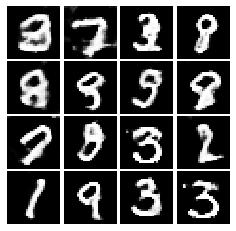

Epoch: 2, Iter: 1040, D: 0.1664, G:0.3462


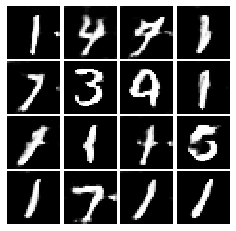

Epoch: 2, Iter: 1060, D: 0.1406, G:0.2842


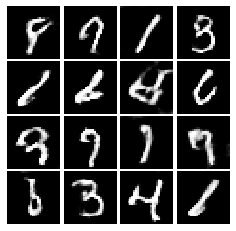

Epoch: 2, Iter: 1080, D: 0.1545, G:0.2797


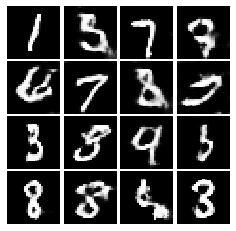

Epoch: 2, Iter: 1100, D: 0.1676, G:0.2579


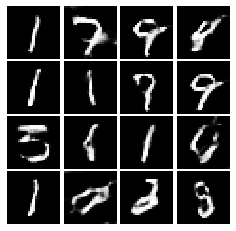

Epoch: 2, Iter: 1120, D: 0.1563, G:0.2335


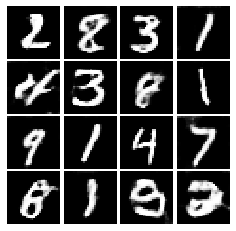

Epoch: 2, Iter: 1140, D: 0.143, G:0.2326


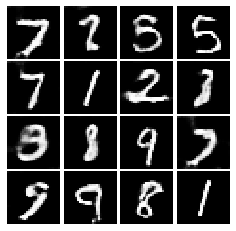

Epoch: 2, Iter: 1160, D: 0.1421, G:0.2892


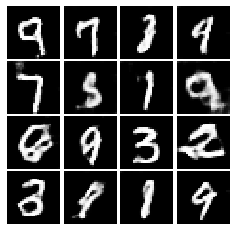

Epoch: 2, Iter: 1180, D: 0.1775, G:0.2414


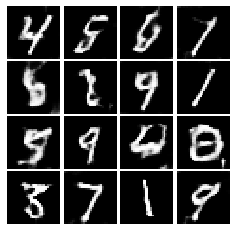

Epoch: 2, Iter: 1200, D: 0.1842, G:0.2012


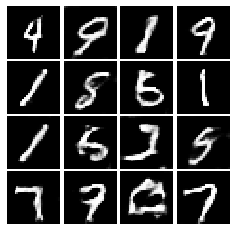

Epoch: 2, Iter: 1220, D: 0.1675, G:0.2599


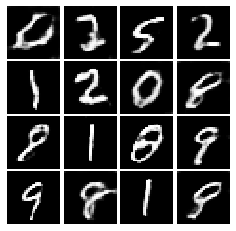

Epoch: 2, Iter: 1240, D: 0.1538, G:0.2403


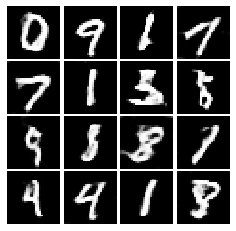

Epoch: 2, Iter: 1260, D: 0.1724, G:0.2524


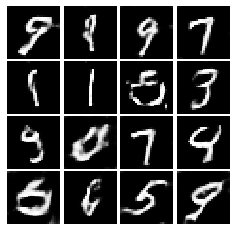

Epoch: 2, Iter: 1280, D: 0.1603, G:0.3205


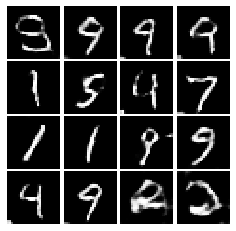

Epoch: 2, Iter: 1300, D: 0.1605, G:0.2232


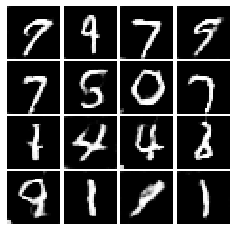

Epoch: 2, Iter: 1320, D: 0.1497, G:0.3193


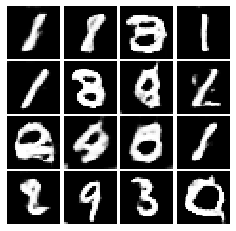

Epoch: 2, Iter: 1340, D: 0.1714, G:0.2122


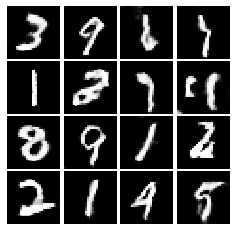

Epoch: 2, Iter: 1360, D: 0.1751, G:0.2762


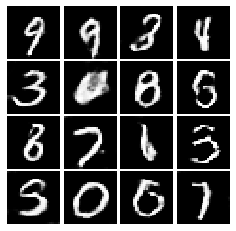

Epoch: 2, Iter: 1380, D: 0.1569, G:0.2689


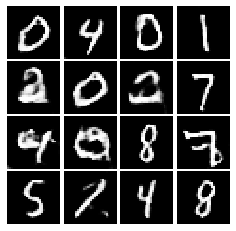

Epoch: 2, Iter: 1400, D: 0.1409, G:0.2974


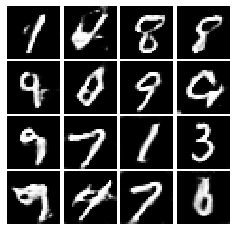

Epoch: 3, Iter: 1420, D: 0.1883, G:0.2472


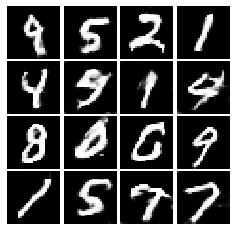

Epoch: 3, Iter: 1440, D: 0.1554, G:0.195


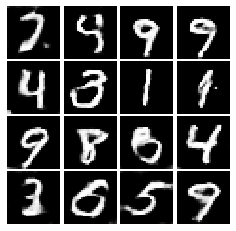

Epoch: 3, Iter: 1460, D: 0.1544, G:0.2653


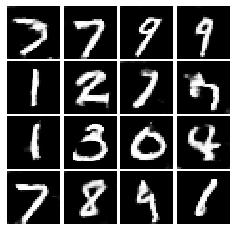

Epoch: 3, Iter: 1480, D: 0.214, G:0.2135


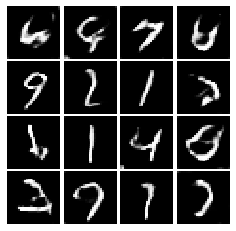

Epoch: 3, Iter: 1500, D: 0.1642, G:0.256


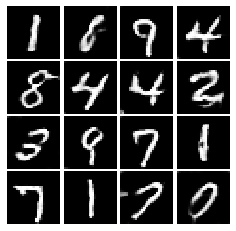

Epoch: 3, Iter: 1520, D: 0.2068, G:0.235


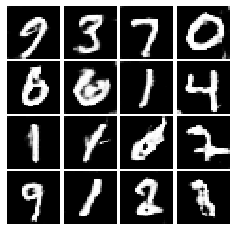

Epoch: 3, Iter: 1540, D: 0.1668, G:0.2107


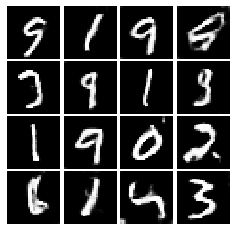

Epoch: 3, Iter: 1560, D: 0.1888, G:0.2372


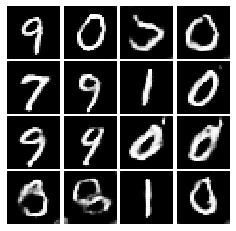

Epoch: 3, Iter: 1580, D: 0.1603, G:0.2005


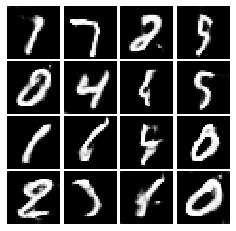

Epoch: 3, Iter: 1600, D: 0.1521, G:0.257


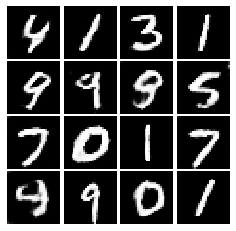

Epoch: 3, Iter: 1620, D: 0.1727, G:0.3274


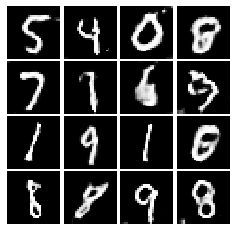

Epoch: 3, Iter: 1640, D: 0.1366, G:0.2726


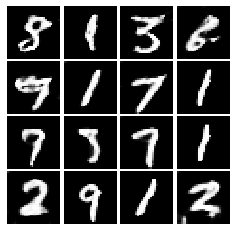

Epoch: 3, Iter: 1660, D: 0.1588, G:0.306


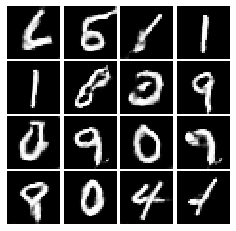

Epoch: 3, Iter: 1680, D: 0.1936, G:0.2119


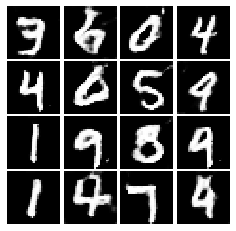

Epoch: 3, Iter: 1700, D: 0.1404, G:0.3051


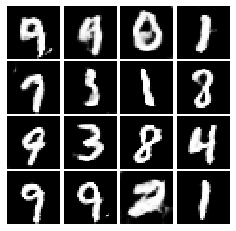

Epoch: 3, Iter: 1720, D: 0.1964, G:0.2712


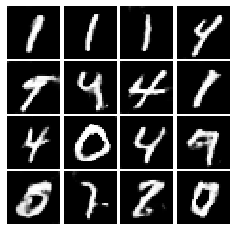

Epoch: 3, Iter: 1740, D: 0.1597, G:0.267


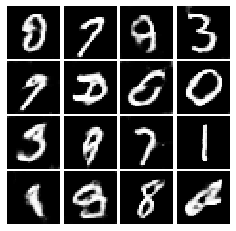

Epoch: 3, Iter: 1760, D: 0.1481, G:0.2685


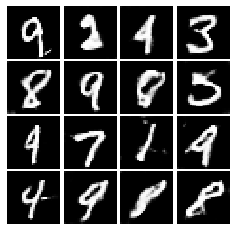

Epoch: 3, Iter: 1780, D: 0.1729, G:0.2381


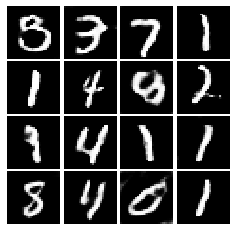

Epoch: 3, Iter: 1800, D: 0.214, G:0.1771


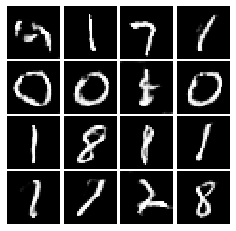

Epoch: 3, Iter: 1820, D: 0.1808, G:0.2262


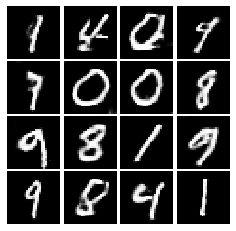

Epoch: 3, Iter: 1840, D: 0.1582, G:0.2173


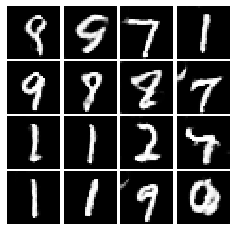

Epoch: 3, Iter: 1860, D: 0.1602, G:0.2073


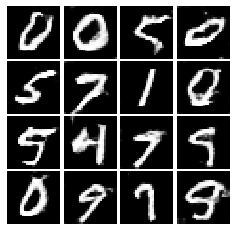

Epoch: 4, Iter: 1880, D: 0.1561, G:0.2335


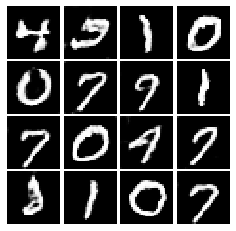

Epoch: 4, Iter: 1900, D: 0.17, G:0.2684


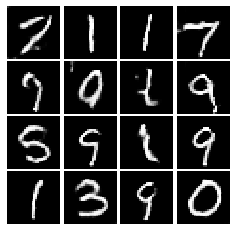

Epoch: 4, Iter: 1920, D: 0.176, G:0.1791


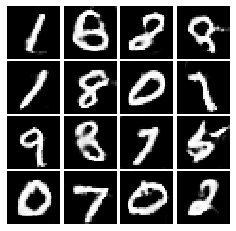

Epoch: 4, Iter: 1940, D: 0.1783, G:0.2008


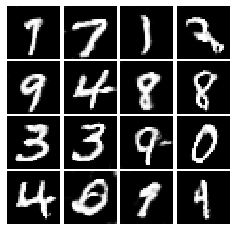

Epoch: 4, Iter: 1960, D: 0.1802, G:0.2097


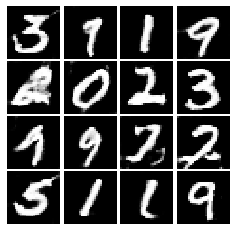

Epoch: 4, Iter: 1980, D: 0.1515, G:0.284


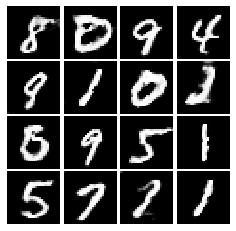

Epoch: 4, Iter: 2000, D: 0.2335, G:0.1709


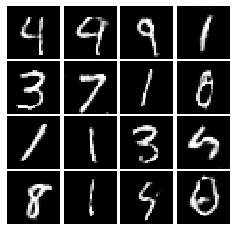

Epoch: 4, Iter: 2020, D: 0.1858, G:0.3002


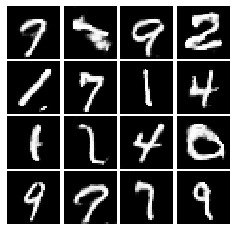

Epoch: 4, Iter: 2040, D: 0.1723, G:0.2137


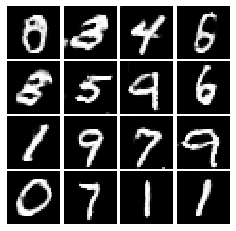

Epoch: 4, Iter: 2060, D: 0.1492, G:0.2692


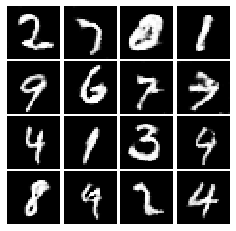

Epoch: 4, Iter: 2080, D: 0.1786, G:0.2464


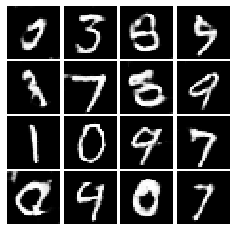

Epoch: 4, Iter: 2100, D: 0.2257, G:0.2772


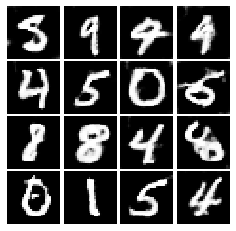

Epoch: 4, Iter: 2120, D: 0.172, G:0.1922


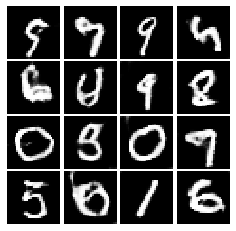

Epoch: 4, Iter: 2140, D: 0.1553, G:0.2686


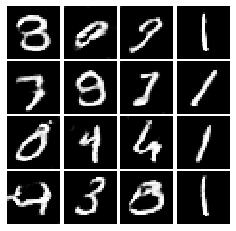

Epoch: 4, Iter: 2160, D: 0.1807, G:0.2191


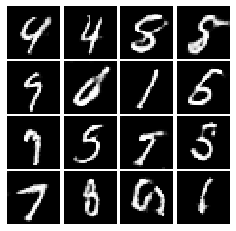

Epoch: 4, Iter: 2180, D: 0.181, G:0.2361


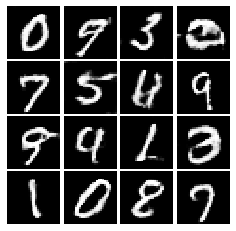

Epoch: 4, Iter: 2200, D: 0.185, G:0.2042


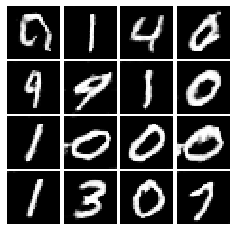

Epoch: 4, Iter: 2220, D: 0.1584, G:0.2175


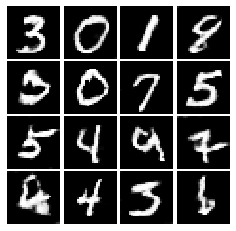

Epoch: 4, Iter: 2240, D: 0.1363, G:0.2914


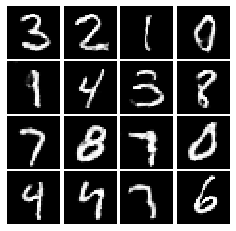

Epoch: 4, Iter: 2260, D: 0.1806, G:0.2559


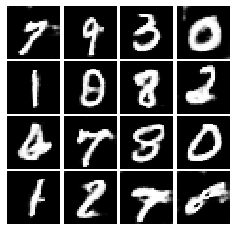

Epoch: 4, Iter: 2280, D: 0.154, G:0.2483


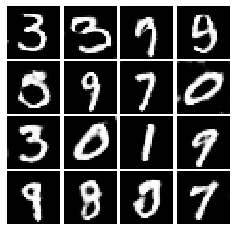

Epoch: 4, Iter: 2300, D: 0.1897, G:0.2657


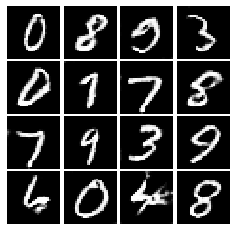

Epoch: 4, Iter: 2320, D: 0.1547, G:0.3665


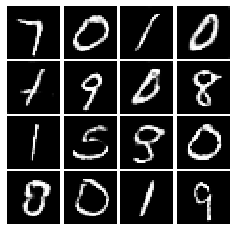

Epoch: 4, Iter: 2340, D: 0.1794, G:0.344


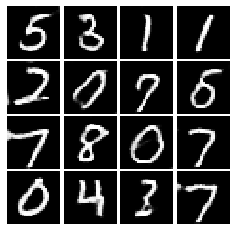

Epoch: 5, Iter: 2360, D: 0.1915, G:0.1917


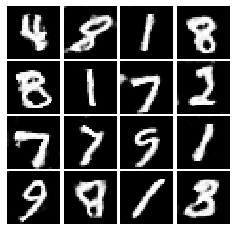

Epoch: 5, Iter: 2380, D: 0.1827, G:0.186


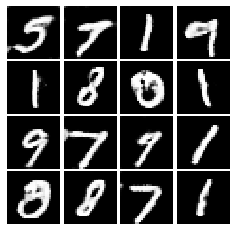

Epoch: 5, Iter: 2400, D: 0.1557, G:0.4579


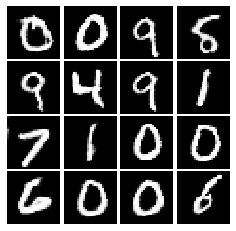

Epoch: 5, Iter: 2420, D: 0.2057, G:0.2408


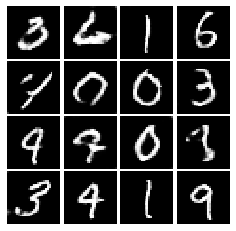

Epoch: 5, Iter: 2440, D: 0.1896, G:0.312


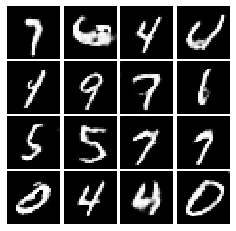

Epoch: 5, Iter: 2460, D: 0.1164, G:0.2669


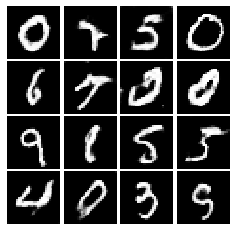

Epoch: 5, Iter: 2480, D: 0.1608, G:0.2345


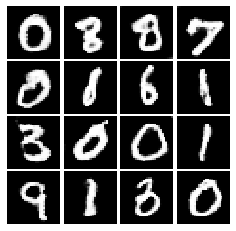

Epoch: 5, Iter: 2500, D: 0.1504, G:0.2738


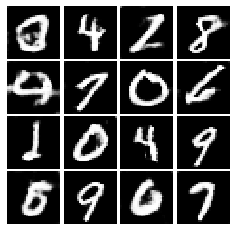

Epoch: 5, Iter: 2520, D: 0.2209, G:0.2796


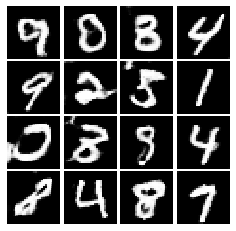

Epoch: 5, Iter: 2540, D: 0.1653, G:0.2934


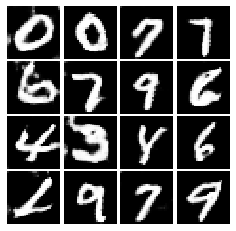

Epoch: 5, Iter: 2560, D: 0.2045, G:0.1912


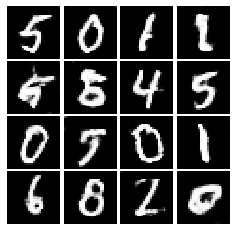

Epoch: 5, Iter: 2580, D: 0.2013, G:0.2998


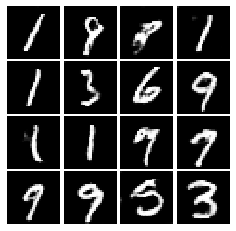

Epoch: 5, Iter: 2600, D: 0.2083, G:0.2056


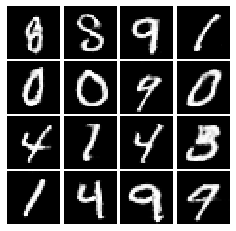

Epoch: 5, Iter: 2620, D: 0.1537, G:0.3119


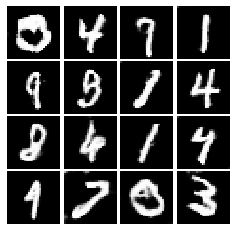

Epoch: 5, Iter: 2640, D: 0.129, G:0.2848


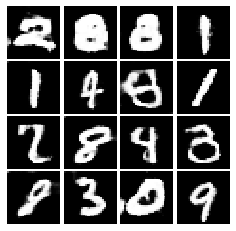

Epoch: 5, Iter: 2660, D: 0.1388, G:0.2478


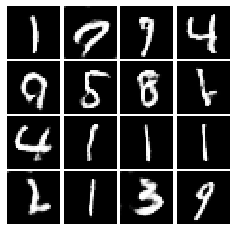

Epoch: 5, Iter: 2680, D: 0.1455, G:0.3496


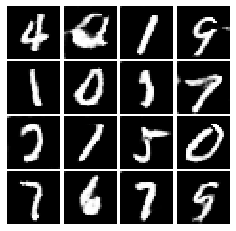

Epoch: 5, Iter: 2700, D: 0.1664, G:0.3515


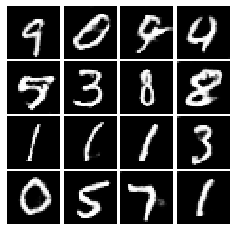

Epoch: 5, Iter: 2720, D: 0.177, G:0.2775


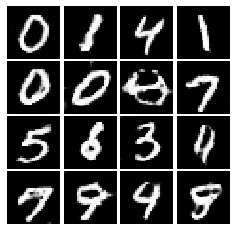

Epoch: 5, Iter: 2740, D: 0.1582, G:0.293


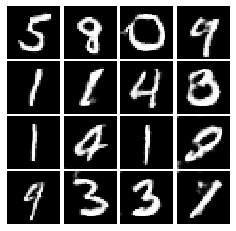

Epoch: 5, Iter: 2760, D: 0.1745, G:0.1973


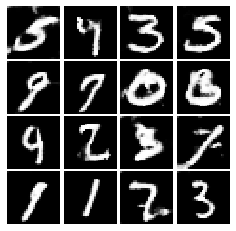

Epoch: 5, Iter: 2780, D: 0.1917, G:0.2364


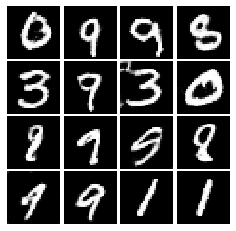

Epoch: 5, Iter: 2800, D: 0.1787, G:0.2407


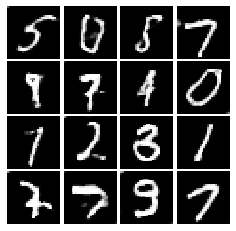

Epoch: 6, Iter: 2820, D: 0.1691, G:0.2002


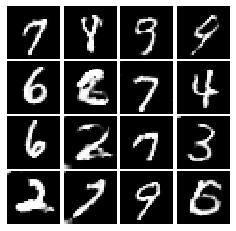

Epoch: 6, Iter: 2840, D: 0.1716, G:0.3099


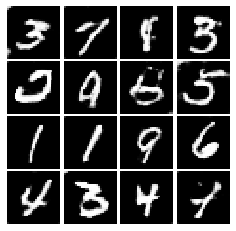

Epoch: 6, Iter: 2860, D: 0.1471, G:0.3107


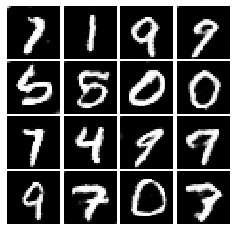

Epoch: 6, Iter: 2880, D: 0.1535, G:0.2415


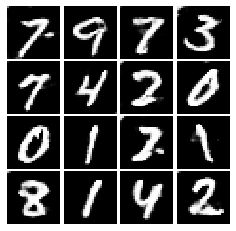

Epoch: 6, Iter: 2900, D: 0.1576, G:0.2292


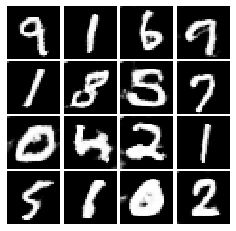

Epoch: 6, Iter: 2920, D: 0.1805, G:0.1755


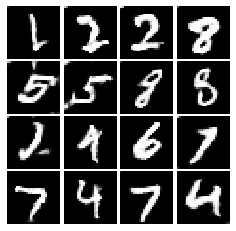

Epoch: 6, Iter: 2940, D: 0.1533, G:0.2613


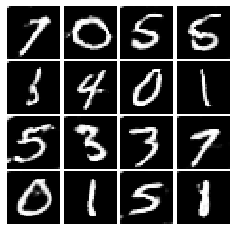

Epoch: 6, Iter: 2960, D: 0.1577, G:0.2266


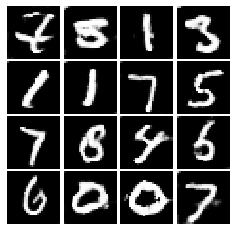

Epoch: 6, Iter: 2980, D: 0.1748, G:0.16


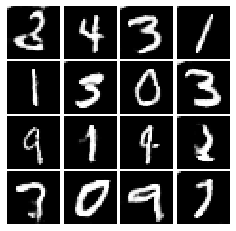

Epoch: 6, Iter: 3000, D: 0.1586, G:0.209


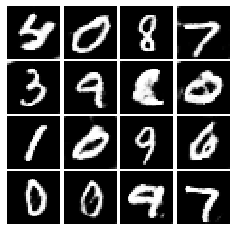

Epoch: 6, Iter: 3020, D: 0.1623, G:0.1992


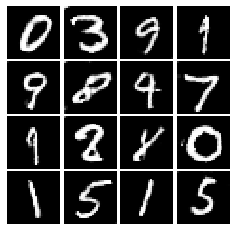

Epoch: 6, Iter: 3040, D: 0.1374, G:0.327


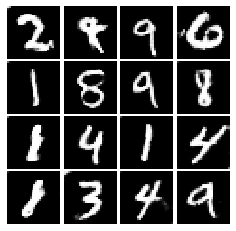

Epoch: 6, Iter: 3060, D: 0.1342, G:0.3221


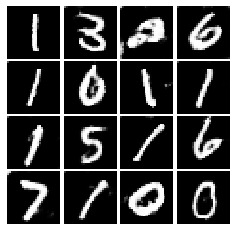

Epoch: 6, Iter: 3080, D: 0.1473, G:0.271


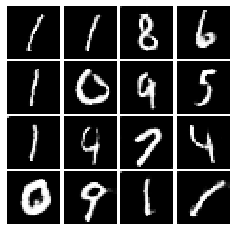

Epoch: 6, Iter: 3100, D: 0.1239, G:0.2554


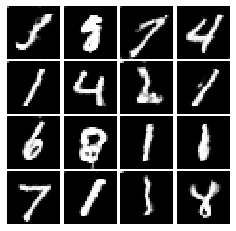

Epoch: 6, Iter: 3120, D: 0.1668, G:0.1911


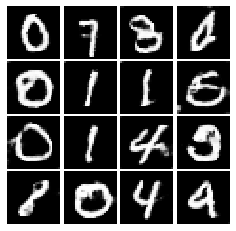

Epoch: 6, Iter: 3140, D: 0.156, G:0.2814


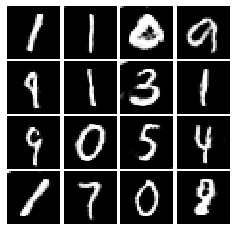

Epoch: 6, Iter: 3160, D: 0.1276, G:0.272


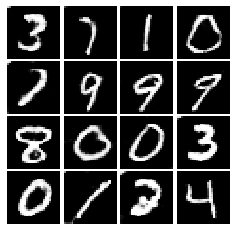

Epoch: 6, Iter: 3180, D: 0.1649, G:0.3853


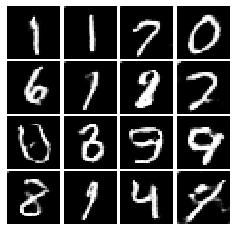

Epoch: 6, Iter: 3200, D: 0.1386, G:0.2838


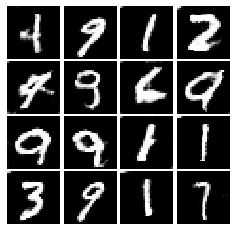

Epoch: 6, Iter: 3220, D: 0.138, G:0.3938


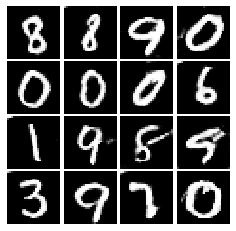

Epoch: 6, Iter: 3240, D: 0.1378, G:0.2769


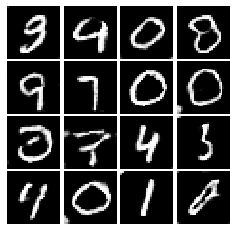

Epoch: 6, Iter: 3260, D: 0.1539, G:0.2864


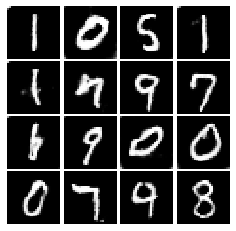

Epoch: 6, Iter: 3280, D: 0.2089, G:0.2615


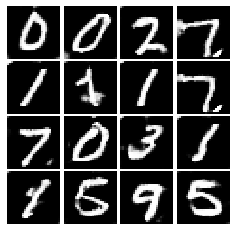

Epoch: 7, Iter: 3300, D: 0.1324, G:0.2835


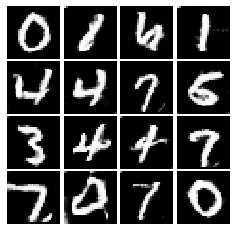

Epoch: 7, Iter: 3320, D: 0.1374, G:0.3313


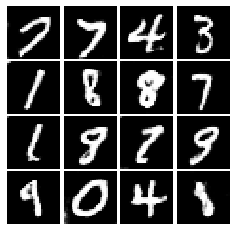

Epoch: 7, Iter: 3340, D: 0.1191, G:0.2006


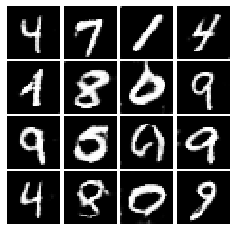

Epoch: 7, Iter: 3360, D: 0.1749, G:0.2883


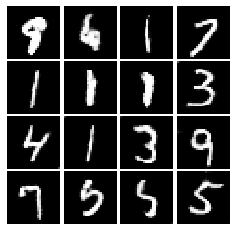

Epoch: 7, Iter: 3380, D: 0.157, G:0.4319


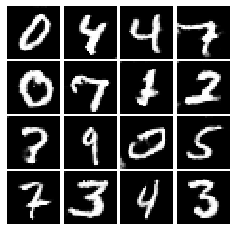

Epoch: 7, Iter: 3400, D: 0.1753, G:0.3953


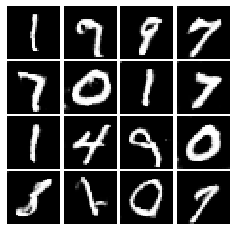

Epoch: 7, Iter: 3420, D: 0.1233, G:0.3149


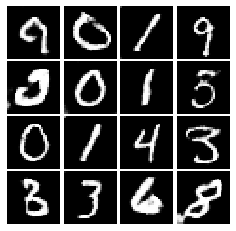

Epoch: 7, Iter: 3440, D: 0.1529, G:0.2886


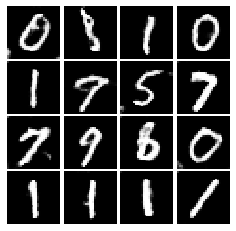

Epoch: 7, Iter: 3460, D: 0.144, G:0.2456


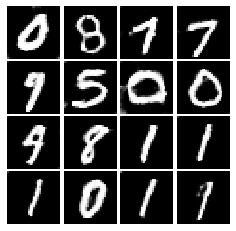

Epoch: 7, Iter: 3480, D: 0.1465, G:0.2928


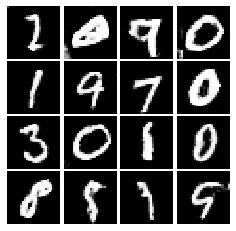

Epoch: 7, Iter: 3500, D: 0.1294, G:0.261


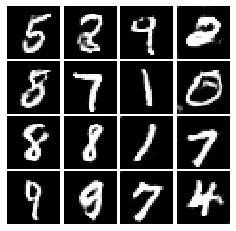

Epoch: 7, Iter: 3520, D: 0.1567, G:0.2671


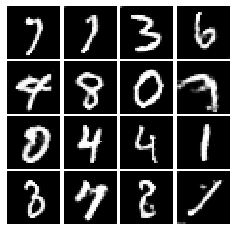

Epoch: 7, Iter: 3540, D: 0.137, G:0.2476


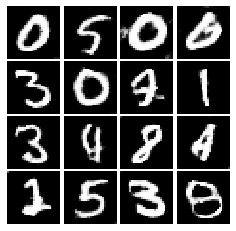

Epoch: 7, Iter: 3560, D: 0.1393, G:0.3916


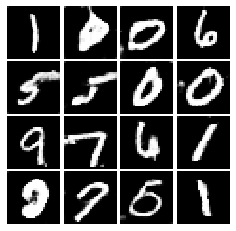

Epoch: 7, Iter: 3580, D: 0.1413, G:0.2034


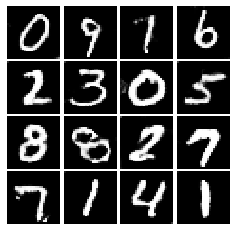

Epoch: 7, Iter: 3600, D: 0.173, G:0.3411


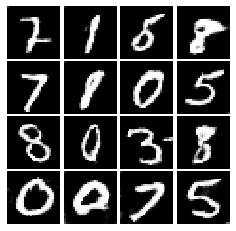

Epoch: 7, Iter: 3620, D: 0.1371, G:0.4279


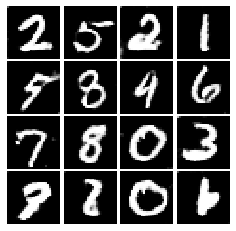

Epoch: 7, Iter: 3640, D: 0.1529, G:0.1991


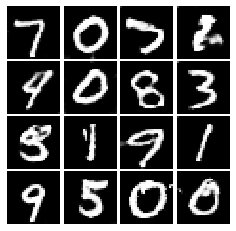

Epoch: 7, Iter: 3660, D: 0.1526, G:0.3342


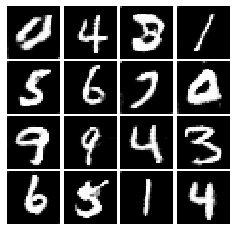

Epoch: 7, Iter: 3680, D: 0.1568, G:0.2425


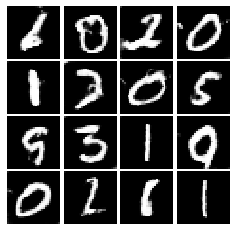

Epoch: 7, Iter: 3700, D: 0.1336, G:0.2676


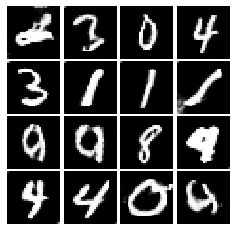

Epoch: 7, Iter: 3720, D: 0.1349, G:0.3581


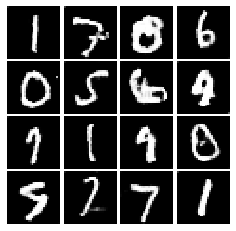

Epoch: 7, Iter: 3740, D: 0.1466, G:0.4104


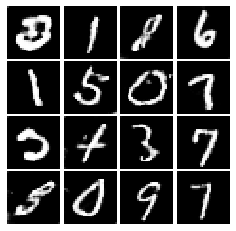

Epoch: 8, Iter: 3760, D: 0.1765, G:0.2275


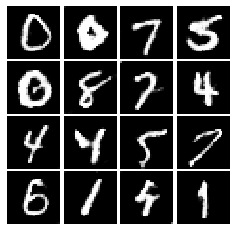

Epoch: 8, Iter: 3780, D: 0.1474, G:0.2434


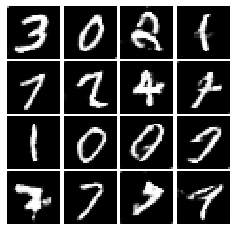

Epoch: 8, Iter: 3800, D: 0.1303, G:0.3293


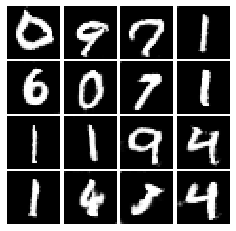

Epoch: 8, Iter: 3820, D: 0.1723, G:0.212


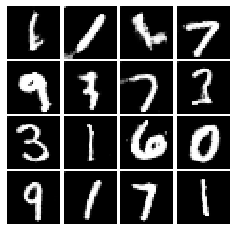

Epoch: 8, Iter: 3840, D: 0.1348, G:0.3747


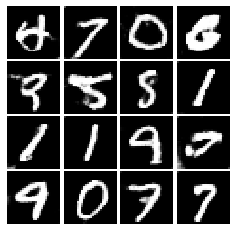

Epoch: 8, Iter: 3860, D: 0.1298, G:0.2899


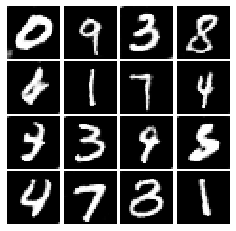

Epoch: 8, Iter: 3880, D: 0.143, G:0.2216


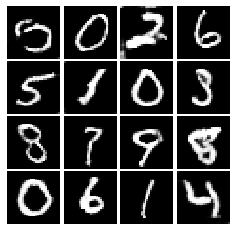

Epoch: 8, Iter: 3900, D: 0.1307, G:0.3066


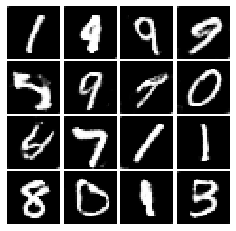

Epoch: 8, Iter: 3920, D: 0.124, G:0.2738


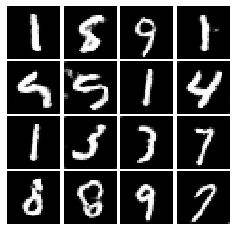

Epoch: 8, Iter: 3940, D: 0.1557, G:0.2373


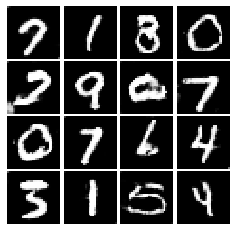

Epoch: 8, Iter: 3960, D: 0.1351, G:0.2724


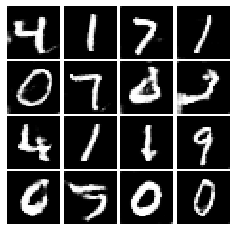

Epoch: 8, Iter: 3980, D: 0.1456, G:0.2222


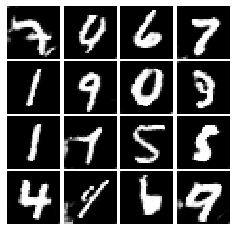

Epoch: 8, Iter: 4000, D: 0.2056, G:0.1333


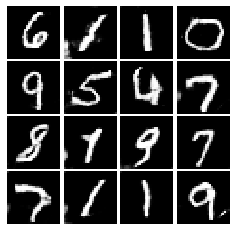

Epoch: 8, Iter: 4020, D: 0.1981, G:0.159


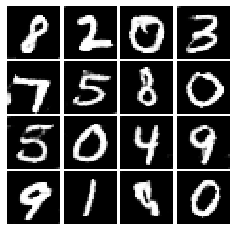

Epoch: 8, Iter: 4040, D: 0.1486, G:0.2326


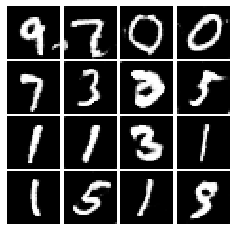

Epoch: 8, Iter: 4060, D: 0.191, G:0.1836


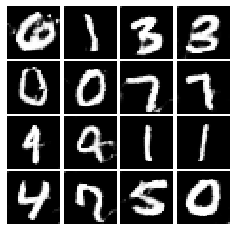

Epoch: 8, Iter: 4080, D: 0.154, G:0.2497


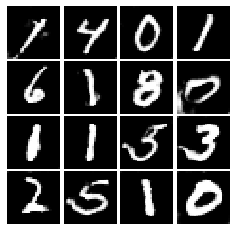

Epoch: 8, Iter: 4100, D: 0.1163, G:0.25


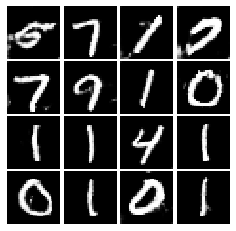

Epoch: 8, Iter: 4120, D: 0.1206, G:0.3085


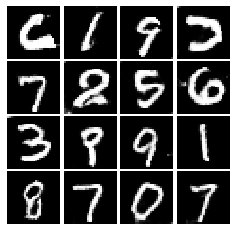

Epoch: 8, Iter: 4140, D: 0.1167, G:0.2077


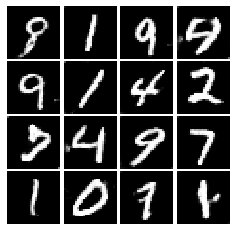

Epoch: 8, Iter: 4160, D: 0.124, G:0.317


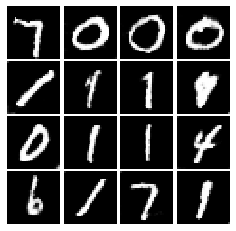

Epoch: 8, Iter: 4180, D: 0.1532, G:0.3585


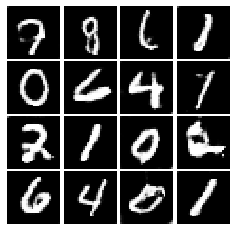

Epoch: 8, Iter: 4200, D: 0.1366, G:0.4544


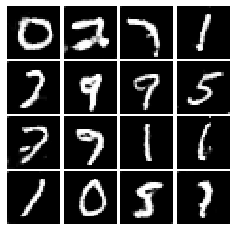

Epoch: 8, Iter: 4220, D: 0.1444, G:0.2975


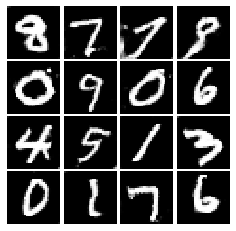

Epoch: 9, Iter: 4240, D: 0.1333, G:0.2705


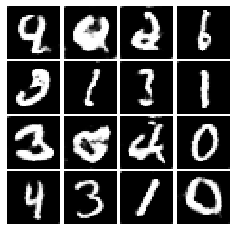

Epoch: 9, Iter: 4260, D: 0.1401, G:0.3249


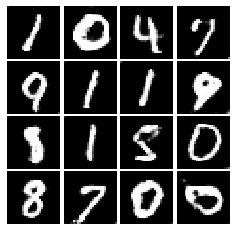

Epoch: 9, Iter: 4280, D: 0.12, G:0.3065


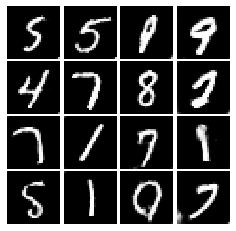

Epoch: 9, Iter: 4300, D: 0.134, G:0.2938


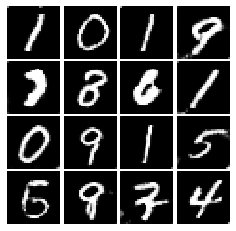

Epoch: 9, Iter: 4320, D: 0.1289, G:0.255


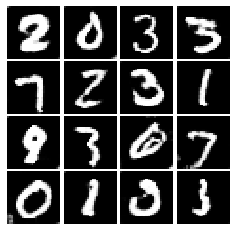

Epoch: 9, Iter: 4340, D: 0.1109, G:0.3102


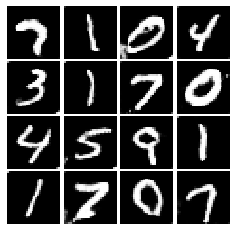

Epoch: 9, Iter: 4360, D: 0.1246, G:0.3197


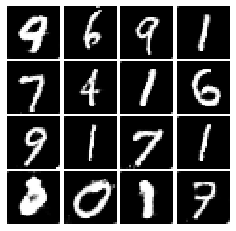

Epoch: 9, Iter: 4380, D: 0.1379, G:0.2211


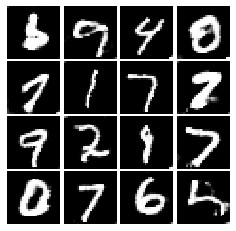

Epoch: 9, Iter: 4400, D: 0.147, G:0.2203


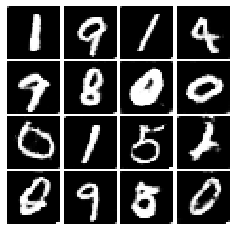

Epoch: 9, Iter: 4420, D: 0.1205, G:0.2939


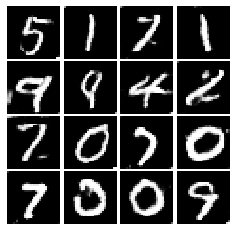

Epoch: 9, Iter: 4440, D: 0.1465, G:0.3327


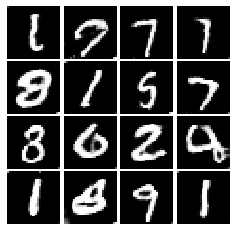

Epoch: 9, Iter: 4460, D: 0.09543, G:0.3587


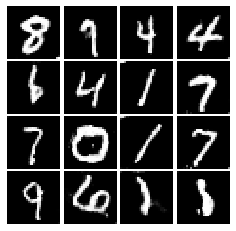

Epoch: 9, Iter: 4480, D: 0.1324, G:0.3217


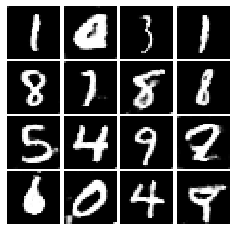

Epoch: 9, Iter: 4500, D: 0.1283, G:0.1819


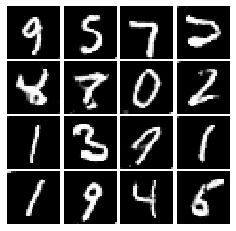

Epoch: 9, Iter: 4520, D: 0.1255, G:0.391


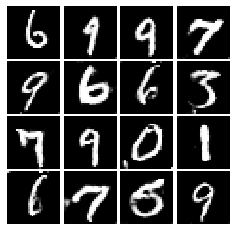

Epoch: 9, Iter: 4540, D: 0.1575, G:0.2266


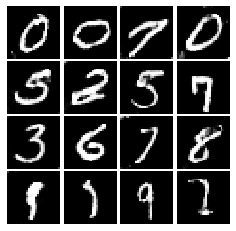

Epoch: 9, Iter: 4560, D: 0.1246, G:0.3663


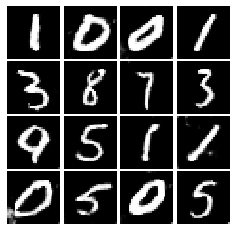

Epoch: 9, Iter: 4580, D: 0.09235, G:0.3187


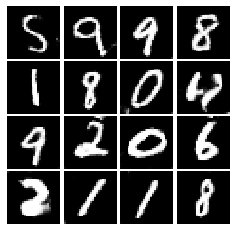

Epoch: 9, Iter: 4600, D: 0.1427, G:0.2792


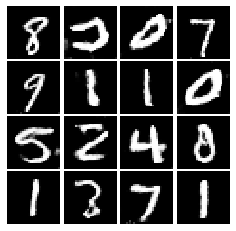

Epoch: 9, Iter: 4620, D: 0.1272, G:0.2873


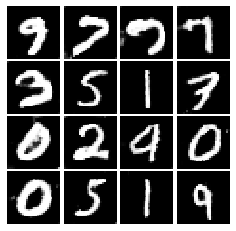

Epoch: 9, Iter: 4640, D: 0.1018, G:0.3141


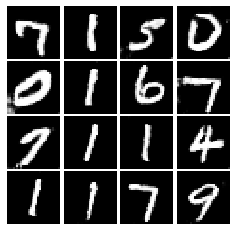

Epoch: 9, Iter: 4660, D: 0.1202, G:0.3652


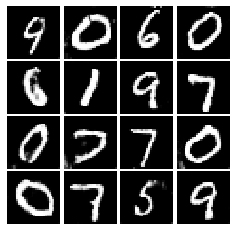

Epoch: 9, Iter: 4680, D: 0.1265, G:0.46


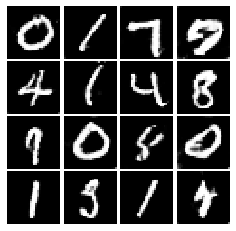

Final images


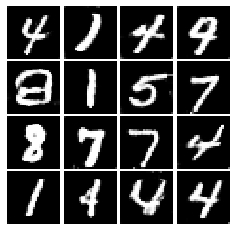

In [17]:
D = DC_Discriminator()
G = DC_Generator()

# Use the function you wrote earlier to get optimizers for the Discriminator and the Generator
D_solver = tf.keras.optimizers.Adam(learning_rate=1e-3, beta_1=0.5, beta_2=0.999)
G_solver = tf.keras.optimizers.Adam(learning_rate=1e-3, beta_1=0.5, beta_2=0.999)
    
# Run it!
#print(G.summary())
train(D, G, D_solver, G_solver, ls_discriminator_loss,ls_generator_loss)

### Section 2.3 Conclusion. [10 pts]
You have successfully trained you GAN models. Hurray! Now, we want you to answer the following question in few sentences.
1. Have you observed any difference between GAN and LSGAN (e.g. training, generation quality)?
2. What is the difference between output of the simple GAN (Part 1) and output of the DCGAN ? 
3. How can you quantitatively evaluate your GAN model? Is the metric(s) meaningful? Is there any drawback about this metric(s)?

1. **Difference between GAN and LSGAN :**  Since LSGAN is a more stable alternative to the Vanilla GAN, we see better generation quality in LSGAN over the epochs. The quality of the images generated seem to be higher than the ones generated by the Vanilla GAN and the generator learns better with the LSGAN loss function. 
2. **Difference between Simple GAN and DCGAN :** The images generated by the DCGAN are sharper and clearer. The DCGAN with Least Square loss functions performs best out of all, generating the best images of the digits, with well established, clear edges. The images generated by the Vanilla simple GAN are noisy.
3. **Quantitative evaluation of GAN:** Visual examination of samples by humans is one of the common and most intuitive ways to evaluate GANs since they lack an objective function, which makes it difficult to compare performance of different models. The Generator loss/error used here is not a comprehensive metric to evaluate the model.
 Usually, Inception score and Frechet Inception distance capture the quality and diversity of generated images, both alone (former) and compared to real images (latter).Both measures are easy to implement and calculate on batches of generated images.A higher inception score indicates better-quality generated images, hence its easy to understand. They are meaningful measures since they estimate how well the generator captures the probability distribution of images in the domain. But IS does not detect overfitting. Also, it may favour a model that generated good images rather than realistic images.  
 The nearest neighbor distance score can be used to qualitatively summarize generated images. There is no single and best agreed upon quantitative measure to evaluate GAN models. 